In [128]:
import pickle

In [129]:

import requests
import pandas as pd

proxy = ""  # In case you need a proxy
proxies = {"http": proxy, "https": proxy}
sesion = requests.Session()
sesion.proxies = proxies
##hiddenimports=['pywt._extensions._cwt'],
from skimage import io
import os
import numpy as np
import numpy
import skimage
from skimage import data, io, filters, color, exposure
import matplotlib.pyplot as plt
%matplotlib inline

import scipy as sp

import matplotlib.pyplot as plt
from skimage import data, io, filters, color, exposure
from sklearn.feature_extraction.image import grid_to_graph
from sklearn.cluster import AgglomerativeClustering
##conda install -c conda-forge opencv



##from .cv2 import *
##import opencv
##import cv2





import time as time


In [130]:
##pkl_file = open('all_images_1000.pkl', 'rb')  
##pkl_file = open('file_names_1000.pkl', 'rb')
pkl_file = open('chicago_buildings_sqft_geocoded.pkl', 'rb')  
buildings= pickle.load(pkl_file)
pkl_file.close()  

pkl_file = open('chicago_buildings_sqft_geocoded_tag.pkl', 'rb') 
image_tags= pickle.load(pkl_file)
pkl_file.close()  

pkl_file = open('chicago_buildings_sqft_geocoded_img.pkl', 'rb') 
all_images= pickle.load(pkl_file)
pkl_file.close()  



In [131]:
buildings.head()

,index,bldg_id,bldg_sq_fo,footprint_,no_of_unit,no_stories,orig_bldg_,pre_dir1,shape_area,shape_len,...,x_coord,y_coord,year_built,z_coord,rand,sample,AreaSqMi,CentroidX,CentroidY,latlong
0,3,455892,1480,AERIALS98,2,0,455892,S,873.750,128.582300,...,1.169100e+06,1.871774e+06,1918,0,0.012691,1,0.000031,-87.655350,41.803660,"-87.6553496217099,41.8036596151415"
1,7,845465,0,AERIALS,0,0,845465,W,17864.485,704.144707,...,1.132598e+06,1.927450e+06,2006,0,0.040056,1,0.000641,-87.787886,41.957307,"-87.7878860608839,41.9573071437222"
2,12,362554,48500,AERIALS98,0,0,362554,S,9656.500,393.081421,...,1.169924e+06,1.898285e+06,1920,0,0.068290,1,0.000346,-87.651559,41.876377,"-87.6515591622159,41.8763772601835"
3,13,183757,0,AERIALS98,8,0,183757,W,3075.625,270.228296,...,1.139646e+06,1.923501e+06,1968,0,0.129195,1,0.000110,-87.762089,41.946197,"-87.7620892177341,41.9461967538786"
4,16,374824,0,AERIALS98,0,0,374824,W,7466.875,609.748992,...,1.167495e+06,1.893057e+06,0,0,0.025851,1,0.000268,-87.660486,41.862177,"-87.660486146882,41.8621767117838"


In [132]:
len(buildings)

937

In [133]:
pwd

'C:\\Users\\taras\\Desktop\\UChicago\\Capstone Project\\geofeatures\\005 SQFT\\chicago'

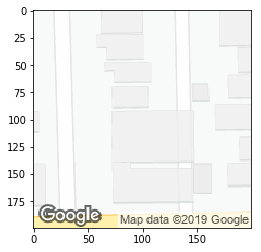

In [134]:
plt.imshow((all_images[7]))

### Testing on 1 Image

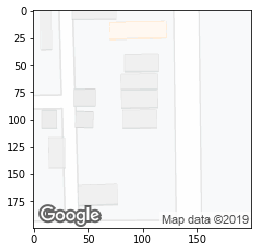

In [135]:
img=all_images[0]
plt.imshow(img)

In [136]:
##b,g,r = cv2.split(img)

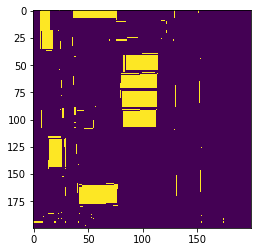

In [137]:
    #########Cleaning the immage
    b = img[:,:,1]
    ##b=img
    center = b[95:105, 95:105]
    center
        ##center = img[180:220, 180:220]
    median=int(np.median(center))
    median
    img_main=     b==median
    plt.imshow(img_main)


In [138]:
 img_main

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [139]:
#### Seperating buildings
st = time.time()
X = np.reshape(img_main, (-1, 1))

connectivity = grid_to_graph(*img_main.shape)

n_clusters =20  # number of regions
ward = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', connectivity=connectivity)
ward.fit(X)
label = np.reshape(ward.labels_, img_main.shape)
#### isoliating the middle cluster and calculating area
center = label[95:105, 95:105] 
median=int(np.median(center))
median
label_main=label==median
label_main=label_main.astype(int)
pixel_area=sum(1 for row in label      for i in row if i==median)
print("Elapsed time: ", time.time() - st)

Elapsed time:  2.711459159851074


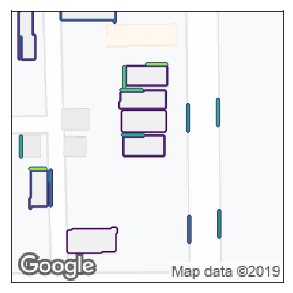

435


In [142]:
    # Plot the results on an image
    image=img
    plt.figure(figsize=(5, 5))
    plt.imshow(image, cmap=plt.cm.gray)
    plt.contour(label, contours=1)
    ##plt.contour(label_main, contours=1,colors=['#DC143C'])
    plt.xticks(())
    plt.yticks(())
    plt.show()

    print (pixel_area)

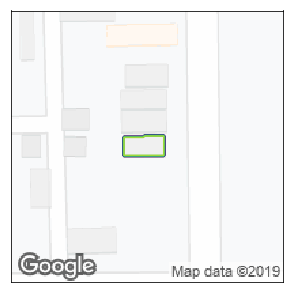

435


In [141]:
    # Plot the results on an image
    image=img
    plt.figure(figsize=(5, 5))
    plt.imshow(image, cmap=plt.cm.gray)

    plt.contour(label_main)
    plt.xticks(())
    plt.yticks(())
    plt.show()

    print (pixel_area)

# Turning it into a loop

Elapsed time:  4.610700607299805


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


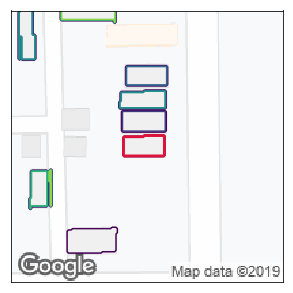

0
873.75
435
Elapsed time:  4.61365270614624


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


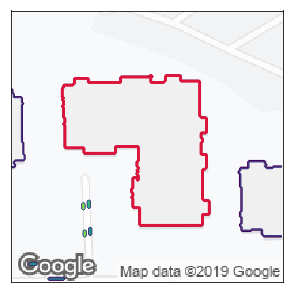

1
17864.485
7949
Elapsed time:  4.723893404006958


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


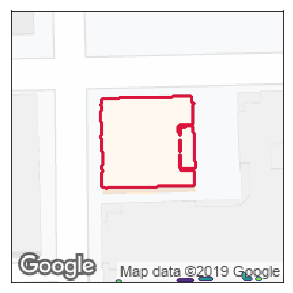

2
9656.5
4373
Elapsed time:  4.663555145263672


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


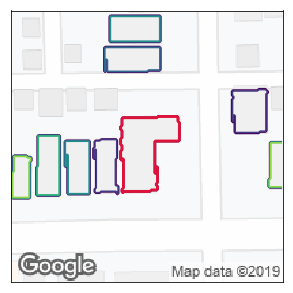

3
3075.625
1632
Elapsed time:  4.440835475921631


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


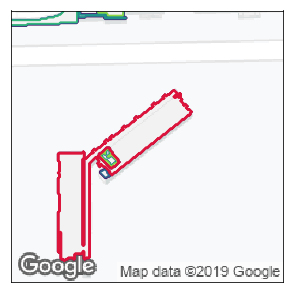

4
7466.875
3145
Elapsed time:  5.310785531997681


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


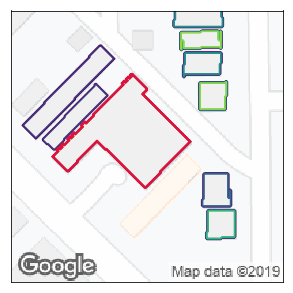

5
5174.96
3636
Elapsed time:  4.547099590301514


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


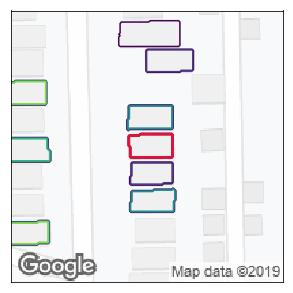

6
1351.75
528
Elapsed time:  4.61566948890686


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


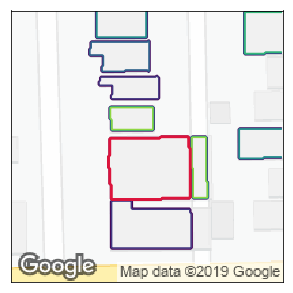

7
2666.25
2646
Elapsed time:  4.258649826049805


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


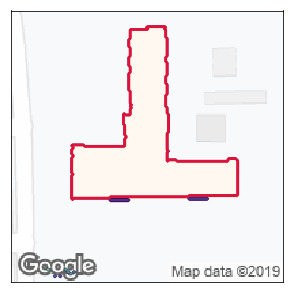

8
13690.875
6418
Elapsed time:  4.669477462768555


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


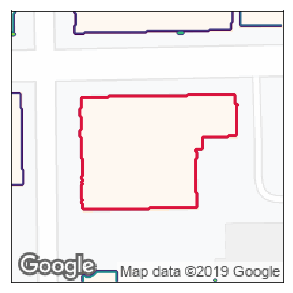

9
18257.625
7893


In [86]:
pixel_area_list=[]
for i in range(10):
##for i in range(len(buildings)):
    try:
        #########Cleaning the immage
        img=all_images[i]
        try:
            b = img[:,:,1]
            center = b[95:105, 95:105]
            median=int(np.median(center))
            median
            img_main=b==median
            ##plt.imshow(img_main)
        except:
            b=img
            center = b[95:105, 95:105]
            median=int(np.median(center))
            median
            img_main=b==median
            plt.imshow(img_main)
        #### Seperating buildings
        st = time.time()
        X = np.reshape(img_main, (-1, 1))

        connectivity = grid_to_graph(*img_main.shape)

        n_clusters =10  # number of regions
        ward = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', connectivity=connectivity)
        ward.fit(X)
        label = np.reshape(ward.labels_, img_main.shape)
        #### isoliating the middle cluster and calculating area
        center = label[95:105, 95:105]
        median=int(np.median(center))
        median
        label_main=label==median
        label_main=label_main.astype(int)
        pixel_area=sum(1 for row in label      for i in row if i==median)
        print("Elapsed time: ", time.time() - st)
        # Plot the results on an image
        image=img
        plt.figure(figsize=(5, 5))
        plt.imshow(image, cmap=plt.cm.gray)
        plt.contour(label, contours=1)
        plt.contour(label_main, contours=1,colors=['#DC143C'])
        plt.xticks(())
        plt.yticks(())
        plt.show()

        print (i)
        print(buildings['shape_area'][i])
        print (pixel_area)
        pixel_area_list.append(pixel_area)
    except:
        print (i)
        print ("Fail")
        pixel_area_list.append(-5)

Elapsed time:  4.655921697616577


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


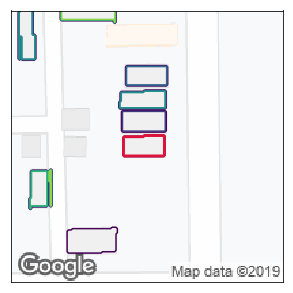

0
873.75
435
Elapsed time:  4.390272617340088


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


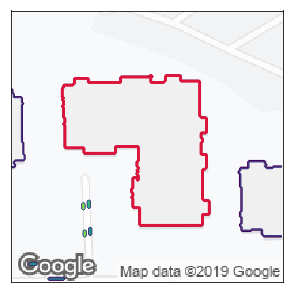

1
17864.485
7949
Elapsed time:  4.524261474609375


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


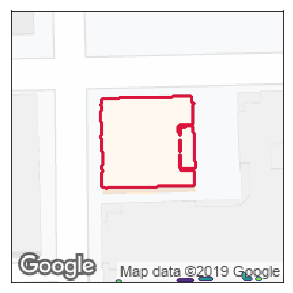

2
9656.5
4373
Elapsed time:  5.333076000213623


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


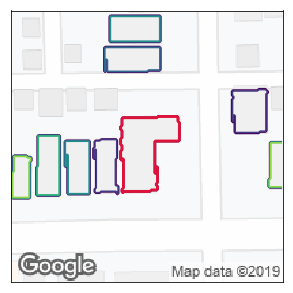

3
3075.625
1632
Elapsed time:  4.689196348190308


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


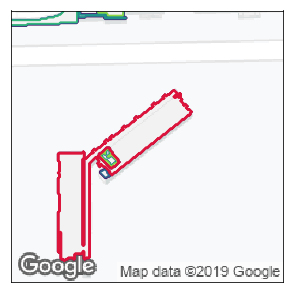

4
7466.875
3145
Elapsed time:  4.845065116882324


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


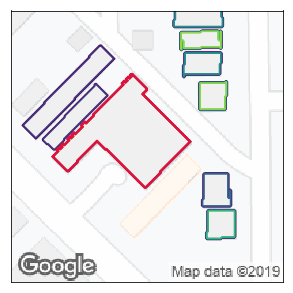

5
5174.96
3636
Elapsed time:  4.680295705795288


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


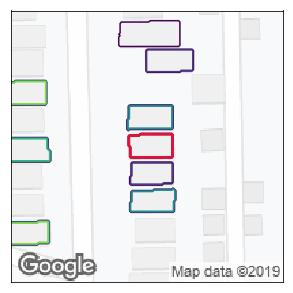

6
1351.75
528
Elapsed time:  4.30848503112793


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


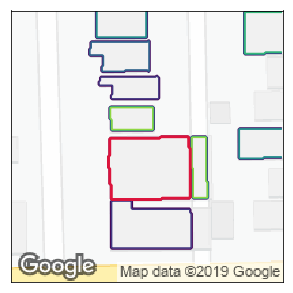

7
2666.25
2646
Elapsed time:  4.281555652618408


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


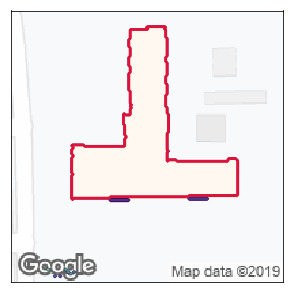

8
13690.875
6418
Elapsed time:  4.8260838985443115


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


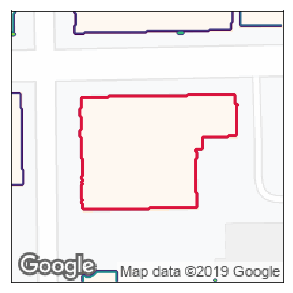

9
18257.625
7893
Elapsed time:  4.552490234375


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


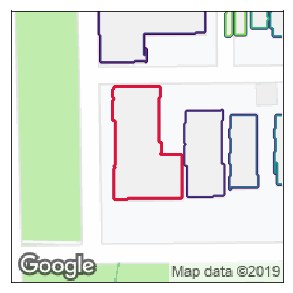

10
6932.875
3272
Elapsed time:  4.681344747543335


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


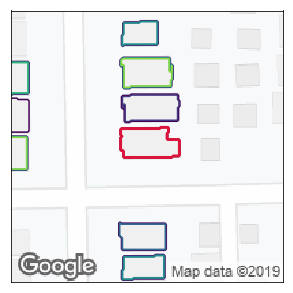

11
1413.25
824
Elapsed time:  4.636590003967285


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


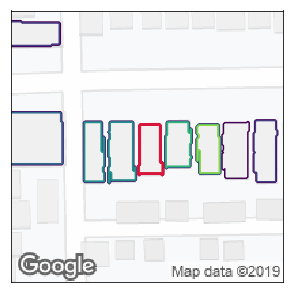

12
1058.5
564
Elapsed time:  4.794463872909546


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


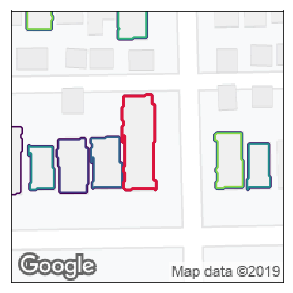

13
4889.625
1533
Elapsed time:  5.311784029006958


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


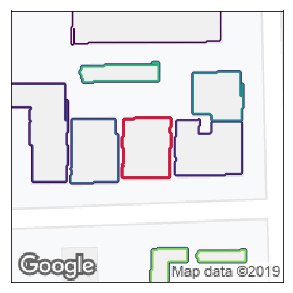

14
2929.5
1523
Elapsed time:  4.606670618057251


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


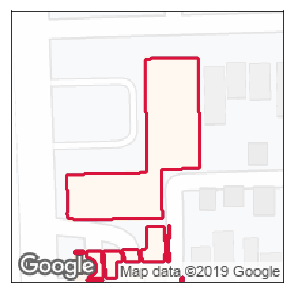

15
11996.625
33564
Elapsed time:  5.088973760604858


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


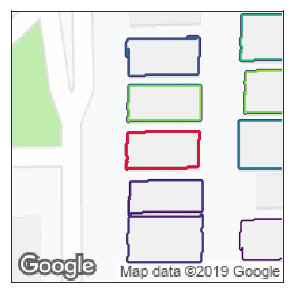

16
2923.5
1404
Elapsed time:  4.94491171836853


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


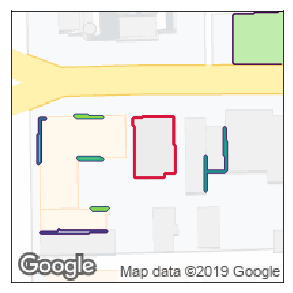

17
2887.875
1305
Elapsed time:  4.871000528335571


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


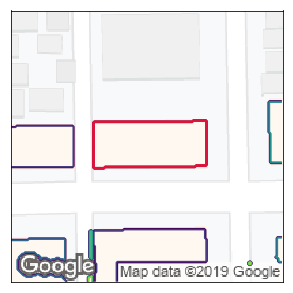

18
5896.0
2749
Elapsed time:  5.0108044147491455


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


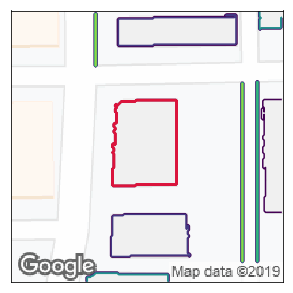

19
6893.5
2825
Elapsed time:  4.891952037811279


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


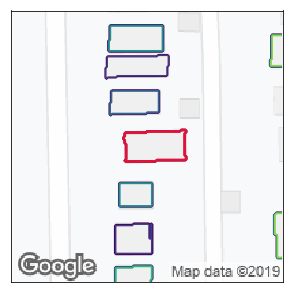

20
3067.375
929
Elapsed time:  4.9029176235198975


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


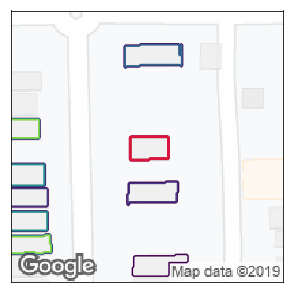

21
892.5
462
Elapsed time:  5.210202932357788


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


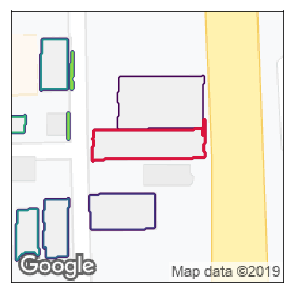

22
3538.615
1737
Elapsed time:  4.927846670150757


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


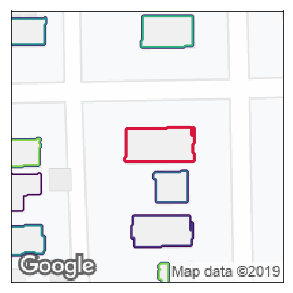

23
2864.5
1210
Elapsed time:  4.947797060012817


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


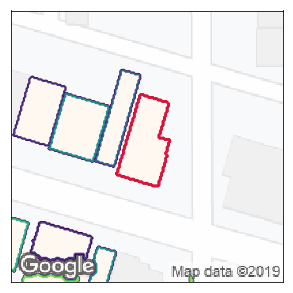

24
3395.5
1668
Elapsed time:  4.901984691619873


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


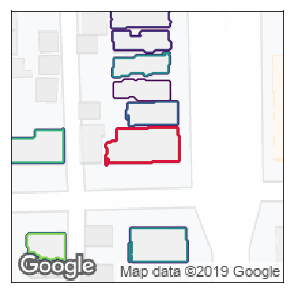

25
2689.79
1264
Elapsed time:  4.9996178150177


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


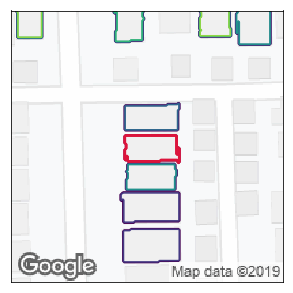

26
1419.0
716
Elapsed time:  4.967742443084717


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


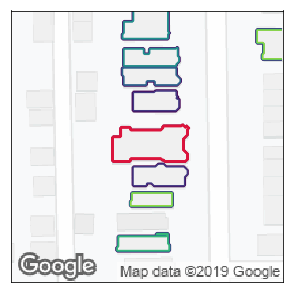

27
2916.0
1223
Elapsed time:  4.938061714172363


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


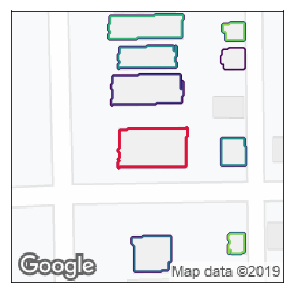

28
3216.375
1381
Elapsed time:  4.77788233757019


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


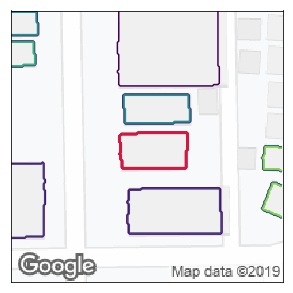

29
2539.75
1249
Elapsed time:  4.675071954727173


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


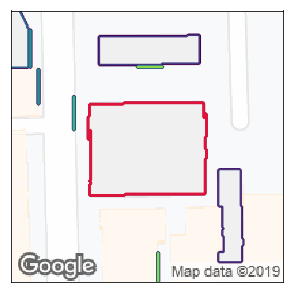

30
12246.0
5687
Elapsed time:  4.640762805938721


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


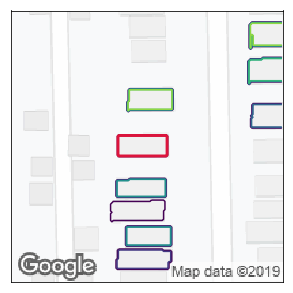

31
1160.375
540
Elapsed time:  5.181315660476685


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


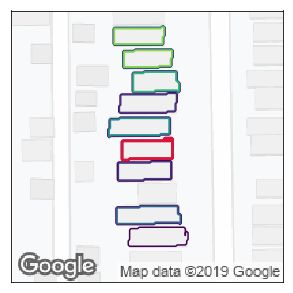

32
1340.875
493
Elapsed time:  4.686197757720947


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


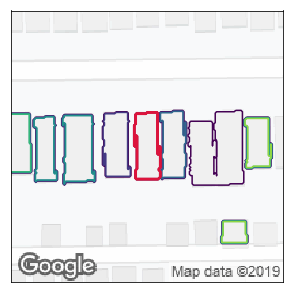

33
1559.125
806
Elapsed time:  4.899915456771851


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


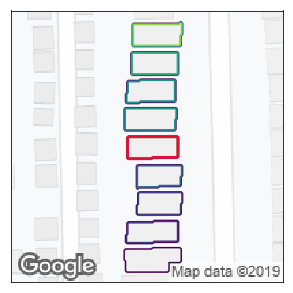

34
1223.625
573
Elapsed time:  5.138890266418457


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


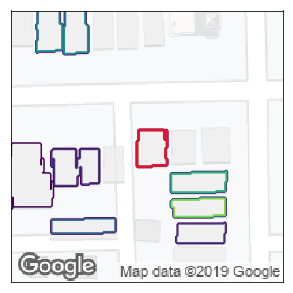

35
1035.875
560
Elapsed time:  5.032531261444092


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


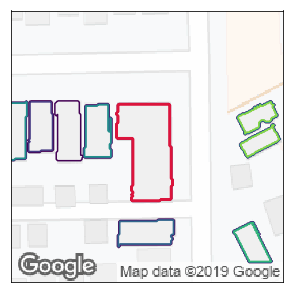

36
4289.0
2250
Elapsed time:  5.2751405239105225


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


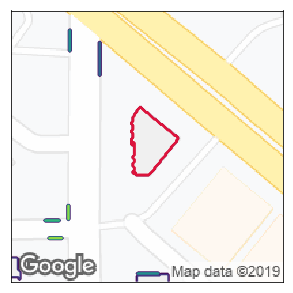

37
2769.875
1028
Elapsed time:  4.716498613357544


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


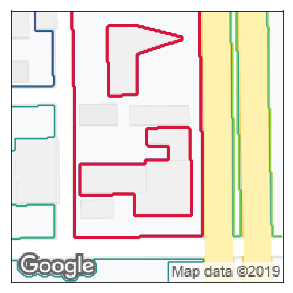

38
3398.105
10916
Elapsed time:  4.87784481048584


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


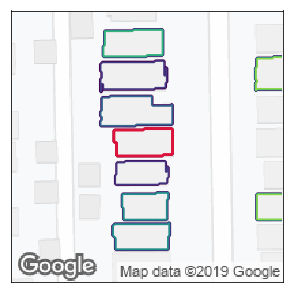

39
1678.0
811
Elapsed time:  4.774893760681152


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


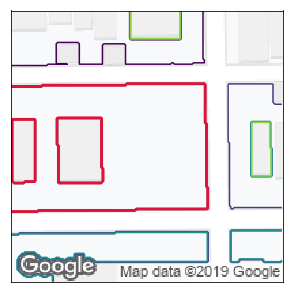

40
7547.75
10883
Elapsed time:  4.9965434074401855


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


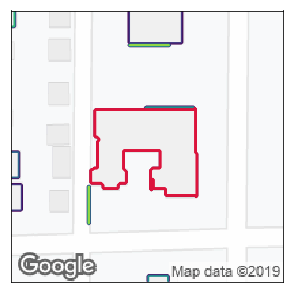

41
7943.75
3741
Elapsed time:  4.875946998596191


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


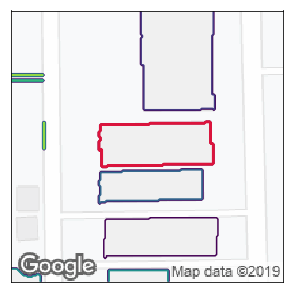

42
4399.125
2477
Elapsed time:  4.756271839141846


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


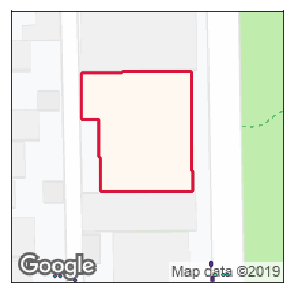

43
5353.965
6399
Elapsed time:  5.094229459762573


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


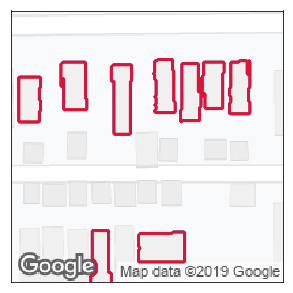

44
875.625
34977
Elapsed time:  4.9657883644104


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


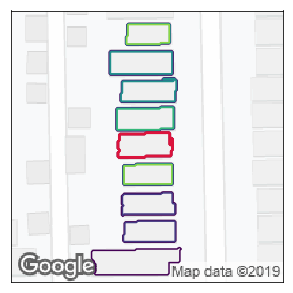

45
1208.75
656
Elapsed time:  4.812153100967407


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


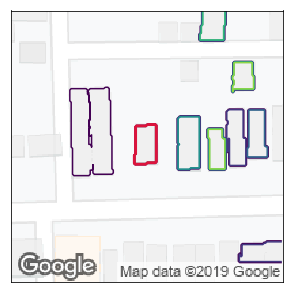

46
891.5
427
Elapsed time:  4.73243260383606


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


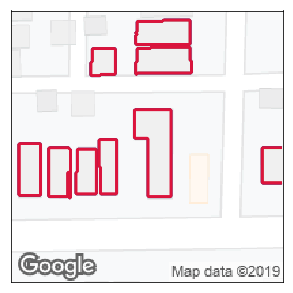

47
3189.375
34389
Elapsed time:  4.963711500167847


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


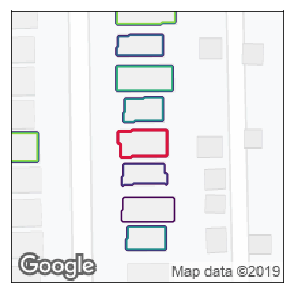

48
1547.625
664
Elapsed time:  6.5055882930755615


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


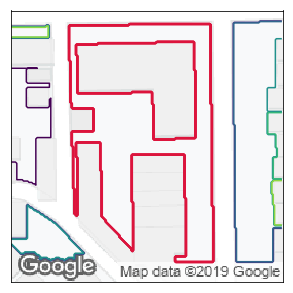

49
19649.625
8215
Elapsed time:  5.629162311553955


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


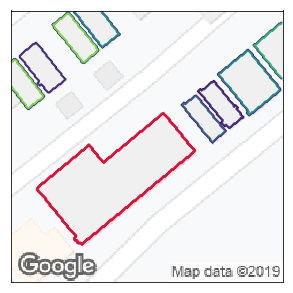

50
4302.0
4718
Elapsed time:  4.668657541275024


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


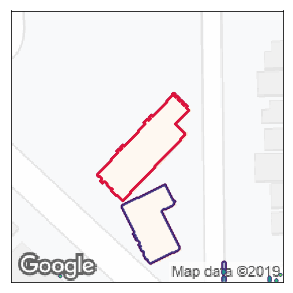

51
4937.47
2041
Elapsed time:  5.615151882171631


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


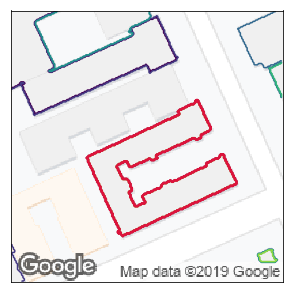

52
9770.625
4239
Elapsed time:  5.126574516296387


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


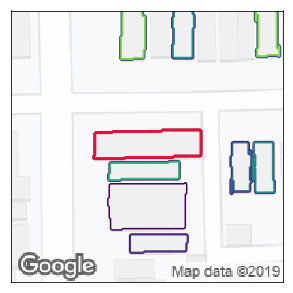

53
3411.0
1502
Elapsed time:  4.673487424850464


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


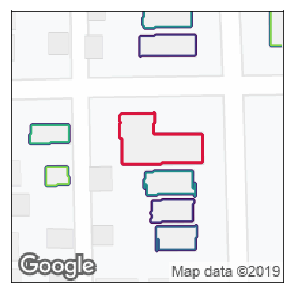

54
2984.5
1655
Elapsed time:  5.167038679122925


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


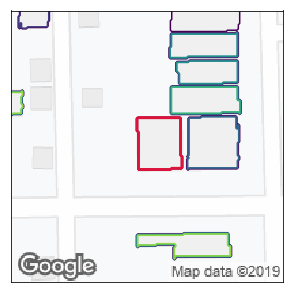

55
4939.25
1190
Elapsed time:  5.159023761749268


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


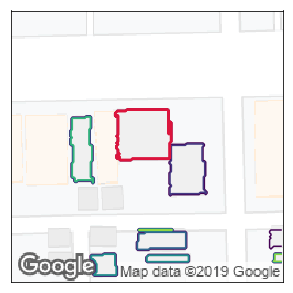

56
3495.0
1379
Elapsed time:  5.462862014770508


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


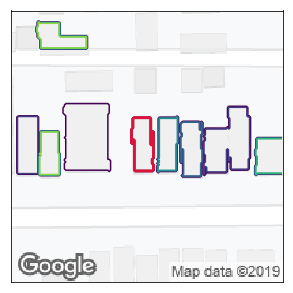

57
1324.5
539
Elapsed time:  5.3696653842926025


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


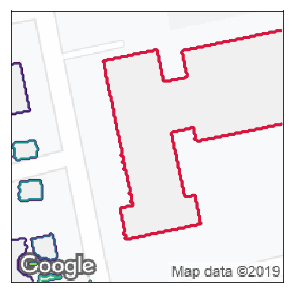

58
12728.5
10891
Elapsed time:  5.506727457046509


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


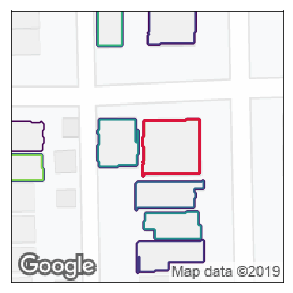

59
6117.625
1626
Elapsed time:  5.421488523483276


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


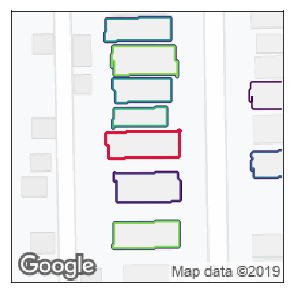

60
2117.75
1007
Elapsed time:  6.515563488006592


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


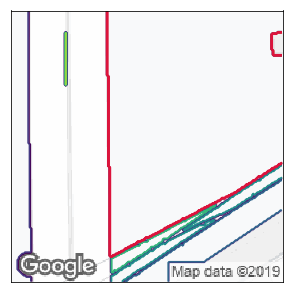

61
5825.0
18829
Elapsed time:  8.652284145355225


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


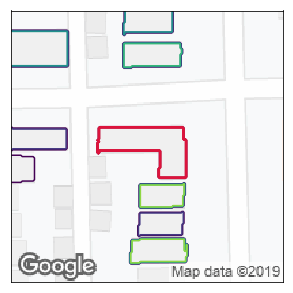

62
3286.5
1466
Elapsed time:  6.4240264892578125


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


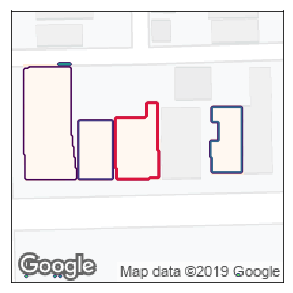

63
3579.885
1490
Elapsed time:  7.095021963119507


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


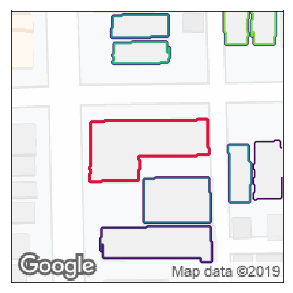

64
4566.625
2884
Elapsed time:  4.753448247909546


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


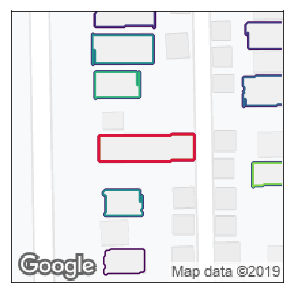

65
2634.25
1330
Elapsed time:  4.914881706237793


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


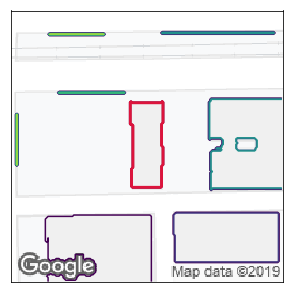

66
3373.875
1379
Elapsed time:  5.028831481933594


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


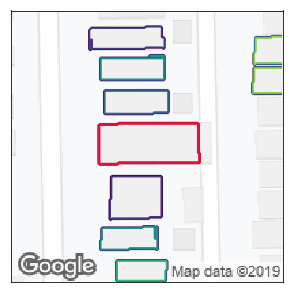

67
3796.0
2124
Elapsed time:  5.061962604522705


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


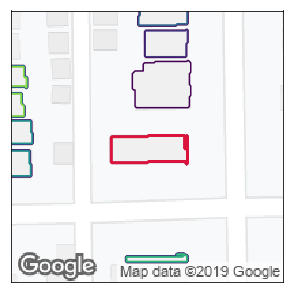

68
2916.0
1056
Elapsed time:  4.811124086380005


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


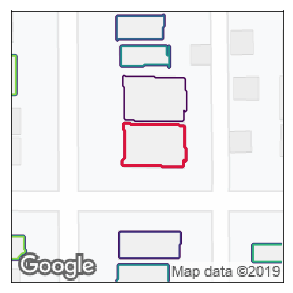

69
2765.63
1356
Elapsed time:  5.740998983383179


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


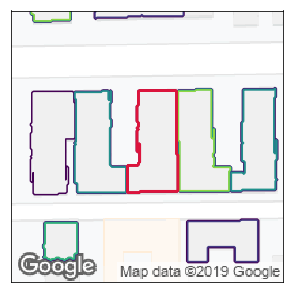

70
8924.855
2275
Elapsed time:  5.208867073059082


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


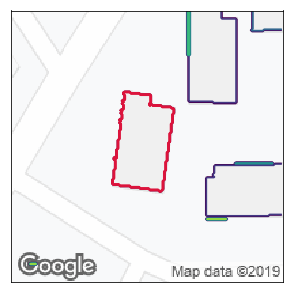

71
5049.875
2416
Elapsed time:  5.5351855754852295


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


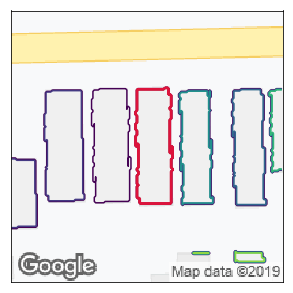

72
4281.75
2065
Elapsed time:  6.491163969039917


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


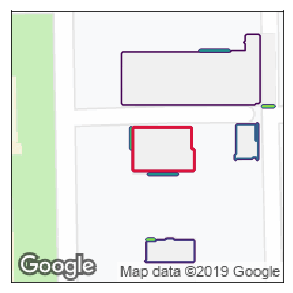

73
3093.5
1408
Elapsed time:  6.16597580909729


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


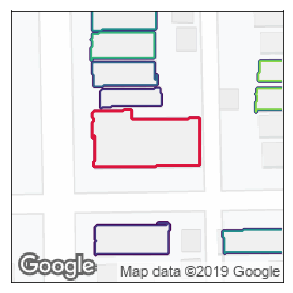

74
5390.125
2877
Elapsed time:  5.6451051235198975


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


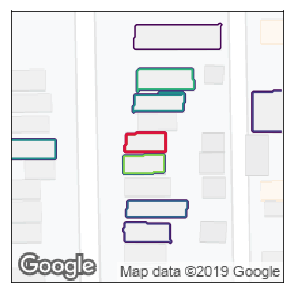

75
877.625
404
Elapsed time:  5.120440244674683


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


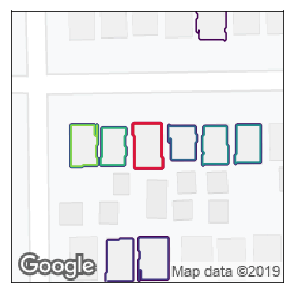

76
1356.5
677
Elapsed time:  5.328768253326416


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


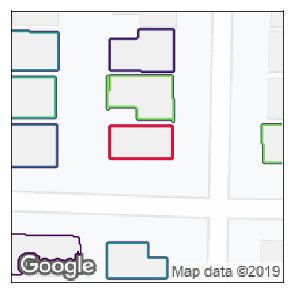

77
2527.0
1104
Elapsed time:  5.227410793304443


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


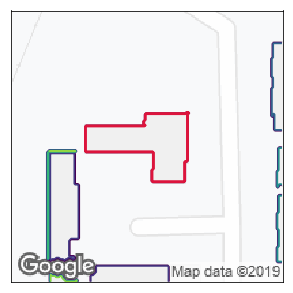

78
4753.875
2238
Elapsed time:  4.834455966949463


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


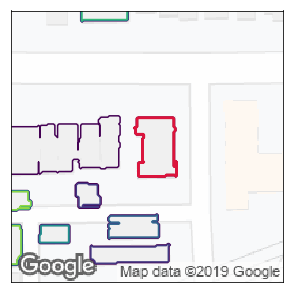

79
2687.5
1083
Elapsed time:  4.968449115753174


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


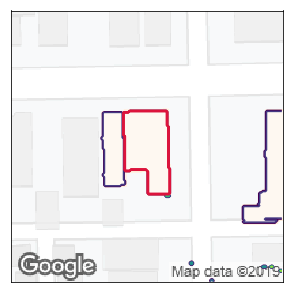

80
3594.625
1673
Elapsed time:  5.44944167137146


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


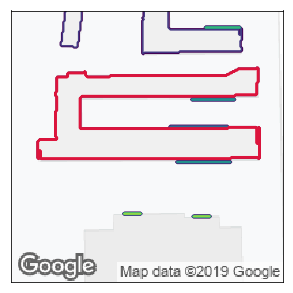

81
15237.75
6181
Elapsed time:  4.746297121047974


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


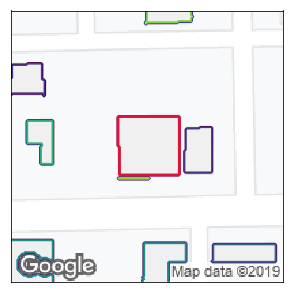

82
2732.8
1914
Elapsed time:  4.766515731811523


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


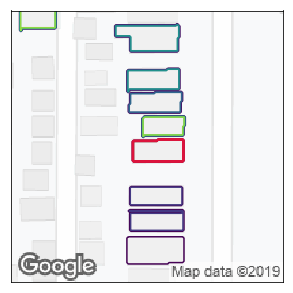

83
1328.375
574
Elapsed time:  5.103043079376221


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


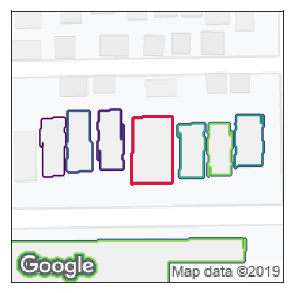

84
2952.875
1437
Elapsed time:  4.85998797416687


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


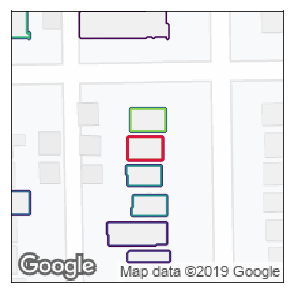

85
1234.625
442
Elapsed time:  4.832045555114746


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


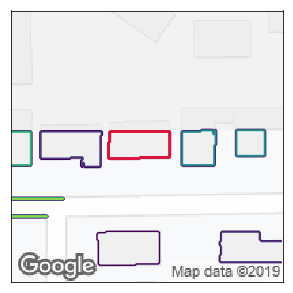

86
2538.125
870
Elapsed time:  4.884931325912476


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


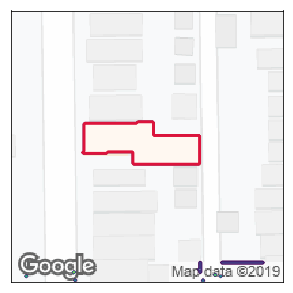

87
2827.375
1950
Elapsed time:  4.93280029296875


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


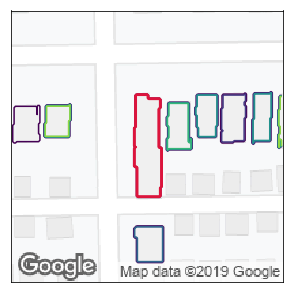

88
2535.0
1329
Elapsed time:  4.980671167373657


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


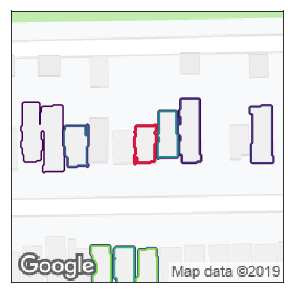

89
856.5
399
Elapsed time:  5.22800874710083


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


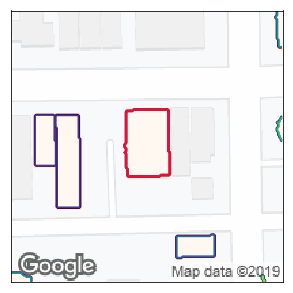

90
3452.5
1523
Elapsed time:  5.423161268234253


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


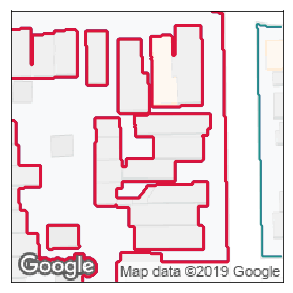

91
2818.39
16104
Elapsed time:  4.679498910903931


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


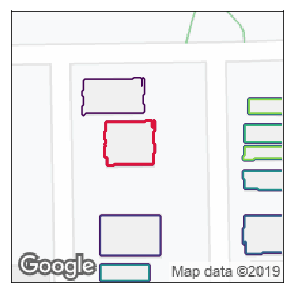

92
3335.75
1116
Elapsed time:  4.709894180297852


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


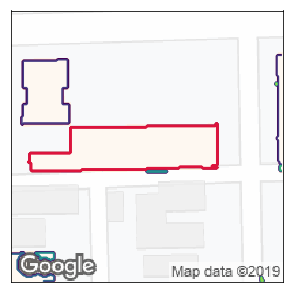

93
7366.61
3722
Elapsed time:  5.114943504333496


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


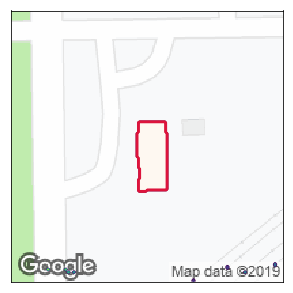

94
2859.75
1058
Elapsed time:  5.117305040359497


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


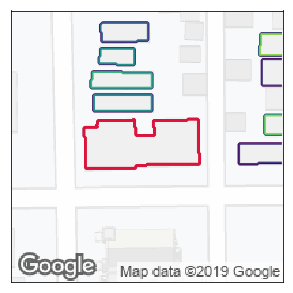

95
4983.625
2601
Elapsed time:  4.987651586532593


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


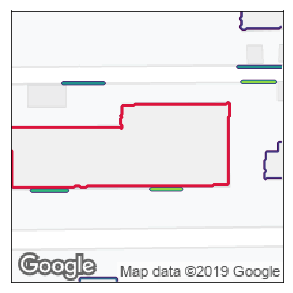

96
2722.625
8227
Elapsed time:  5.316518068313599


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


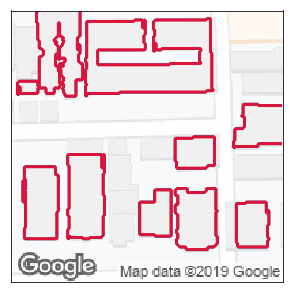

97
5802.625
27282
Elapsed time:  4.974682807922363


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


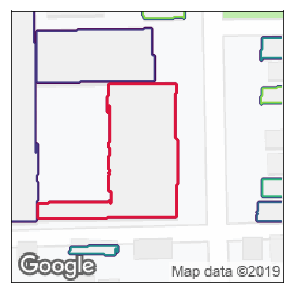

98
8331.75
5475
Elapsed time:  6.566490411758423


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


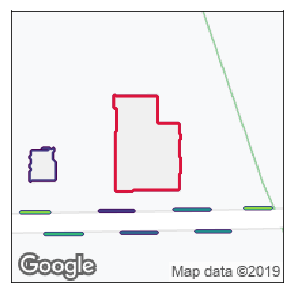

99
4843.5
2945
Elapsed time:  7.163072824478149


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


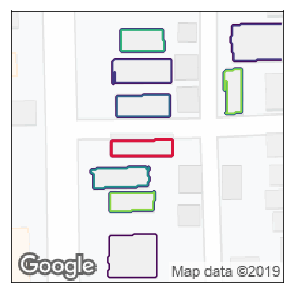

100
2646.625
508
Elapsed time:  5.426476001739502


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


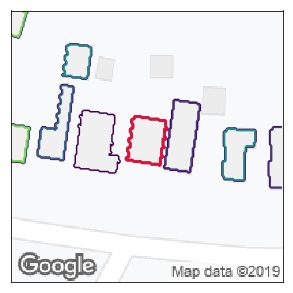

101
1646.75
793
Elapsed time:  5.211752414703369


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


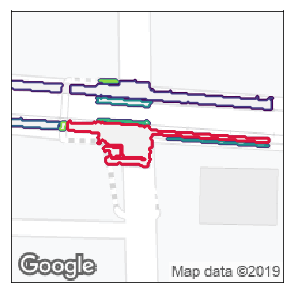

102
10873.0
1334
Elapsed time:  4.864586114883423


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


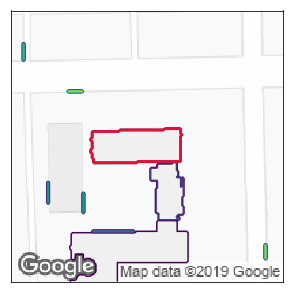

103
4522.875
1523
Elapsed time:  4.869417190551758


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


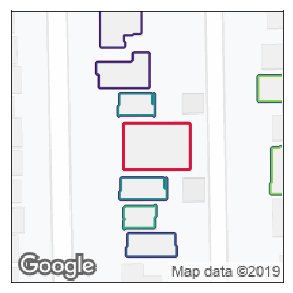

104
3585.5
1666
Elapsed time:  5.004988431930542


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


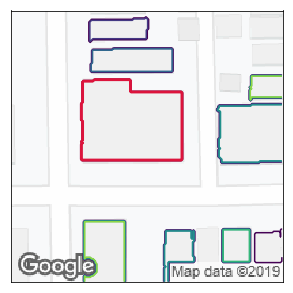

105
8114.25
3983
Elapsed time:  5.318810939788818


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


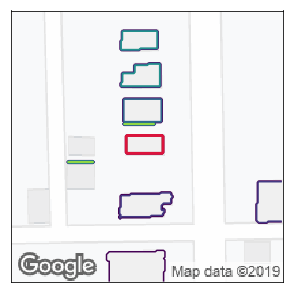

106
1189.375
351
Elapsed time:  6.337427139282227


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


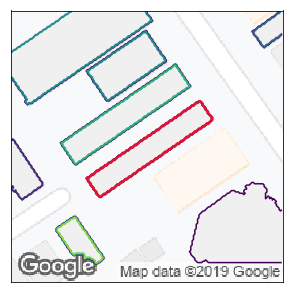

107
4126.875
1694
Elapsed time:  4.942325592041016


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


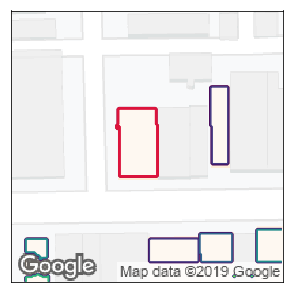

108
2968.75
1404
Elapsed time:  6.875811338424683


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


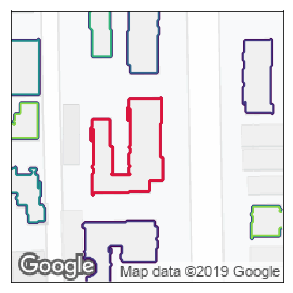

109
5104.25
2435
Elapsed time:  5.026581764221191


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


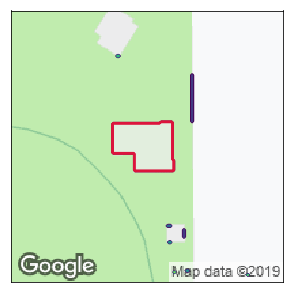

110
2720.0
1349
Elapsed time:  5.32542610168457


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


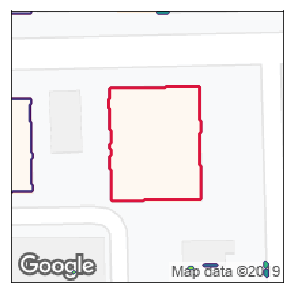

111
11011.275
5465
Elapsed time:  5.969020128250122


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


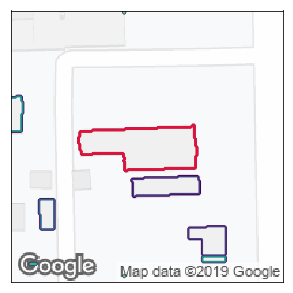

112
3690.25
2136
Elapsed time:  5.826695203781128


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


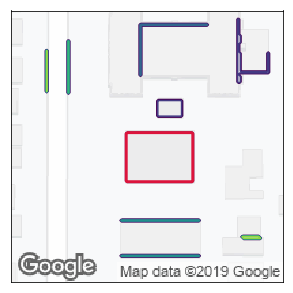

113
4945.0
1764
Elapsed time:  5.431466817855835


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


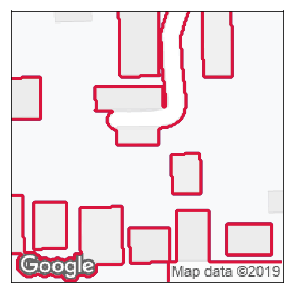

114
2637.0
26172
Elapsed time:  5.543166875839233


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


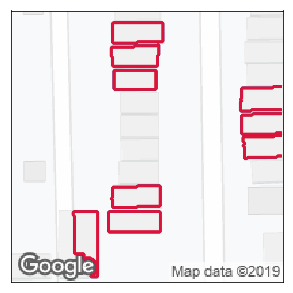

115
919.125
35482
Elapsed time:  5.759281158447266


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


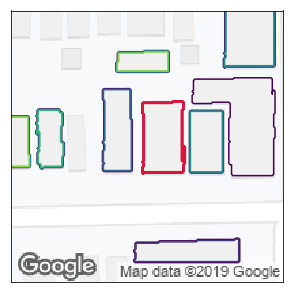

116
3237.25
1476
Elapsed time:  6.733978033065796


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


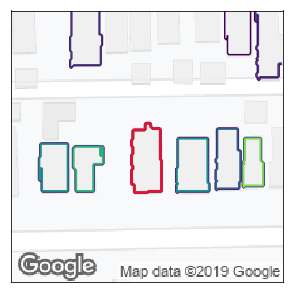

117
3281.125
980
Elapsed time:  9.047245740890503


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


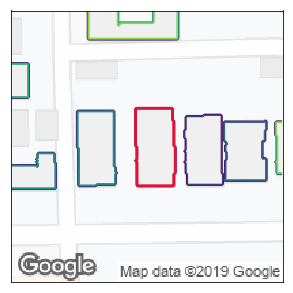

118
3364.375
1579
Elapsed time:  7.5119547843933105


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


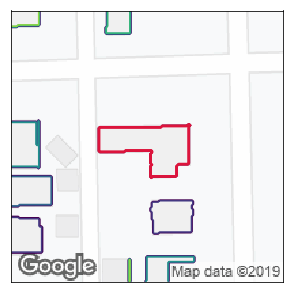

119
3455.125
1613
Elapsed time:  7.378658771514893


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


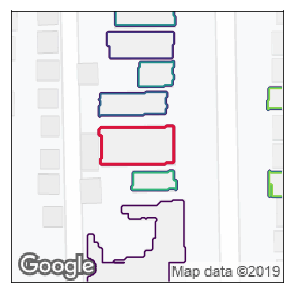

120
2921.75
1446
Elapsed time:  9.368898153305054


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


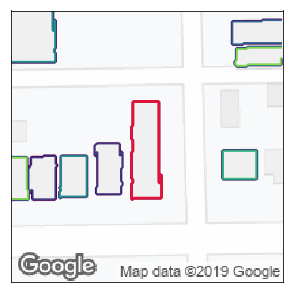

121
2998.875
1419
Elapsed time:  9.36895227432251


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


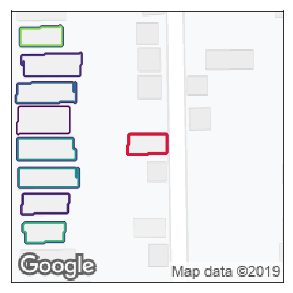

122
940.25
413
Elapsed time:  6.157939195632935


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


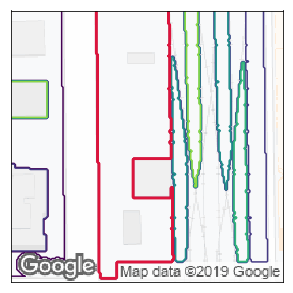

123
12085.55
9249
Elapsed time:  5.410974025726318


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


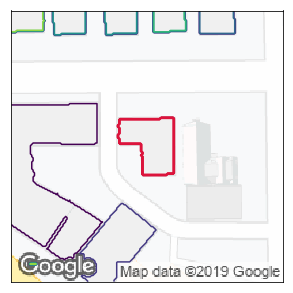

124
2773.75
1266
Elapsed time:  7.641052007675171


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


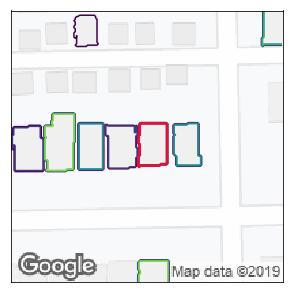

125
1016.0
629
Elapsed time:  6.58038854598999


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


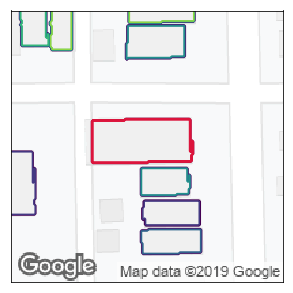

126
4772.75
2266
Elapsed time:  6.605588436126709


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


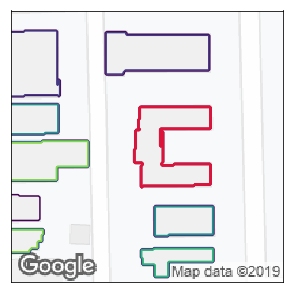

127
4757.625
2140
Elapsed time:  7.661742448806763


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


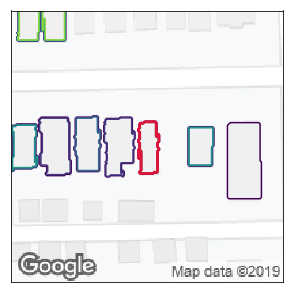

128
1290.25
481
Elapsed time:  5.911291122436523


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


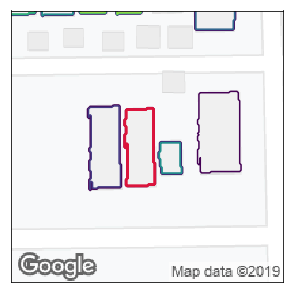

129
2583.25
1126
Elapsed time:  5.237466096878052


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


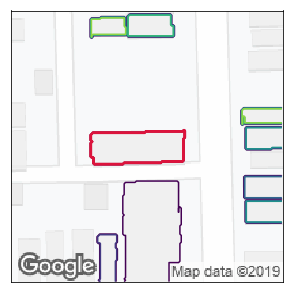

130
3180.0
1526
Elapsed time:  7.033940553665161


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


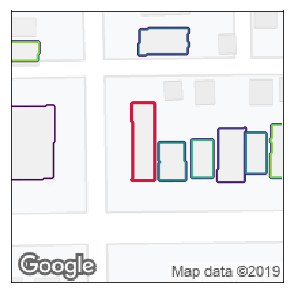

131
2558.5
927
Elapsed time:  5.445464372634888


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


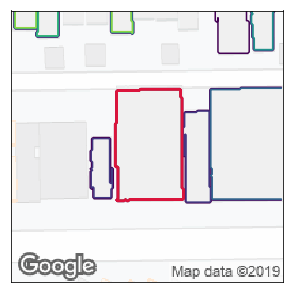

132
9045.0
3889
Elapsed time:  6.811803102493286


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


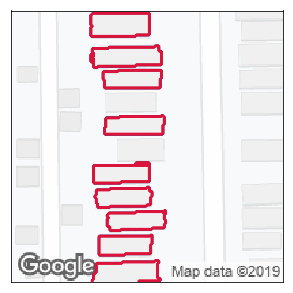

133
958.5
34767
Elapsed time:  6.36135458946228


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


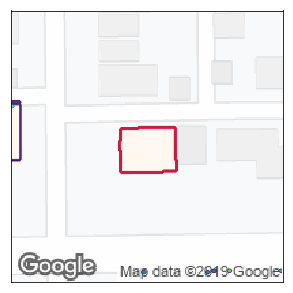

134
2635.5
1313
Elapsed time:  6.134582757949829


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


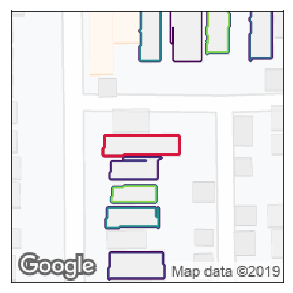

135
1680.5
790
Elapsed time:  7.296165227890015


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


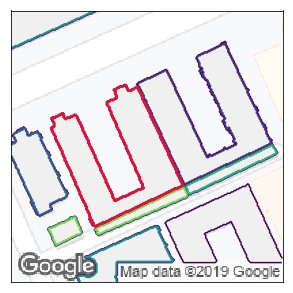

136
9637.1
4099
Elapsed time:  5.9041969776153564


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


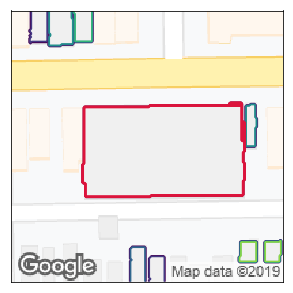

137
14432.625
7746
Elapsed time:  5.627975225448608


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


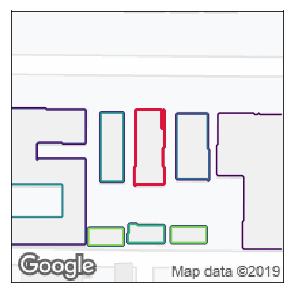

138
1932.625
1141
Elapsed time:  5.926743745803833


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


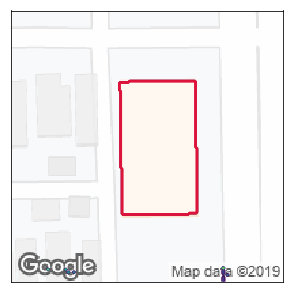

139
11919.375
5399
Elapsed time:  6.339033126831055


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


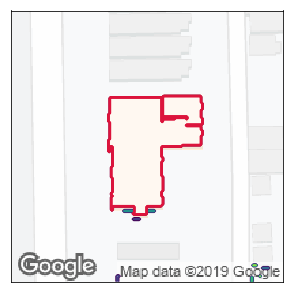

140
9005.375
4077
Elapsed time:  5.233134746551514


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


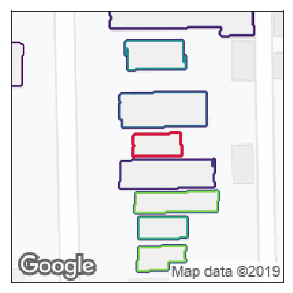

141
1285.875
575
Elapsed time:  3.3530259132385254


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


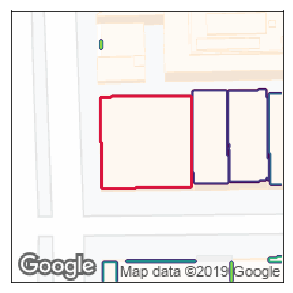

142
10273.5
4473
Elapsed time:  3.2991690635681152


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


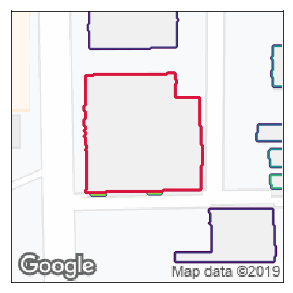

143
12041.0
6950
Elapsed time:  3.3899266719818115


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


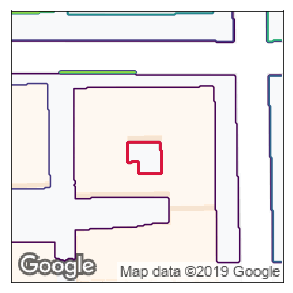

144
17929.625
500
Elapsed time:  3.340059757232666


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


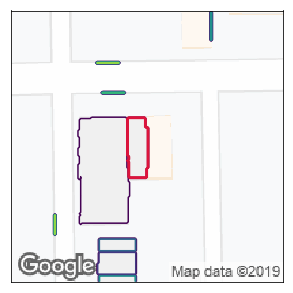

145
1603.75
624
Elapsed time:  4.561822891235352


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


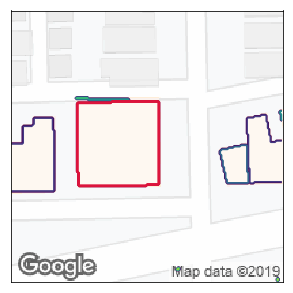

146
3765.5
3676
Elapsed time:  4.835058212280273


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


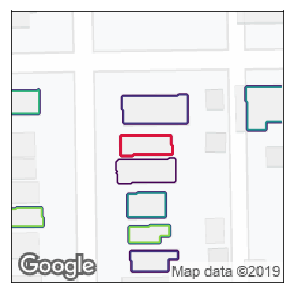

147
1351.875
534
Elapsed time:  3.326097011566162


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


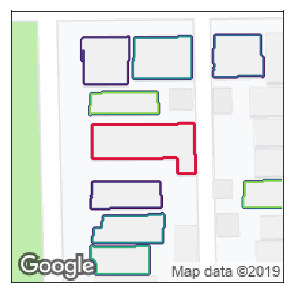

148
4767.375
2023
Elapsed time:  3.3151276111602783


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


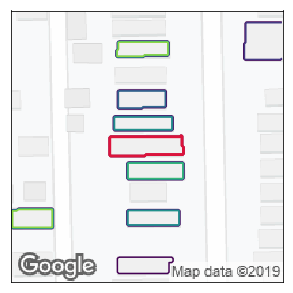

149
1681.0
722
Elapsed time:  4.595256805419922


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


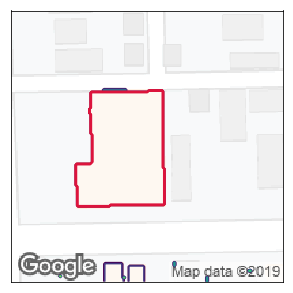

150
3083.375
4760
Elapsed time:  3.3191146850585938


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


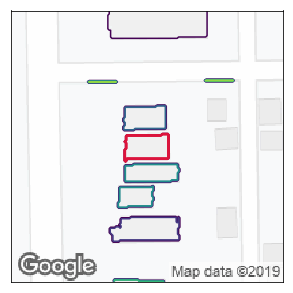

151
1324.25
542
Elapsed time:  4.333441257476807


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


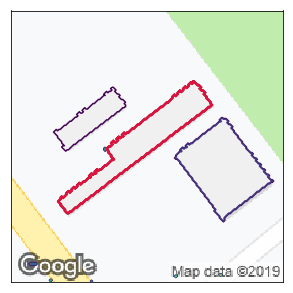

152
5638.375
2356
Elapsed time:  3.788860559463501


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


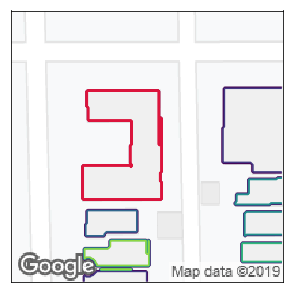

153
7491.75
3322
Elapsed time:  5.340751886367798


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


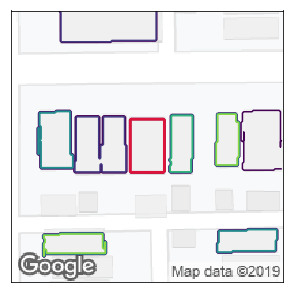

154
2754.25
975
Elapsed time:  5.536304473876953


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


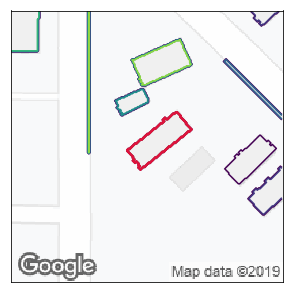

155
2591.5
796
Elapsed time:  5.445275783538818


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


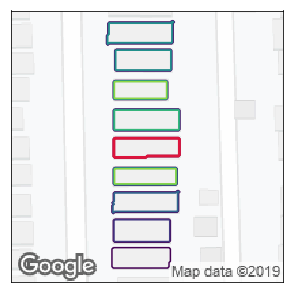

156
1505.25
648
Elapsed time:  6.213705062866211


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


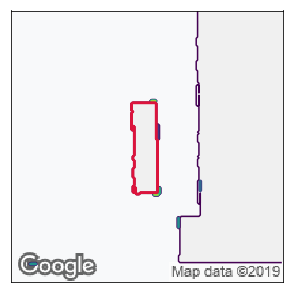

157
2577.0
1145
Elapsed time:  5.322450637817383


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


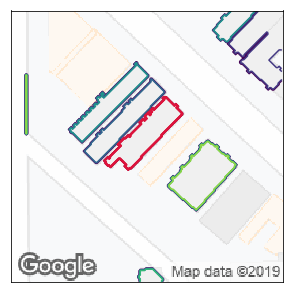

158
4653.75
1040
Elapsed time:  5.726323843002319


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


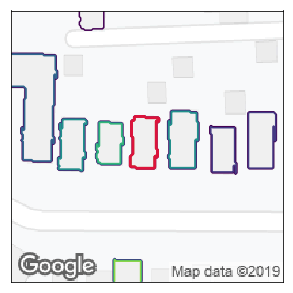

159
1365.0
664
Elapsed time:  5.3264479637146


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


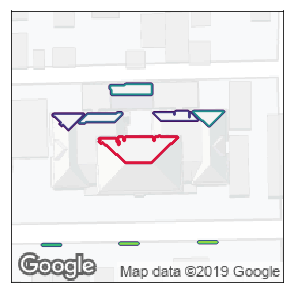

160
19880.125
723
Elapsed time:  4.293345212936401


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


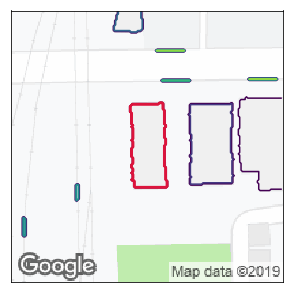

161
3262.5
1458
Elapsed time:  4.840524673461914


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


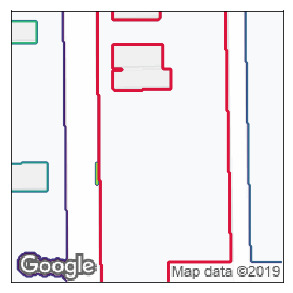

162
934.25
16729
Elapsed time:  6.352384328842163


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


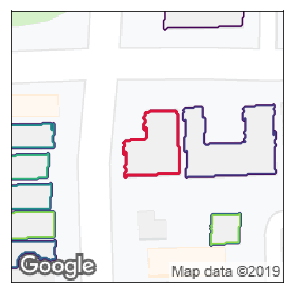

163
2628.875
1509
Elapsed time:  4.631168842315674


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


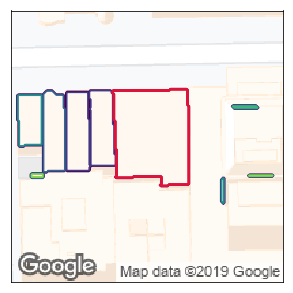

164
5755.125
3547
Elapsed time:  6.525545358657837


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


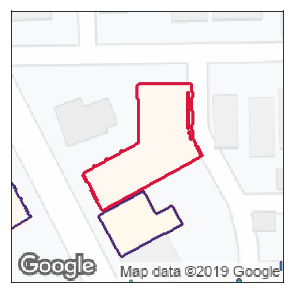

165
9181.75
3906
Elapsed time:  5.1875340938568115


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


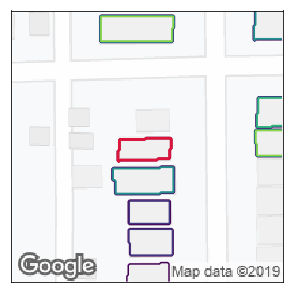

166
1296.625
580
Elapsed time:  4.91529655456543


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


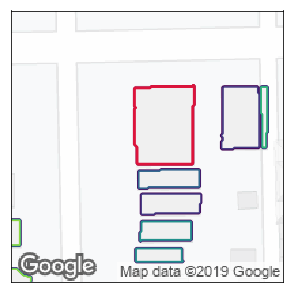

167
2558.5
2426
Elapsed time:  6.498009204864502


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


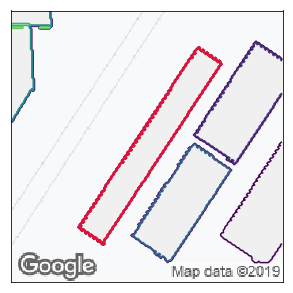

168
5892.0
3313
Elapsed time:  4.985728025436401


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


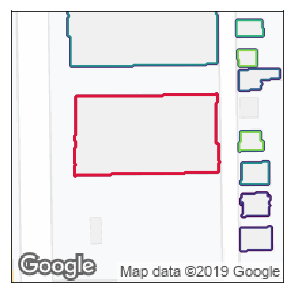

169
9151.0
5987
Elapsed time:  4.169867753982544


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


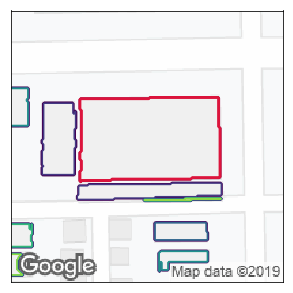

170
8580.375
6071
Elapsed time:  6.017808675765991


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


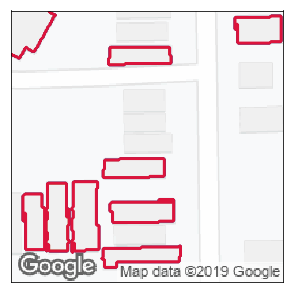

171
1074.125
33863
Elapsed time:  6.101046562194824


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


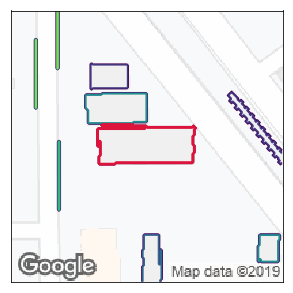

172
3709.625
1835
Elapsed time:  4.204336881637573


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


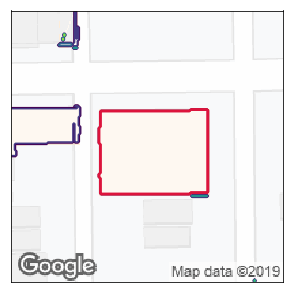

173
10025.5
4834
Elapsed time:  6.0091588497161865


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


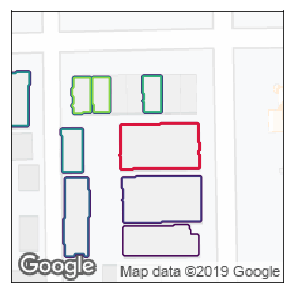

174
3776.125
1878
Elapsed time:  5.321174144744873


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


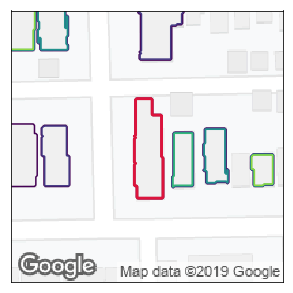

175
2964.375
1359
Elapsed time:  4.8937225341796875


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


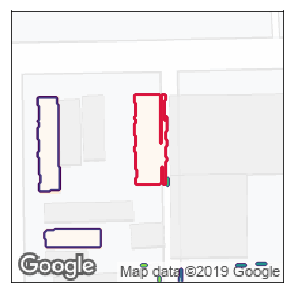

176
2941.375
1421
Elapsed time:  6.846042156219482


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


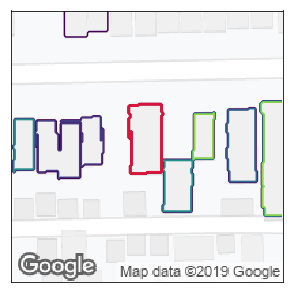

177
3146.0
1154
Elapsed time:  4.627690076828003


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


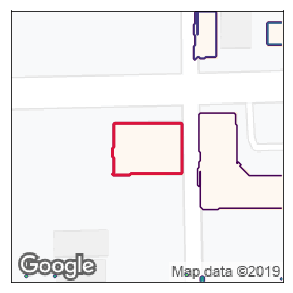

178
4525.875
1870
Elapsed time:  6.056050539016724


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


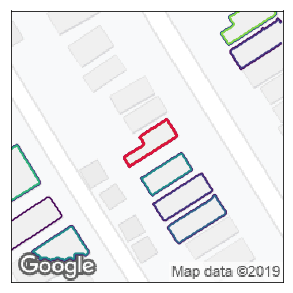

179
1622.5
480
Elapsed time:  6.478258371353149


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


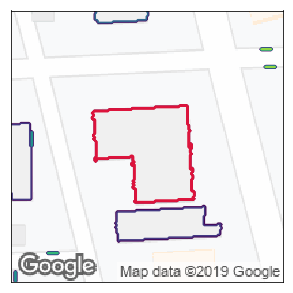

180
6222.25
3846
Elapsed time:  4.73436975479126


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


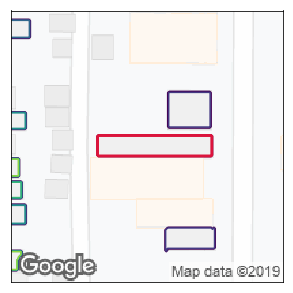

181
3173.625
1260
Elapsed time:  6.446356296539307


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


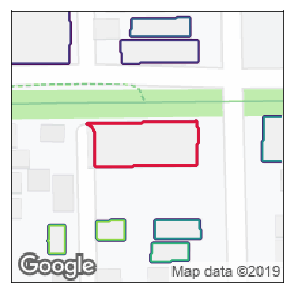

182
5795.375
2422
Elapsed time:  5.505424976348877


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


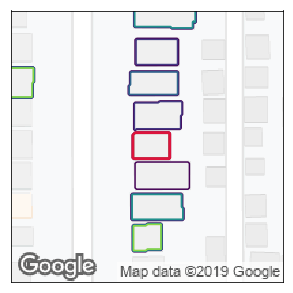

183
765.75
512
Elapsed time:  4.266848802566528


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


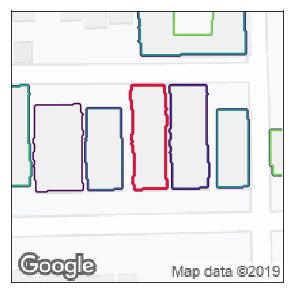

184
2984.875
1852
Elapsed time:  6.365329265594482


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


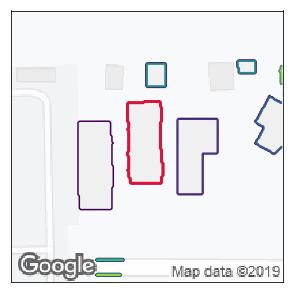

185
2864.0
1430
Elapsed time:  5.857193231582642


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


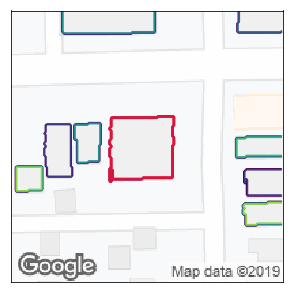

186
3992.75
2043
Elapsed time:  4.385781526565552


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


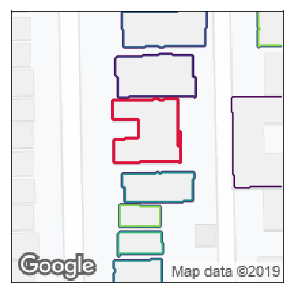

187
5881.875
1936
Elapsed time:  5.3911051750183105


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


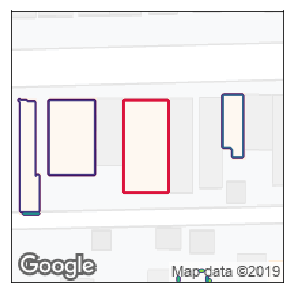

188
5459.57
2244
Elapsed time:  5.3394529819488525


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


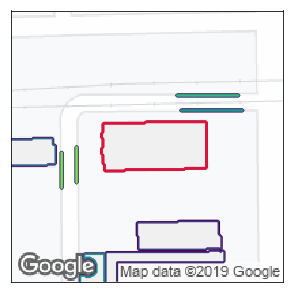

189
5551.875
2633
Elapsed time:  4.697933673858643


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


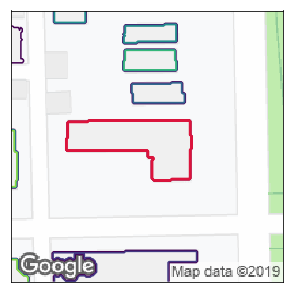

190
5526.5
2598
Elapsed time:  5.725391626358032


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


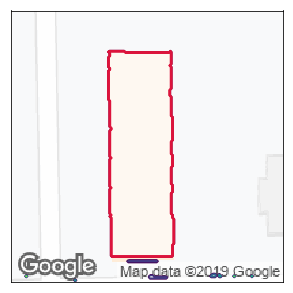

191
11522.25
6836
Elapsed time:  4.8949267864227295


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


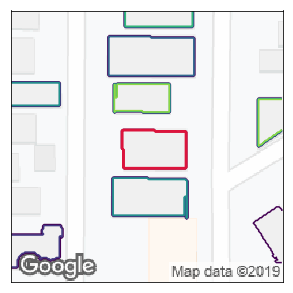

192
3500.75
1279
Elapsed time:  4.559624671936035


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


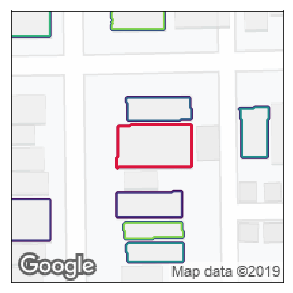

193
3547.5
1673
Elapsed time:  5.709398984909058


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


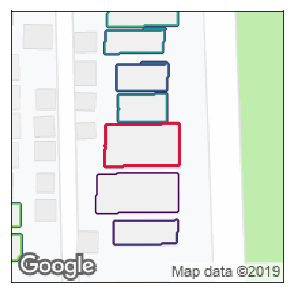

194
2650.52
1660
Elapsed time:  5.977754354476929


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


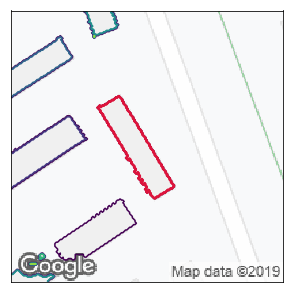

195
2891.25
1392
Elapsed time:  5.010246276855469


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


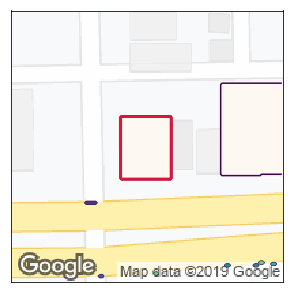

196
3946.375
1702
Elapsed time:  7.004384994506836


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


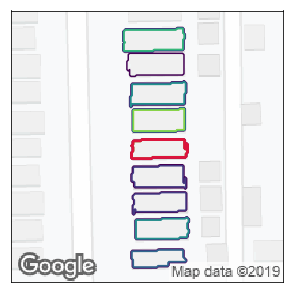

197
1445.5
521
Elapsed time:  4.31599235534668


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


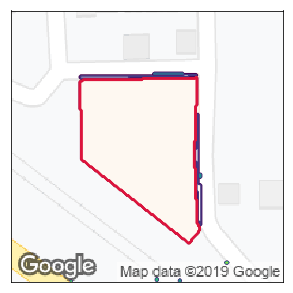

198
17810.75
7736
Elapsed time:  6.663375616073608


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


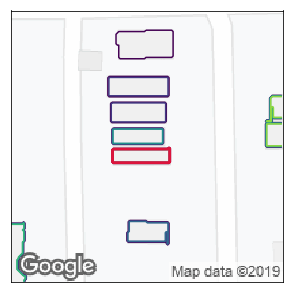

199
2940.125
421
Elapsed time:  5.705140113830566


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


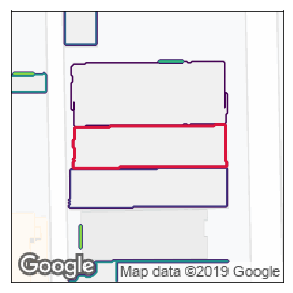

200
7348.98
3361
Elapsed time:  4.518705606460571


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


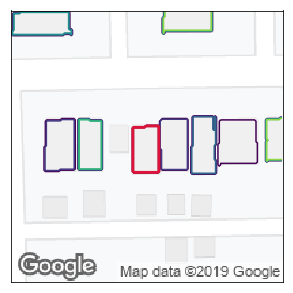

201
1463.25
637
Elapsed time:  5.742199182510376


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


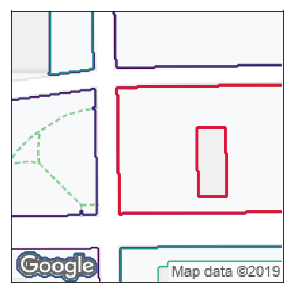

202
2595.125
10153
Elapsed time:  7.111435413360596


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


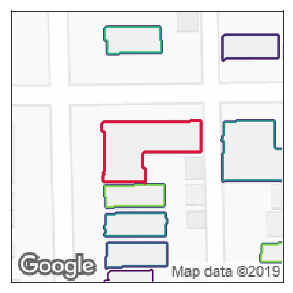

203
4704.0
2227
Elapsed time:  5.928702354431152


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


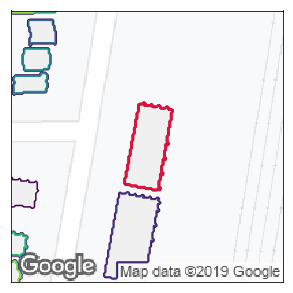

204
3529.0
1505
Elapsed time:  6.632542610168457


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


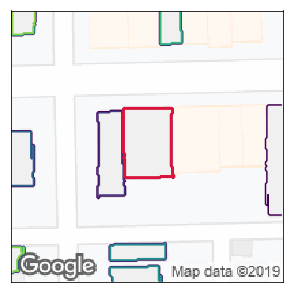

205
3454.965
1773
Elapsed time:  5.288724184036255


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


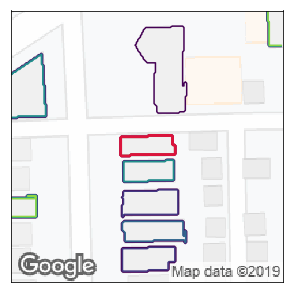

206
1294.5
533
Elapsed time:  6.037419557571411


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


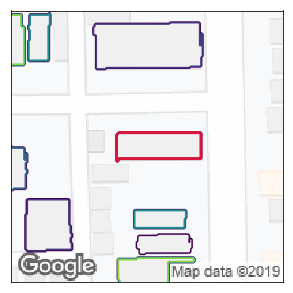

207
2749.625
1179
Elapsed time:  5.882669925689697


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


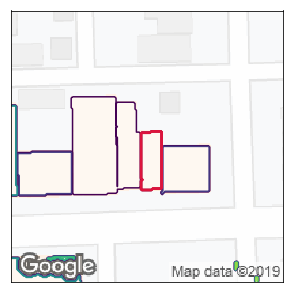

208
2575.14
630
Elapsed time:  5.493869781494141


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


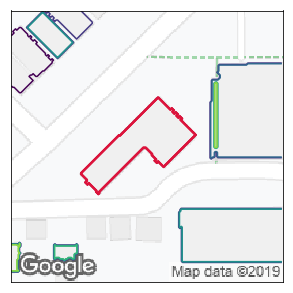

209
4347.75
2200
Elapsed time:  6.1827497482299805


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


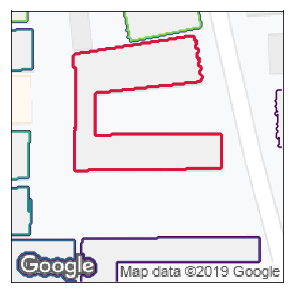

210
13660.25
6120
Elapsed time:  4.454432249069214


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


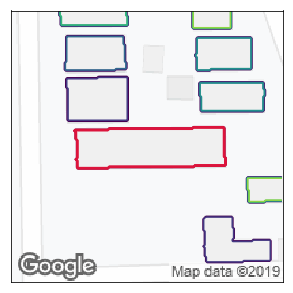

211
6463.25
3040
Elapsed time:  4.8703367710113525


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


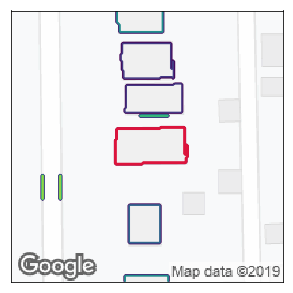

212
2811.125
1320
Elapsed time:  5.39471173286438


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


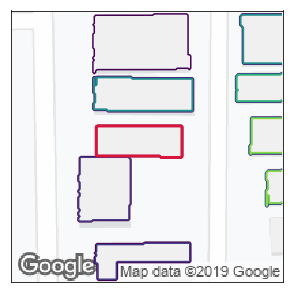

213
4323.5
1402
Elapsed time:  5.6545257568359375


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


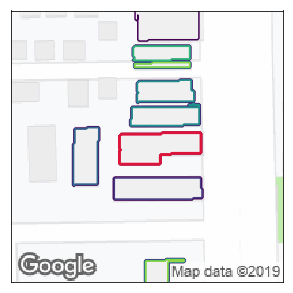

214
2602.75
1115
Elapsed time:  4.303742408752441


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


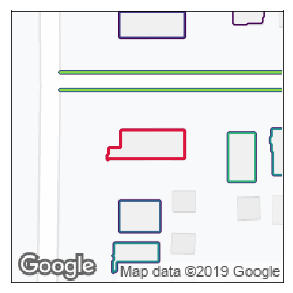

215
3058.0
1063
Elapsed time:  6.211234092712402


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


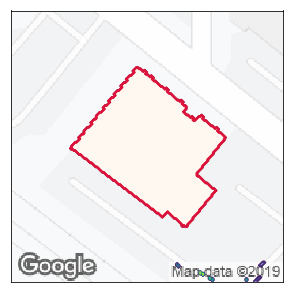

216
16019.125
6942
Elapsed time:  5.195946216583252


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


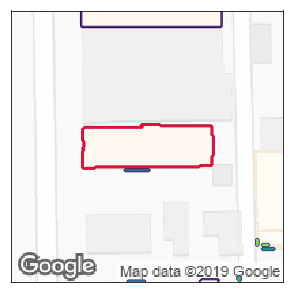

217
5981.0
2828
Elapsed time:  5.116113185882568


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


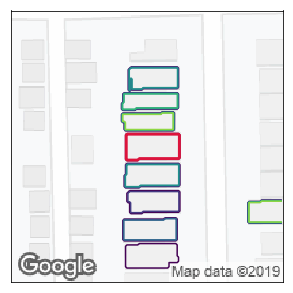

218
1353.75
711
Elapsed time:  5.4296510219573975


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


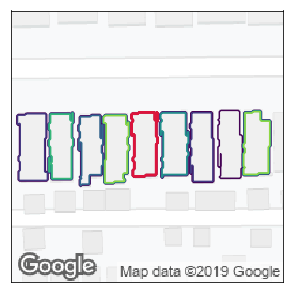

219
1597.375
784
Elapsed time:  5.094640493392944


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


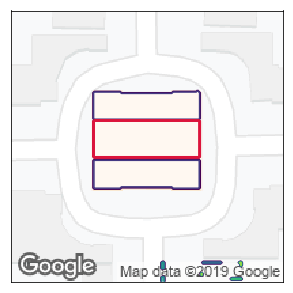

220
11430.0
2106
Elapsed time:  5.352570056915283


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


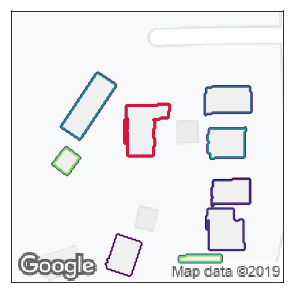

221
2780.625
860
Elapsed time:  5.544728755950928


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


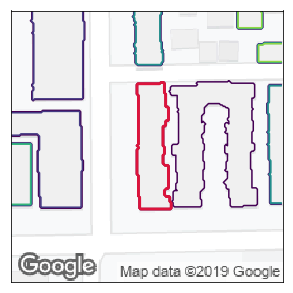

222
4631.875
1886
Elapsed time:  4.841205835342407


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


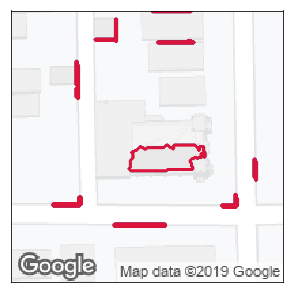

223
7879.875
38842
Elapsed time:  4.977186679840088


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


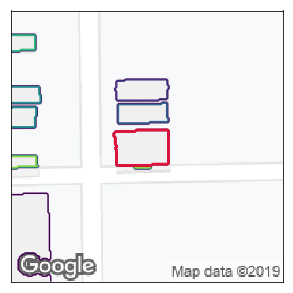

224
2585.5
976
Elapsed time:  5.590362310409546


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


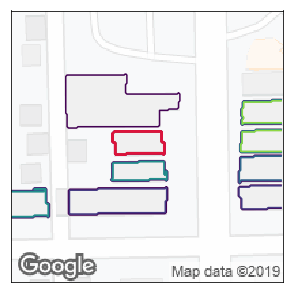

225
1101.25
584
Elapsed time:  5.0181725025177


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


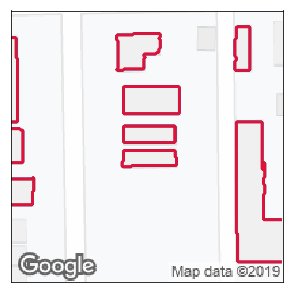

226
2830.25
33996
Elapsed time:  5.0113465785980225


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


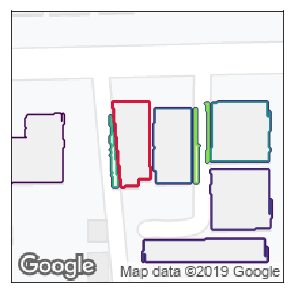

227
7930.5
1461
Elapsed time:  6.030482769012451


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


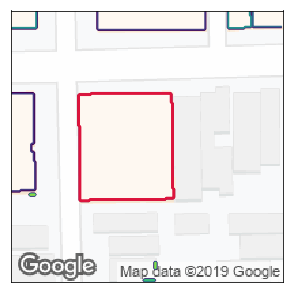

228
11245.0
5321
Elapsed time:  7.117500066757202


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


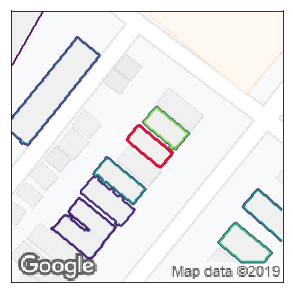

229
1081.875
454
Elapsed time:  6.487020969390869


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


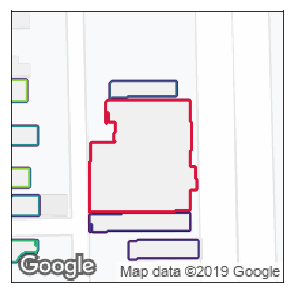

230
12534.375
5663
Elapsed time:  5.4978108406066895


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


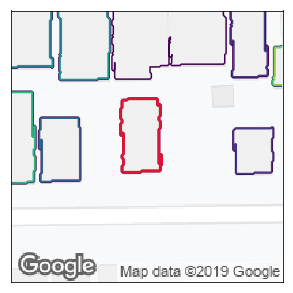

231
2794.875
1460
Elapsed time:  4.635867595672607


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


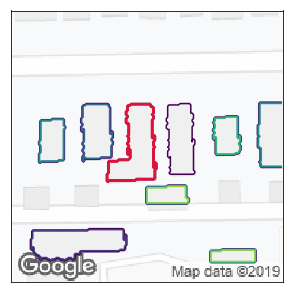

232
2878.375
1238
Elapsed time:  5.312315225601196


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


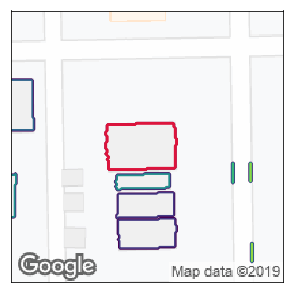

233
3358.625
1660
Elapsed time:  5.544352054595947


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


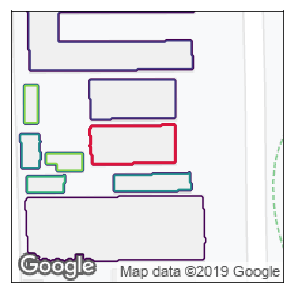

234
3731.94
1714
Elapsed time:  4.562547206878662


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


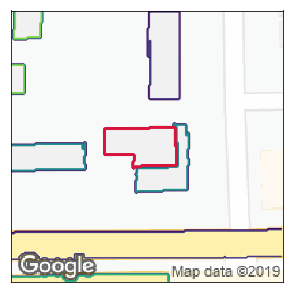

235
3226.125
1271
Elapsed time:  6.160457372665405


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


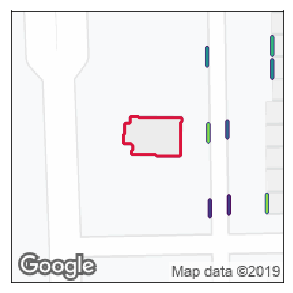

236
5243.0
1081
Elapsed time:  4.882013320922852


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


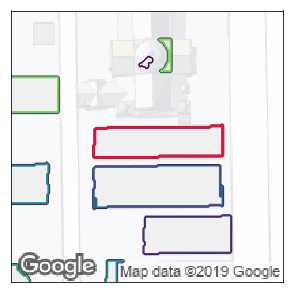

237
4277.0
2031
Elapsed time:  5.118774652481079


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


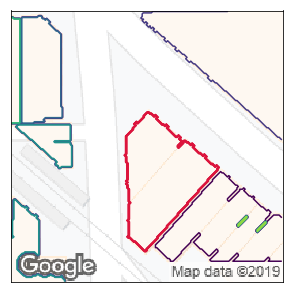

238
2527.125
3915
Elapsed time:  5.726886034011841


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


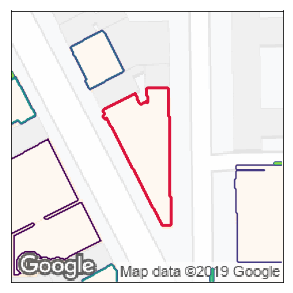

239
5923.75
2800
Elapsed time:  4.825680255889893


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


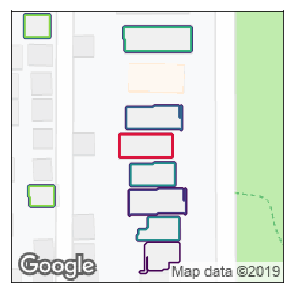

240
1408.75
663
Elapsed time:  4.296260833740234


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


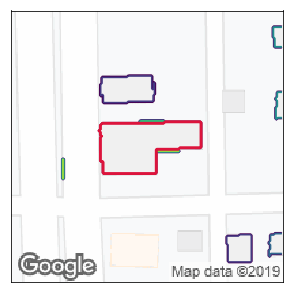

241
3996.5
2136
Elapsed time:  5.755638122558594


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


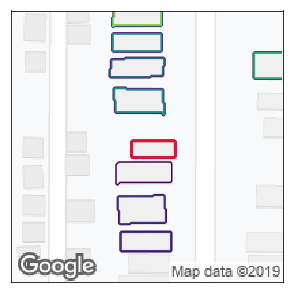

242
1162.625
384
Elapsed time:  5.134627103805542


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


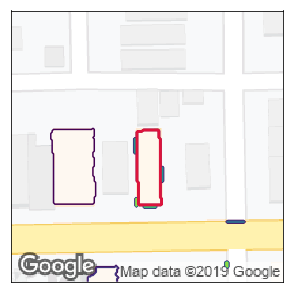

243
2953.75
913
Elapsed time:  4.849903106689453


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


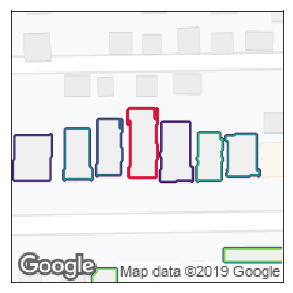

244
1504.125
1013
Elapsed time:  6.126313209533691


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


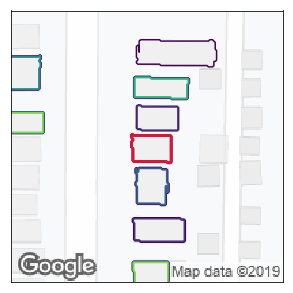

245
992.0
543
Elapsed time:  4.740877151489258


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


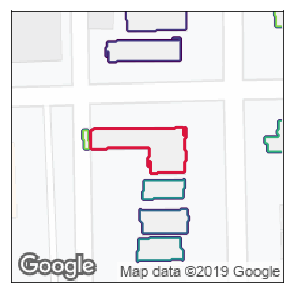

246
3943.375
1465
Elapsed time:  4.857054948806763


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


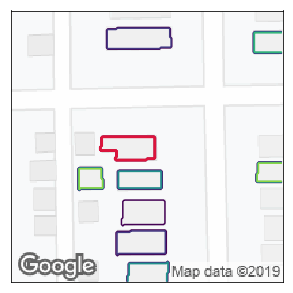

247
1251.5
585
Elapsed time:  5.998370409011841


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


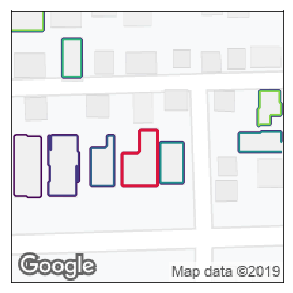

248
2640.875
846
Elapsed time:  4.79534125328064


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


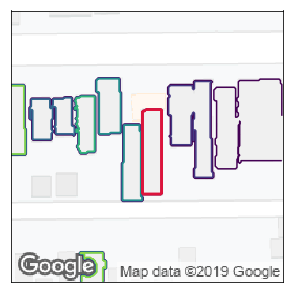

249
4639.75
866
Elapsed time:  5.820075750350952


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


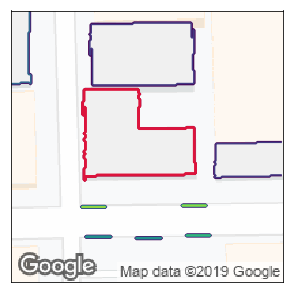

250
9700.875
3913
Elapsed time:  6.26835823059082


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


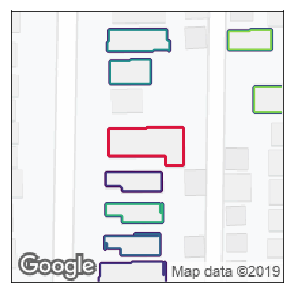

251
2666.875
1218
Elapsed time:  4.996242523193359


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


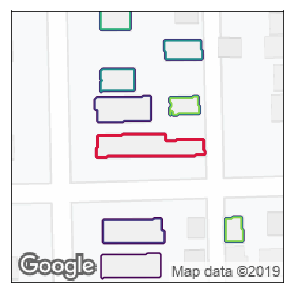

252
2571.25
1121
Elapsed time:  4.720918655395508


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


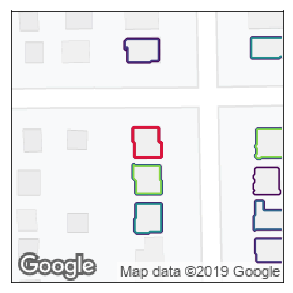

253
801.375
429
Elapsed time:  6.633801698684692


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


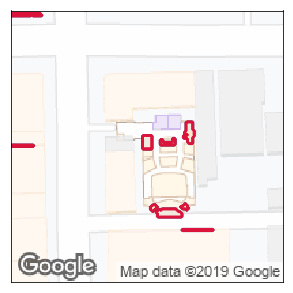

254
12133.75
39599
Elapsed time:  4.816317796707153


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


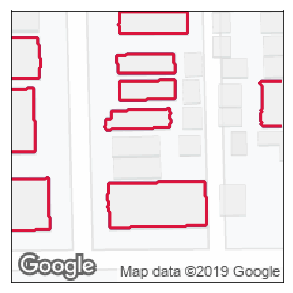

255
1271.25
32097
Elapsed time:  5.1964616775512695


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


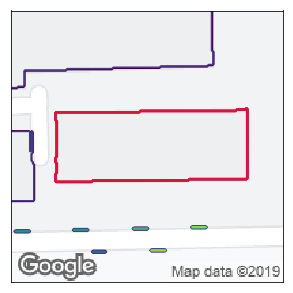

256
14658.0
7087
Elapsed time:  4.7785680294036865


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


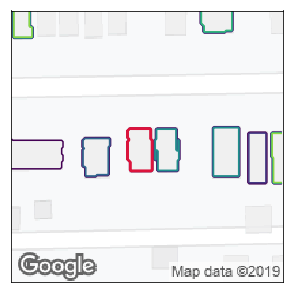

257
1219.0
532
Elapsed time:  5.5003981590271


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


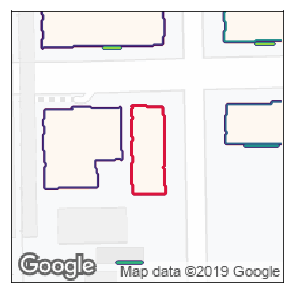

258
2974.5
1528
Elapsed time:  6.520849943161011


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


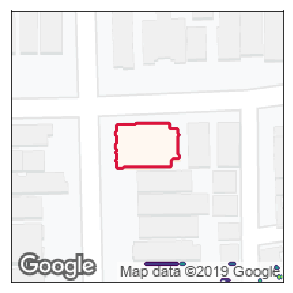

259
3066.375
1391
Elapsed time:  4.929303407669067


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


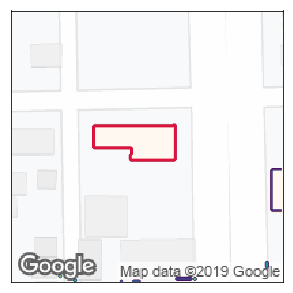

260
3219.875
1253
Elapsed time:  4.594080924987793


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


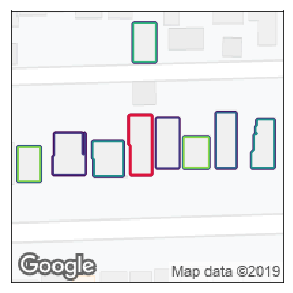

261
1654.375
726
Elapsed time:  4.3327484130859375


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


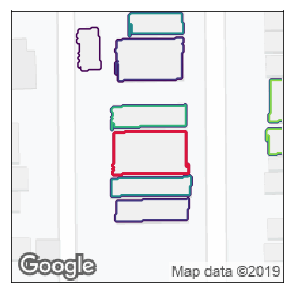

262
3094.0
1659
Elapsed time:  4.490106582641602


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


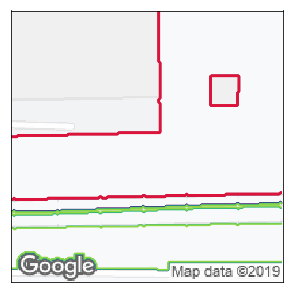

263
8585.5
16925
Elapsed time:  4.168917417526245


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


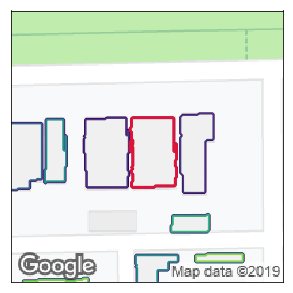

264
3070.0
1597
Elapsed time:  3.9699923992156982


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


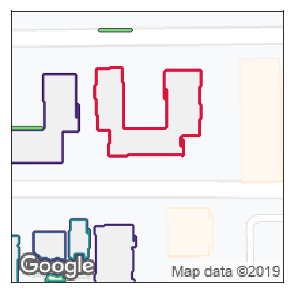

265
6586.375
3077
Elapsed time:  4.722228050231934


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


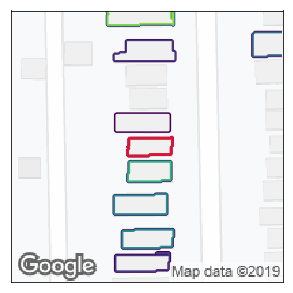

266
486.5
400
Elapsed time:  4.591381788253784


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


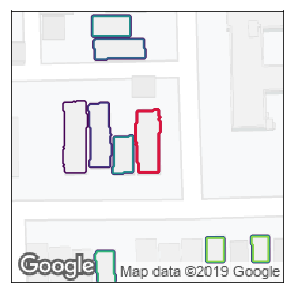

267
1829.75
742
Elapsed time:  4.327696323394775


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


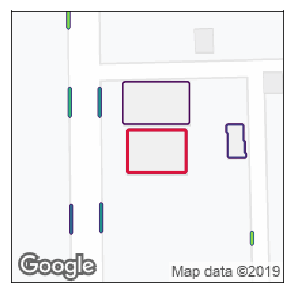

268
3496.25
1333
Elapsed time:  6.079456567764282


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


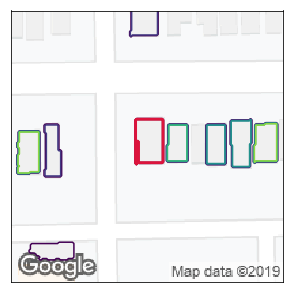

269
1240.75
625
Elapsed time:  5.649755954742432


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


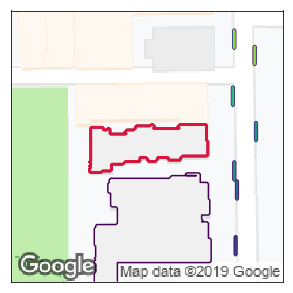

270
4562.5
2105
Elapsed time:  4.660898208618164


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


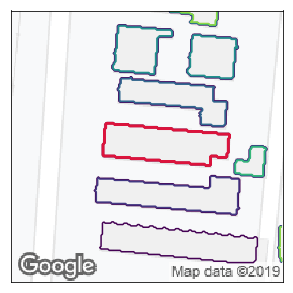

271
4314.65
2087
Elapsed time:  6.160470008850098


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


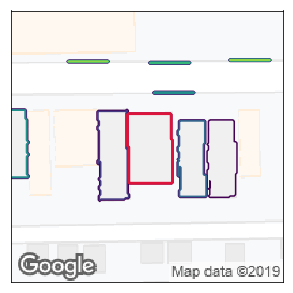

272
3633.1
1637
Elapsed time:  5.198778390884399


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


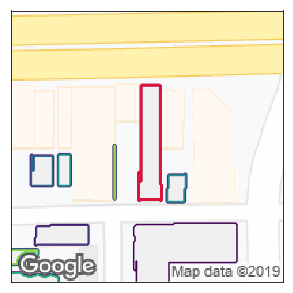

273
2556.175
1222
Elapsed time:  5.682031631469727


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


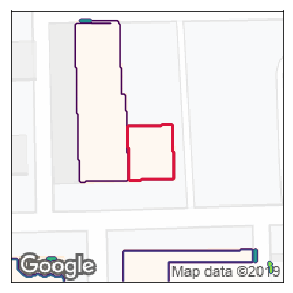

274
3431.495
1301
Elapsed time:  5.782239675521851


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


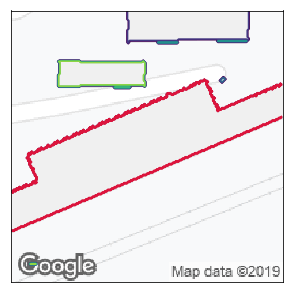

275
19354.75
8470
Elapsed time:  5.370797634124756


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


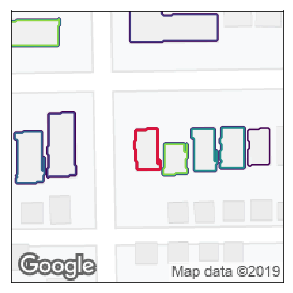

276
1213.375
483
Elapsed time:  4.31778621673584


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


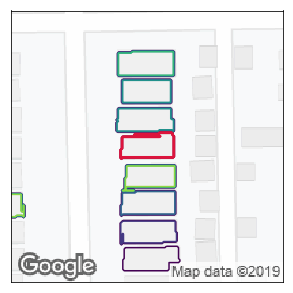

277
1554.625
625
Elapsed time:  5.9901347160339355


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


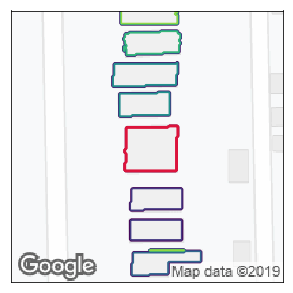

278
2914.625
1207
Elapsed time:  4.906646490097046


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


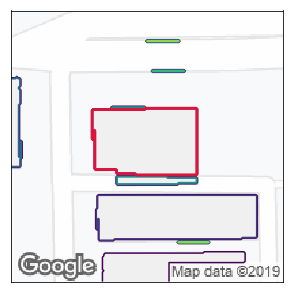

279
8355.625
3597
Elapsed time:  6.046496629714966


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


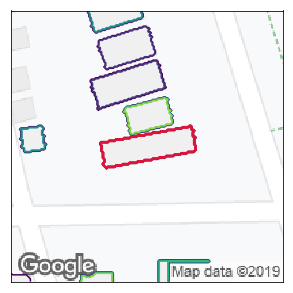

280
2944.75
1262
Elapsed time:  5.408553123474121


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


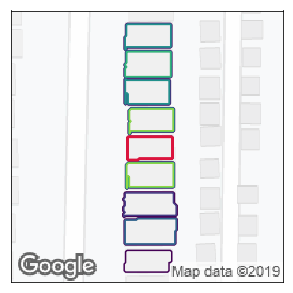

281
1431.25
536
Elapsed time:  5.52632212638855


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


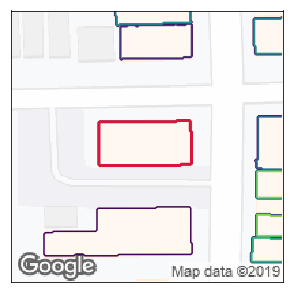

282
4829.75
2171
Elapsed time:  4.754854679107666


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


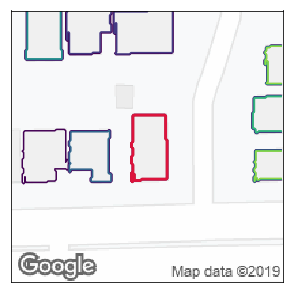

283
2786.125
1175
Elapsed time:  5.941760063171387


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


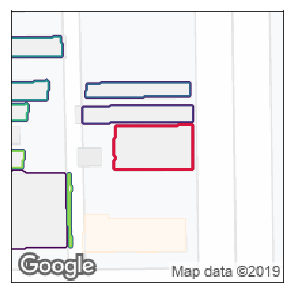

284
4137.75
1855
Elapsed time:  5.92043662071228


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


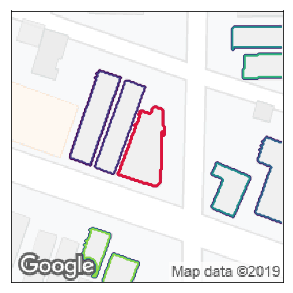

285
3002.125
1265
Elapsed time:  5.440971851348877


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


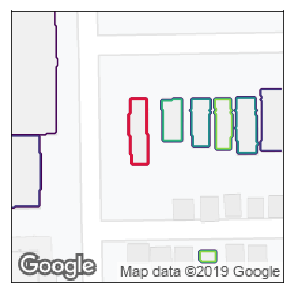

286
2606.625
607
Elapsed time:  5.34166145324707


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


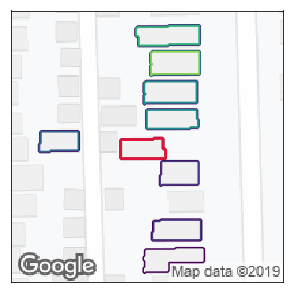

287
929.375
455
Elapsed time:  4.264376163482666


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


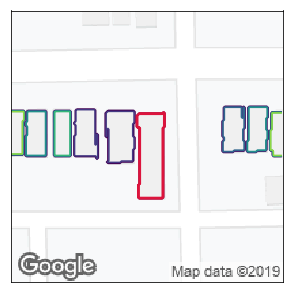

288
4641.0
1094
Elapsed time:  6.717518329620361


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


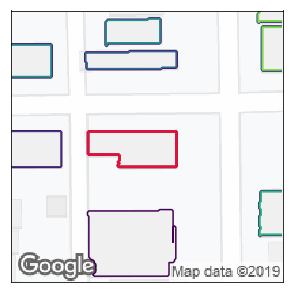

289
2814.875
1486
Elapsed time:  6.362691402435303


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


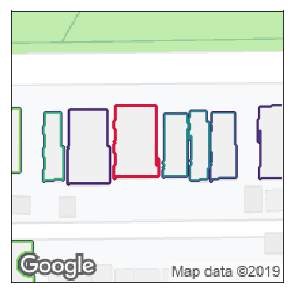

290
3189.5
1605
Elapsed time:  4.290290117263794


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


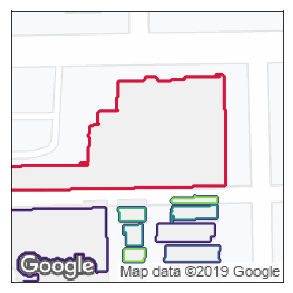

291
16509.5
8446
Elapsed time:  5.160091876983643


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


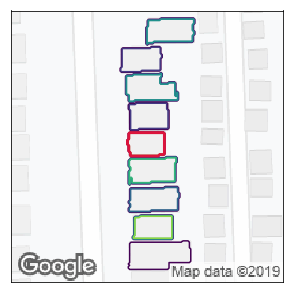

292
762.0
439
Elapsed time:  4.9964280128479


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


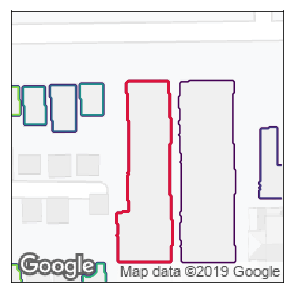

293
4497.625
4427
Elapsed time:  5.711307525634766


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


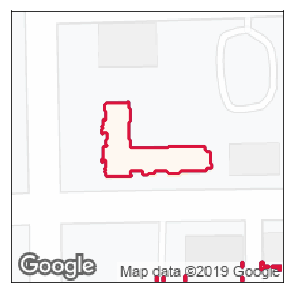

294
4406.905
37892
Elapsed time:  7.803012132644653


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


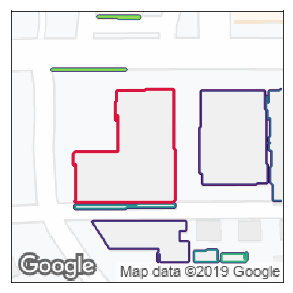

295
6490.375
4619
Elapsed time:  4.9431116580963135


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


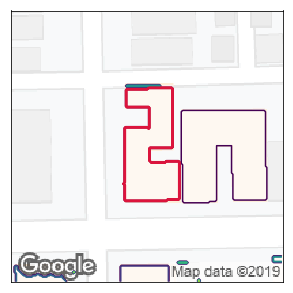

296
5080.375
2560
Elapsed time:  5.497725963592529


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


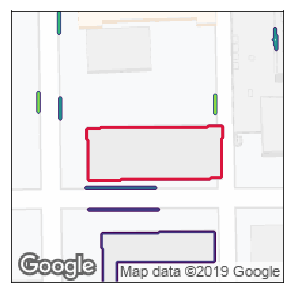

297
6673.5
3758
Elapsed time:  5.787688493728638


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


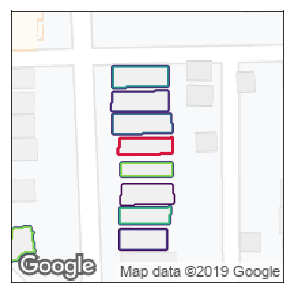

298
1154.25
465
Elapsed time:  5.313378572463989


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


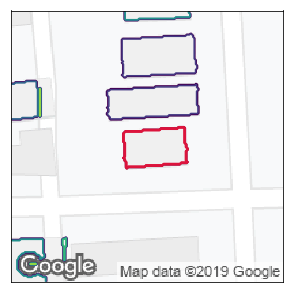

299
2681.25
1172
Elapsed time:  5.510502815246582


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


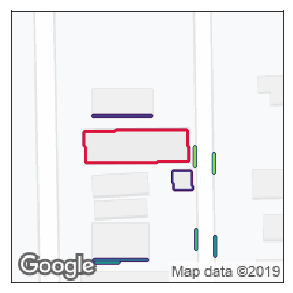

300
3787.625
1778
Elapsed time:  5.065317630767822


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


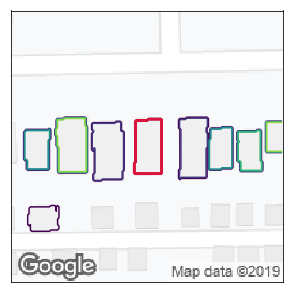

301
1648.5
759
Elapsed time:  5.027594804763794


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


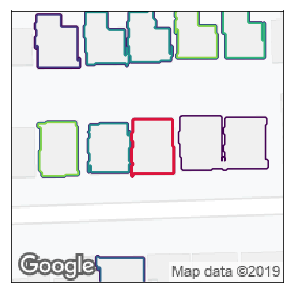

302
2743.25
1205
Elapsed time:  5.034003496170044


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


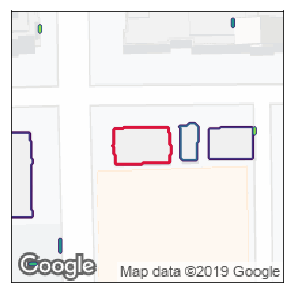

303
2743.875
1077
Elapsed time:  4.906218767166138


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


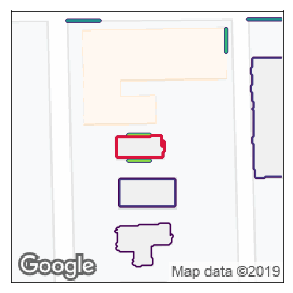

304
1196.75
519
Elapsed time:  6.824733734130859


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


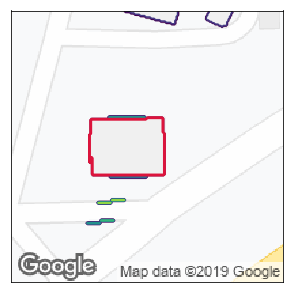

305
2976.25
2224
Elapsed time:  9.787803411483765


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


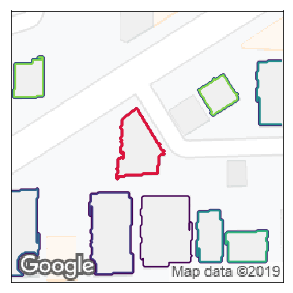

306
2730.25
1110
Elapsed time:  6.823949098587036


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


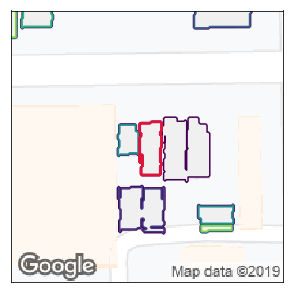

307
1175.625
574
Elapsed time:  5.789825439453125


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


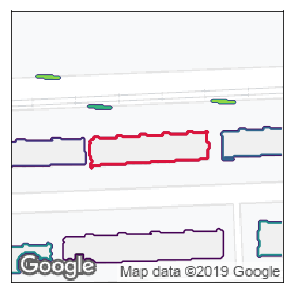

308
3358.5
1704
Elapsed time:  5.790997505187988


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


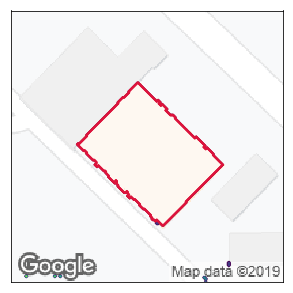

309
12993.77
5558
Elapsed time:  4.733627796173096


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


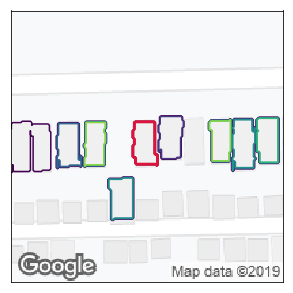

310
1083.25
490
Elapsed time:  6.419433116912842


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


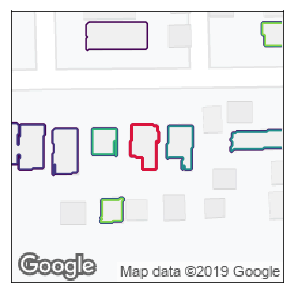

311
928.0
547
Elapsed time:  4.708417892456055


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


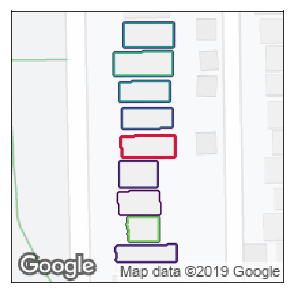

312
1191.875
623
Elapsed time:  5.217365741729736


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


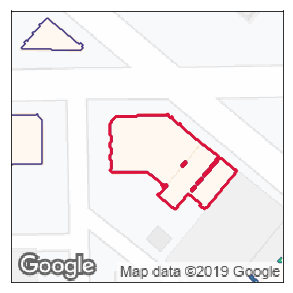

313
5182.25
3834
Elapsed time:  6.737109899520874


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


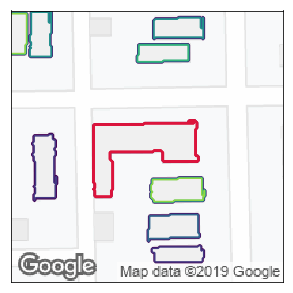

314
3990.75
2154
Elapsed time:  5.870664596557617


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


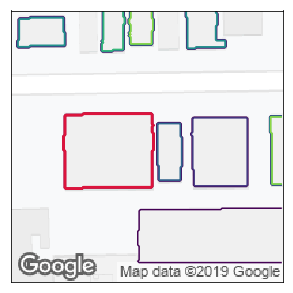

315
2897.625
3481
Elapsed time:  6.197812557220459


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


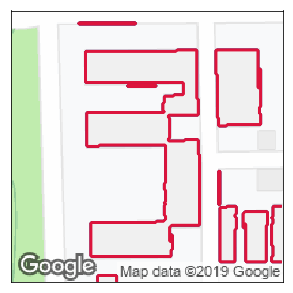

316
15633.375
29903
Elapsed time:  5.119714021682739


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


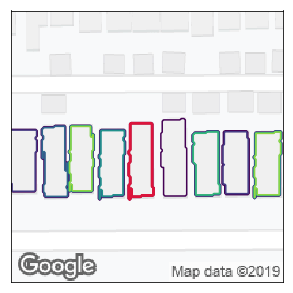

317
2532.625
880
Elapsed time:  4.481177806854248


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


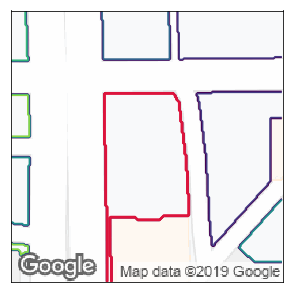

318
4465.25
5422
Elapsed time:  5.635552644729614


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


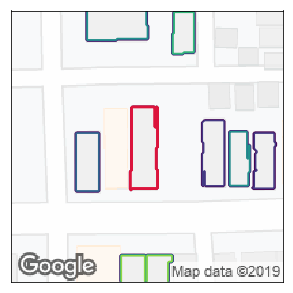

319
2503.75
1123
Elapsed time:  5.06769061088562


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


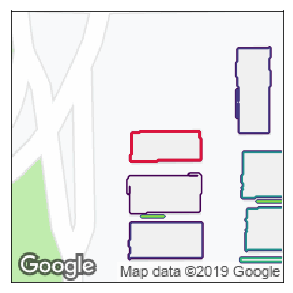

320
3124.0
1084
Elapsed time:  4.0094311237335205


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


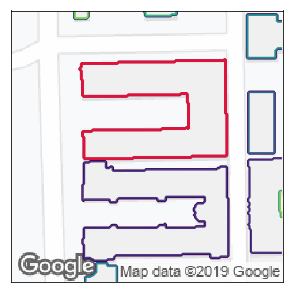

321
12761.2
5423
Elapsed time:  6.296542644500732


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


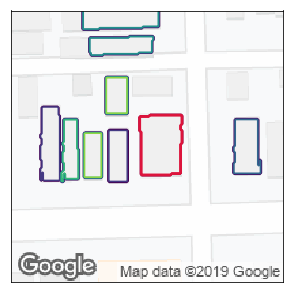

322
3062.0
1291
Elapsed time:  5.680552959442139


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


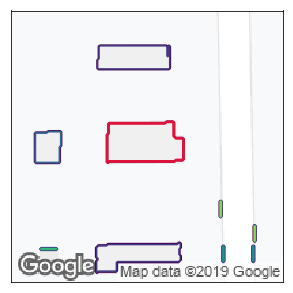

323
2924.5
1485
Elapsed time:  4.895725727081299


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


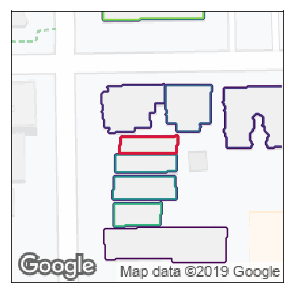

324
983.875
506
Elapsed time:  5.837954998016357


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


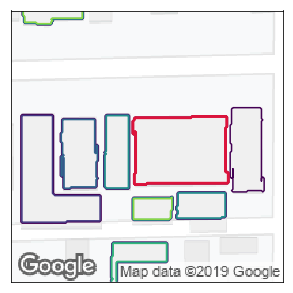

325
2879.275
3253
Elapsed time:  5.315141201019287


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


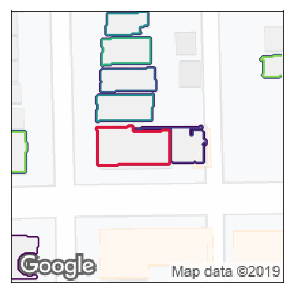

326
5289.375
1377
Elapsed time:  5.186853647232056


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


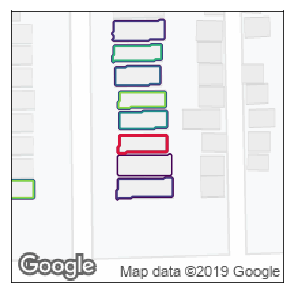

327
1078.4
430
Elapsed time:  5.803085088729858


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


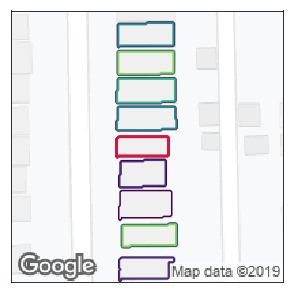

328
1315.25
532
Elapsed time:  4.903731107711792


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


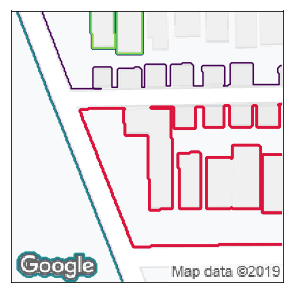

329
3617.5
7540
Elapsed time:  4.602847099304199


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


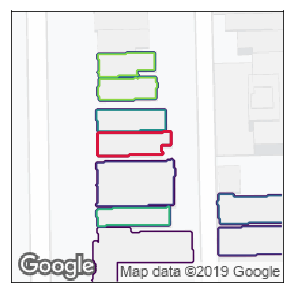

330
3183.465
846
Elapsed time:  5.3422932624816895


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


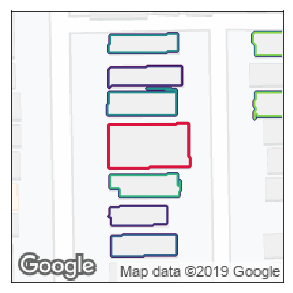

331
3648.125
1875
Elapsed time:  5.005038738250732


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


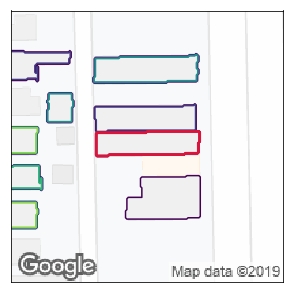

332
2659.75
1245
Elapsed time:  4.24075984954834


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


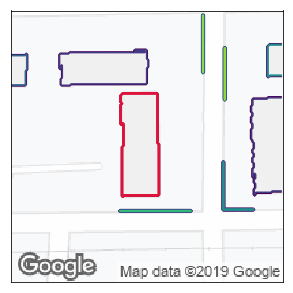

333
3827.375
1993
Elapsed time:  6.4066126346588135


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


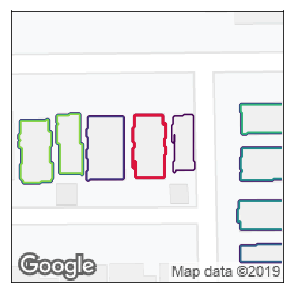

334
2140.25
1036
Elapsed time:  5.660861253738403


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


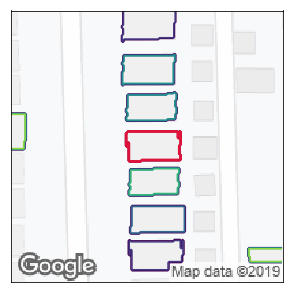

335
1562.125
813
Elapsed time:  7.117847442626953


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


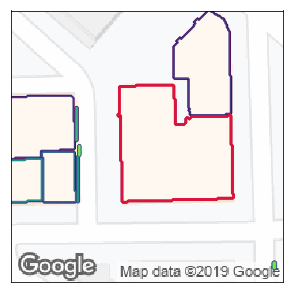

336
7032.135
5858
Elapsed time:  7.786124229431152


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


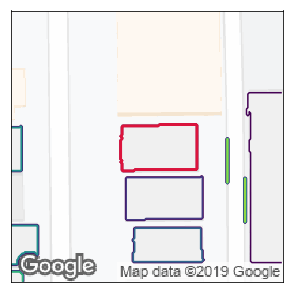

337
3113.125
1814
Elapsed time:  5.249112606048584


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


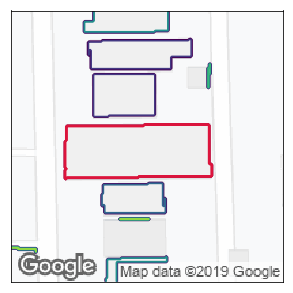

338
7107.75
4031
Elapsed time:  4.5162513256073


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


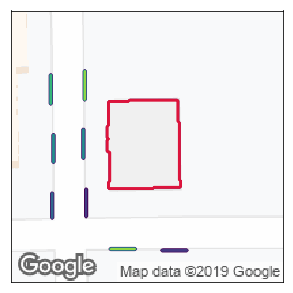

339
7867.5
3331
Elapsed time:  5.437789678573608


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


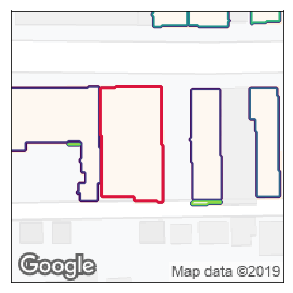

340
5045.25
3694
Elapsed time:  5.04155421257019


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


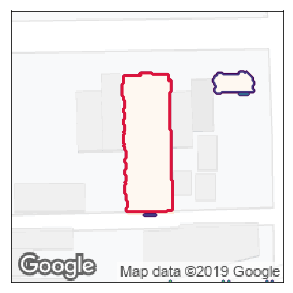

341
7343.875
3421
Elapsed time:  6.7303667068481445


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


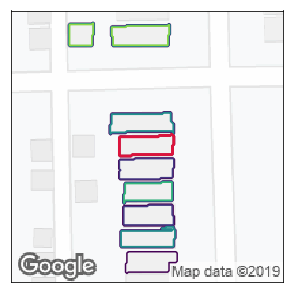

342
1243.125
534
Elapsed time:  4.387007474899292


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


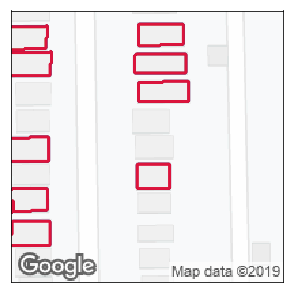

343
1275.25
35611
Elapsed time:  4.780924320220947


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


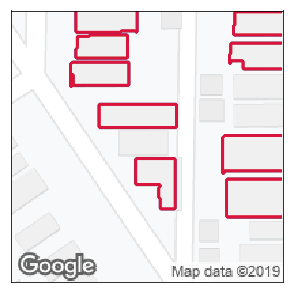

344
1146.125
32645
Elapsed time:  4.773650646209717


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


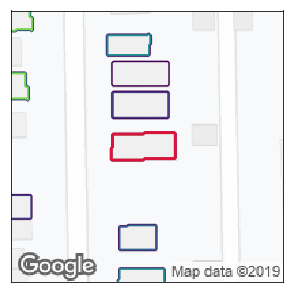

345
1991.25
883
Elapsed time:  4.733247756958008


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


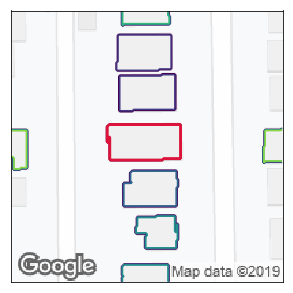

346
2877.75
1360
Elapsed time:  5.122927665710449


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


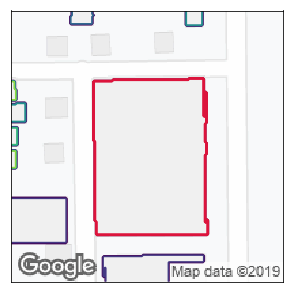

347
5530.09
9291
Elapsed time:  7.217296838760376


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


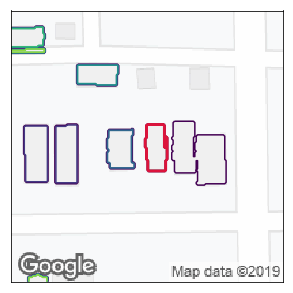

348
987.25
475
Elapsed time:  5.510807037353516


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


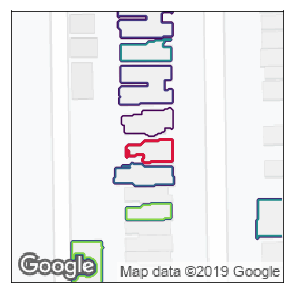

349
1180.75
429
Elapsed time:  7.89753794670105


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


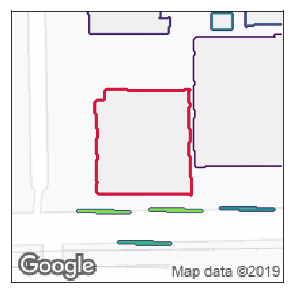

350
11399.75
5196
Elapsed time:  4.574128150939941


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


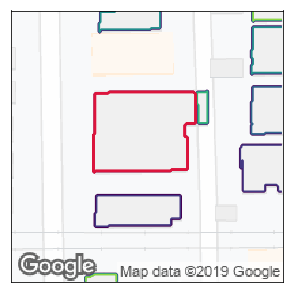

351
8150.79
4068
Elapsed time:  4.797988176345825


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


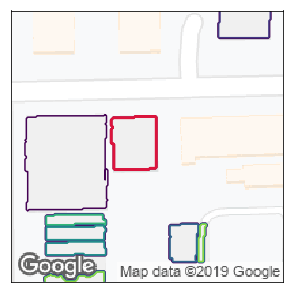

352
2845.125
1224
Elapsed time:  5.5770580768585205


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


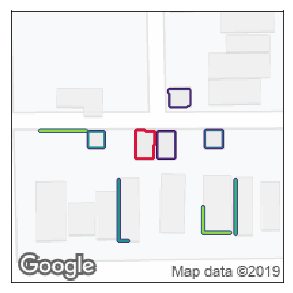

353
702.625
277
Elapsed time:  6.420413255691528


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


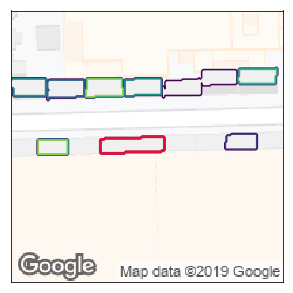

354
17489.025
500
Elapsed time:  5.30525279045105


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


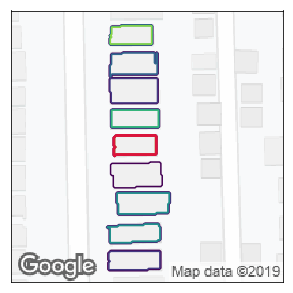

355
1472.125
433
Elapsed time:  7.509892463684082


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


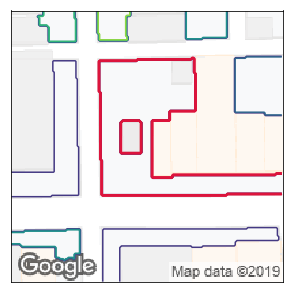

356
3303.25
6085
Elapsed time:  5.957007646560669


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


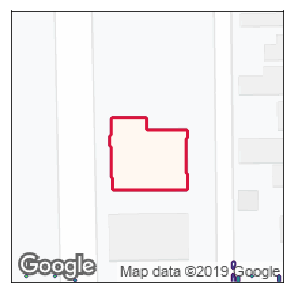

357
2986.75
2671
Elapsed time:  6.329847812652588


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


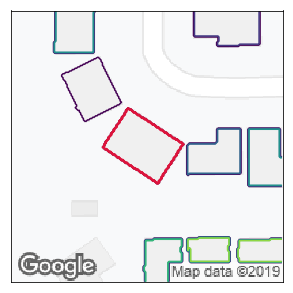

358
3287.25
1653
Elapsed time:  5.523991584777832


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


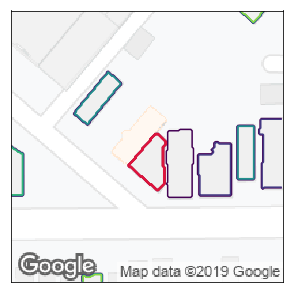

359
3239.125
629
Elapsed time:  4.688147306442261


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


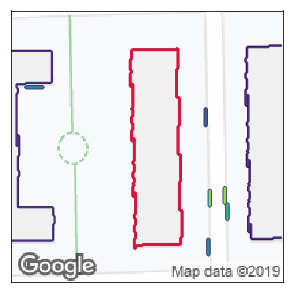

360
11977.625
4827
Elapsed time:  5.488391876220703


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


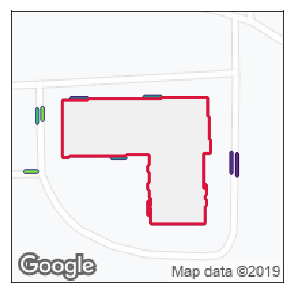

361
14350.375
6570
Elapsed time:  5.670228004455566


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


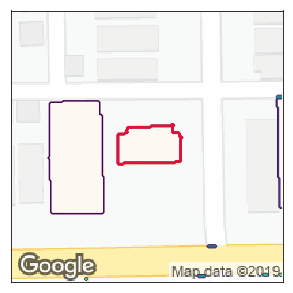

362
2299.57858063
1156
Elapsed time:  5.708222389221191


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


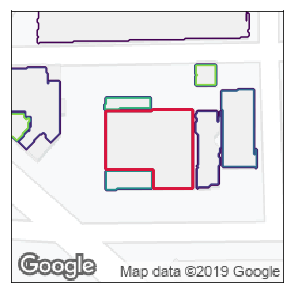

363
8549.0
3188
Elapsed time:  6.602160930633545


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


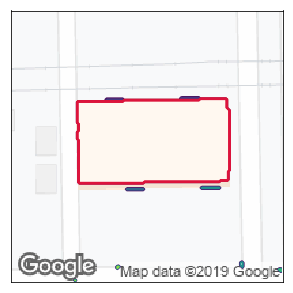

364
14658.0
6690
Elapsed time:  6.000450611114502


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


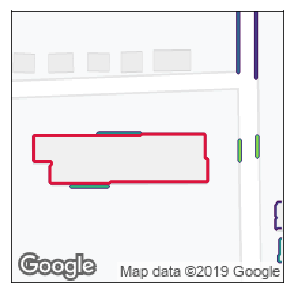

365
7254.785
4226
Elapsed time:  5.096135377883911


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


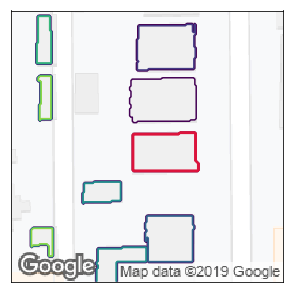

366
3267.875
1267
Elapsed time:  5.336335182189941


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


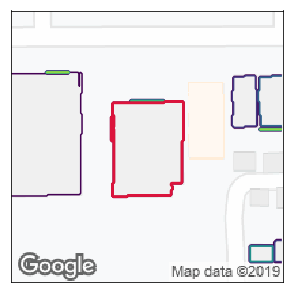

367
7500.625
3421
Elapsed time:  4.1203014850616455


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


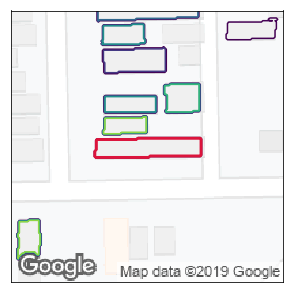

368
2951.0
1015
Elapsed time:  5.342583656311035


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


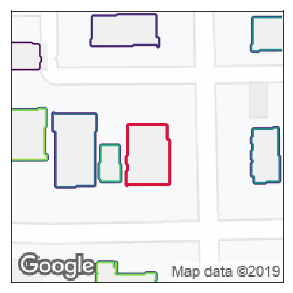

369
3528.625
1359
Elapsed time:  4.475647449493408


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


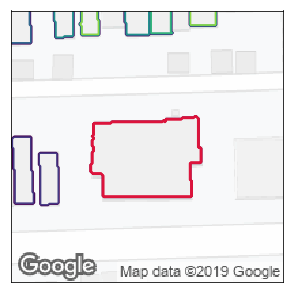

370
12051.875
4079
Elapsed time:  5.295281648635864


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


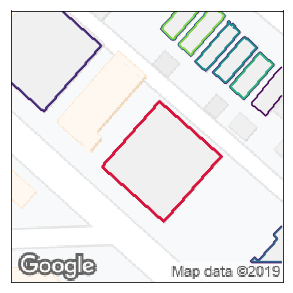

371
4213.25
3878
Elapsed time:  3.978360414505005


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


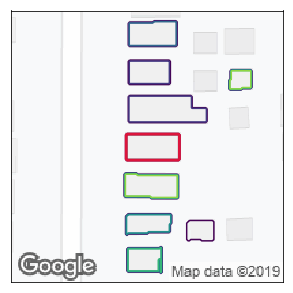

372
1238.0
741
Elapsed time:  5.447222471237183


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


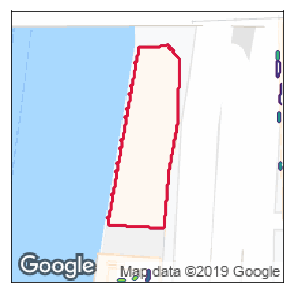

373
11346.75
4840
Elapsed time:  4.81615138053894


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


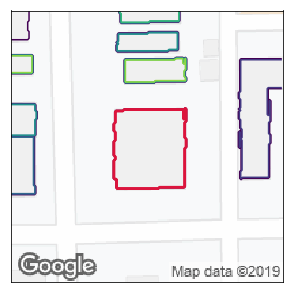

374
5986.875
2967
Elapsed time:  5.123715162277222


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


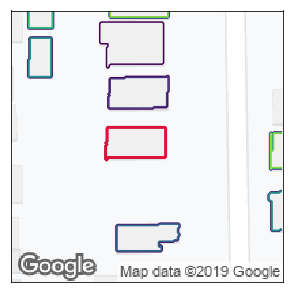

375
2792.125
958
Elapsed time:  6.876676321029663


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


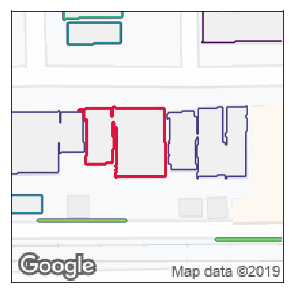

376
3622.5
2629
Elapsed time:  7.581544876098633


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


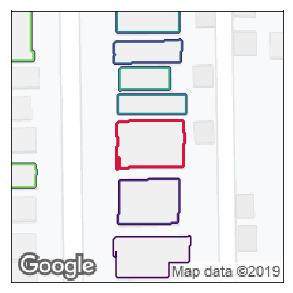

377
3638.625
1659
Elapsed time:  6.929561376571655


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


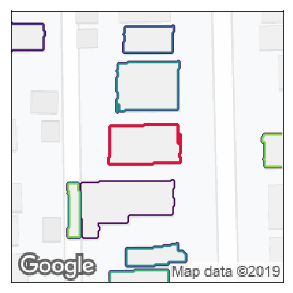

378
2872.0
1444
Elapsed time:  4.395379304885864


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


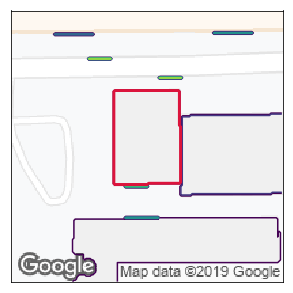

379
7944.41
3331
Elapsed time:  4.7409141063690186


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


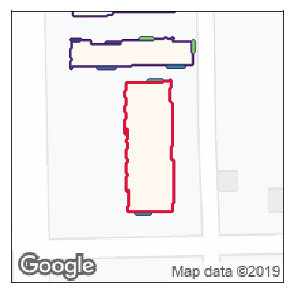

380
6986.25
3210
Elapsed time:  6.092223644256592


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


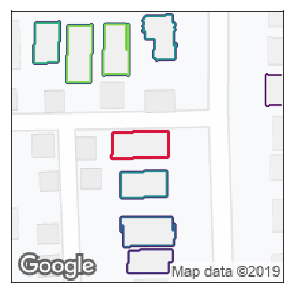

381
1541.5
782
Elapsed time:  4.941096305847168


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


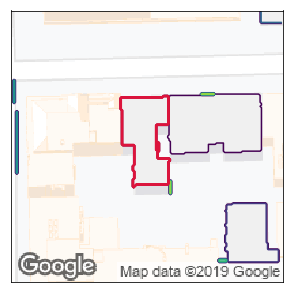

382
3459.5
1729
Elapsed time:  5.031451463699341


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


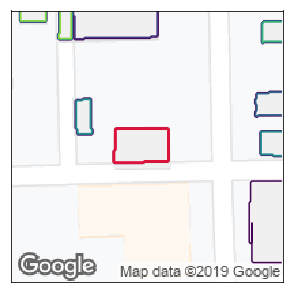

383
2550.125
966
Elapsed time:  5.000268459320068


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


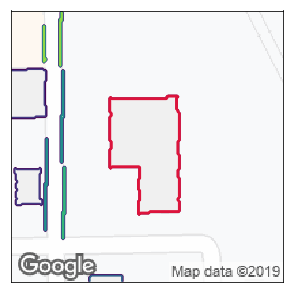

384
7420.625
3504
Elapsed time:  5.620702266693115


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


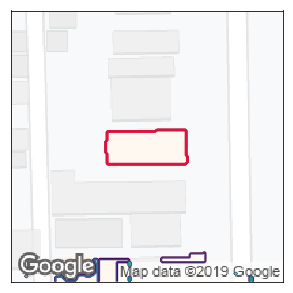

385
3016.625
1428
Elapsed time:  4.961179494857788


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


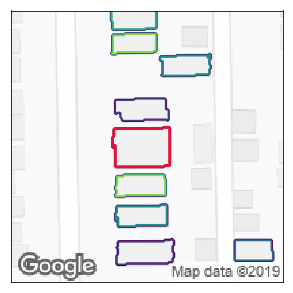

386
2498.125
1141
Elapsed time:  5.9466235637664795


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


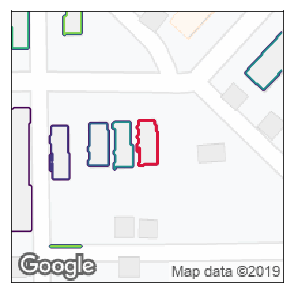

387
1202.0
440
Elapsed time:  5.049985647201538


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


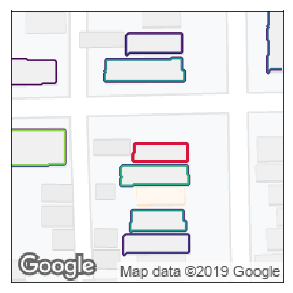

388
2603.5
513
Elapsed time:  4.048190355300903


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


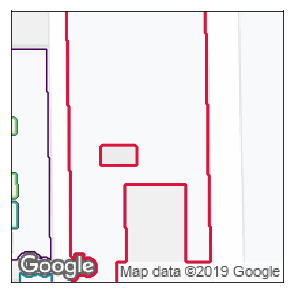

389
3834.375
16185
Elapsed time:  4.867865324020386


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


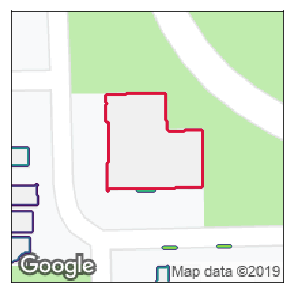

390
8457.25
4123
Elapsed time:  4.816123962402344


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


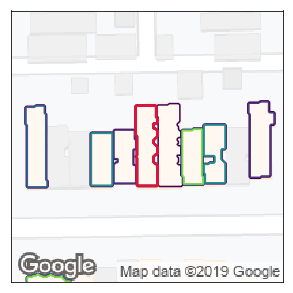

391
1762.25
852
Elapsed time:  6.729686498641968


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


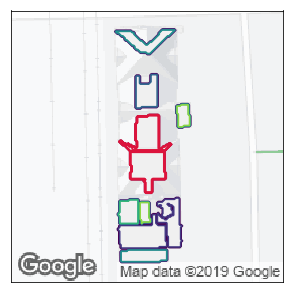

392
16105.875
1021
Elapsed time:  5.903896808624268


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


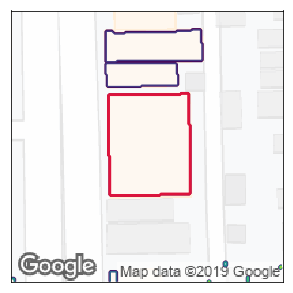

393
9362.79
4373
Elapsed time:  4.730754613876343


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


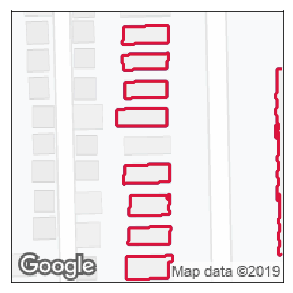

394
1256.25
36120
Elapsed time:  6.151368856430054


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


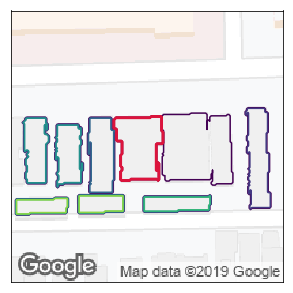

395
3004.8
1342
Elapsed time:  5.5421366691589355


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


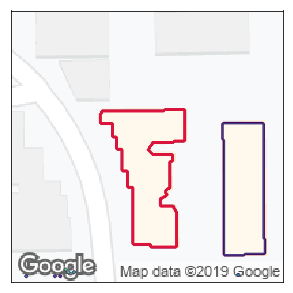

396
6127.35
3545
Elapsed time:  4.998948574066162


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


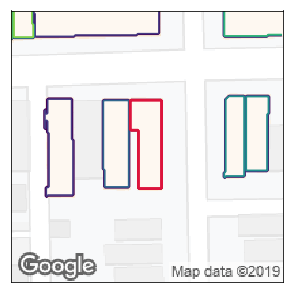

397
3187.875
1237
Elapsed time:  5.338388442993164


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


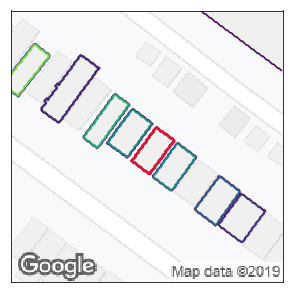

398
1032.25
494
Elapsed time:  8.066026210784912


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


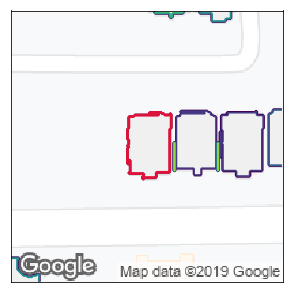

399
2727.43
1341
Elapsed time:  4.93390679359436


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


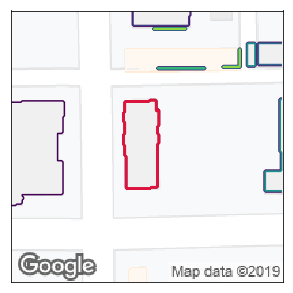

400
3134.875
1539
Elapsed time:  4.919136047363281


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


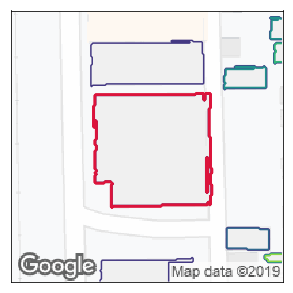

401
13537.125
6689
Elapsed time:  4.29785680770874


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


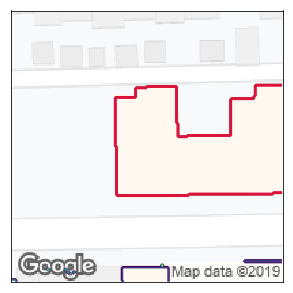

402
6731.625
8022
Elapsed time:  4.442033052444458


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


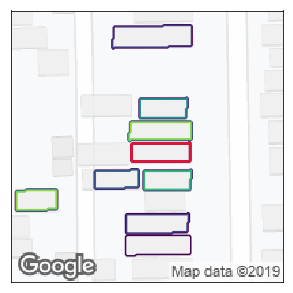

403
2671.375
560
Elapsed time:  4.593714475631714


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


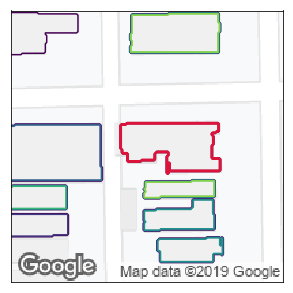

404
4896.5
2085
Elapsed time:  4.906832456588745


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


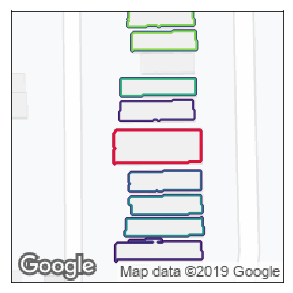

405
3674.0
1525
Elapsed time:  4.482126712799072


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


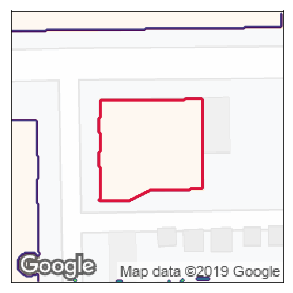

406
11230.125
5209
Elapsed time:  4.265578746795654


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


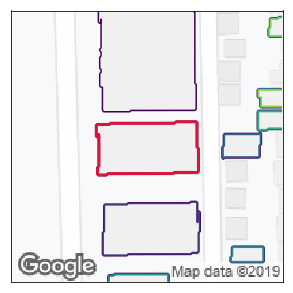

407
5132.5
2701
Elapsed time:  5.4827799797058105


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


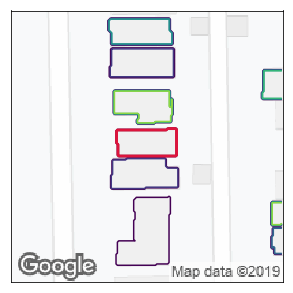

408
1692.5
834
Elapsed time:  5.993199825286865


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


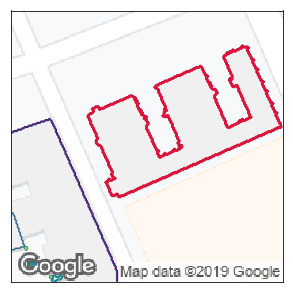

409
8421.163508
6567
Elapsed time:  4.400840759277344


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


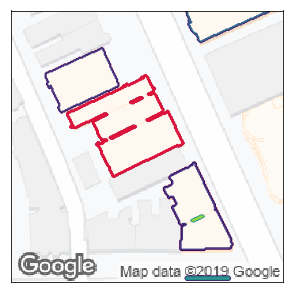

410
3492.515
3077
Elapsed time:  5.4402923583984375


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


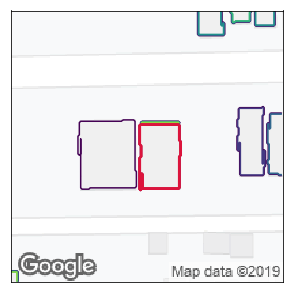

411
3707.95465088
1355
Elapsed time:  4.876584053039551


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


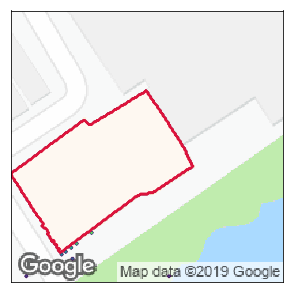

412
6772.375
7863
Elapsed time:  4.7374913692474365


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


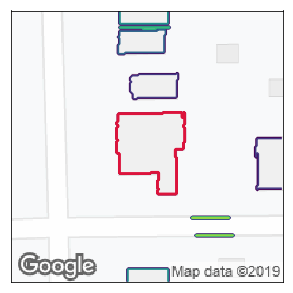

413
4918.75
2250
Elapsed time:  5.829311847686768


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


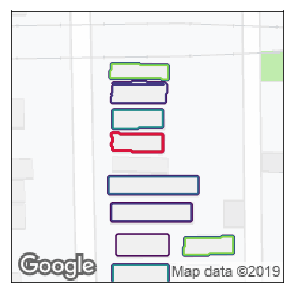

414
1253.44169754
478
Elapsed time:  4.869670391082764


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


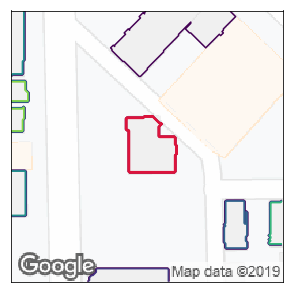

415
2679.0
1221
Elapsed time:  4.3585357666015625


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


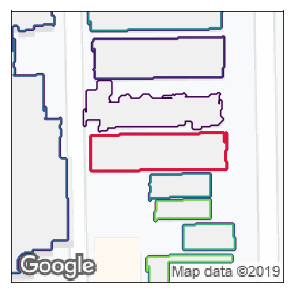

416
4604.375
2620
Elapsed time:  4.875030279159546


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


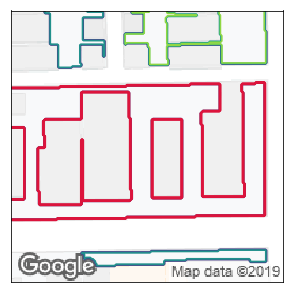

417
2949.125
9364
Elapsed time:  4.303044319152832


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


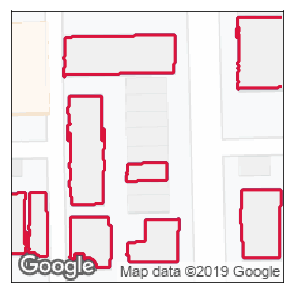

418
6265.88578827
29365
Elapsed time:  5.183943033218384


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


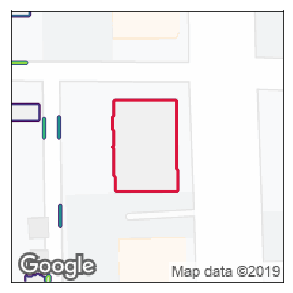

419
7392.5
3098
Elapsed time:  5.401967763900757


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


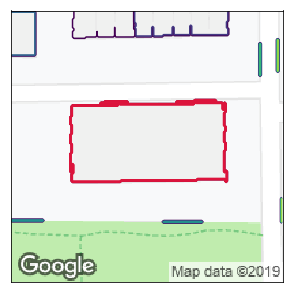

420
15270.25
6382
Elapsed time:  5.248057126998901


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


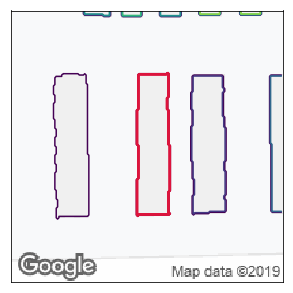

421
5033.25
2346
Elapsed time:  5.390851020812988


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


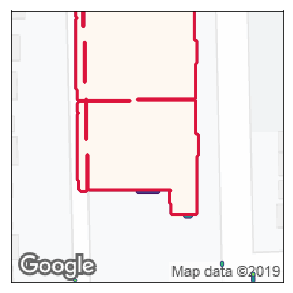

422
12222.375
11761
Elapsed time:  5.653955936431885


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


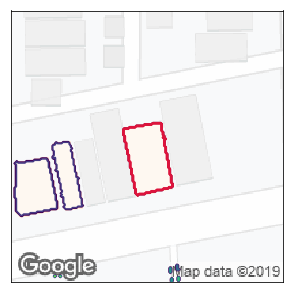

423
11071.5
1357
Elapsed time:  4.78102970123291


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


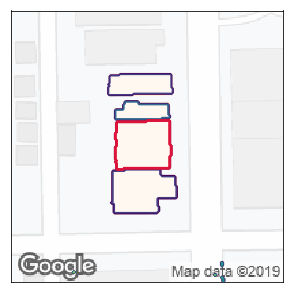

424
2708.125
1372
Elapsed time:  4.05413031578064


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


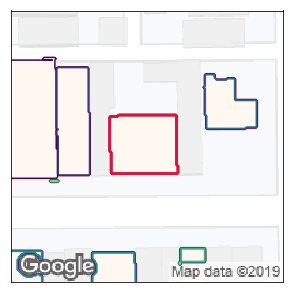

425
4249.495
2091
Elapsed time:  4.648329734802246


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


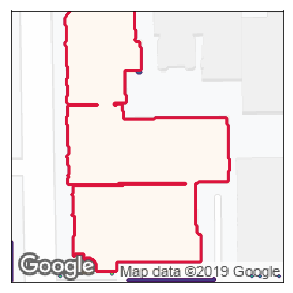

426
13603.41
14617
Elapsed time:  4.330448389053345


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


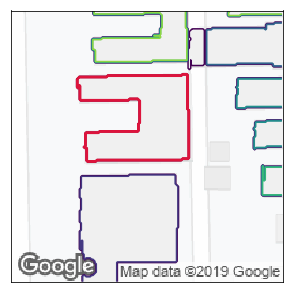

427
8692.625
3819
Elapsed time:  4.087912321090698


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


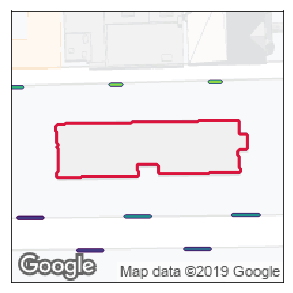

428
11820.25
5117
Elapsed time:  4.315964937210083


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


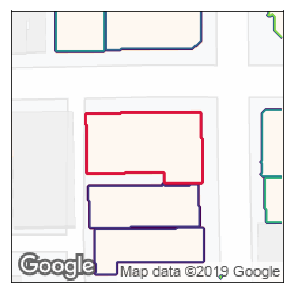

429
8519.475
3956
Elapsed time:  4.694411039352417


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


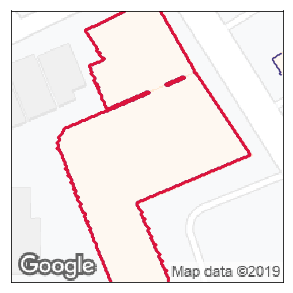

430
18871.025
14543
Elapsed time:  4.449561357498169


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


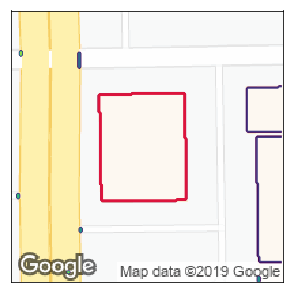

431
11020.25
4915
Elapsed time:  4.626797437667847


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


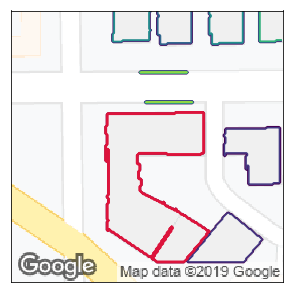

432
5931.0
5218
Elapsed time:  5.914988994598389


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


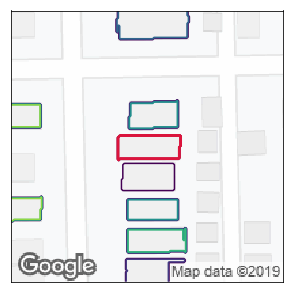

433
1470.25
773
Elapsed time:  4.056653261184692


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


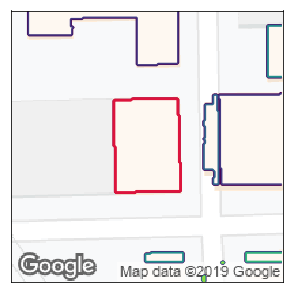

434
7040.15253845
3242
Elapsed time:  5.227533578872681


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


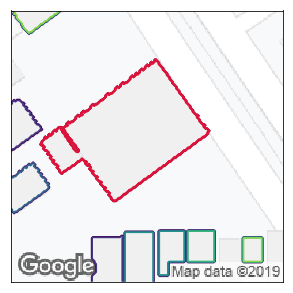

435
6300.72106949
6191
Elapsed time:  5.072449207305908


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


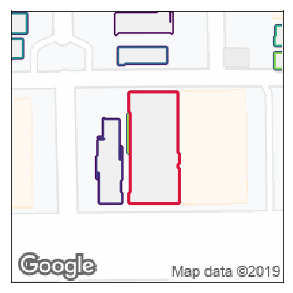

436
6188.01
2927
Elapsed time:  4.233243703842163


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


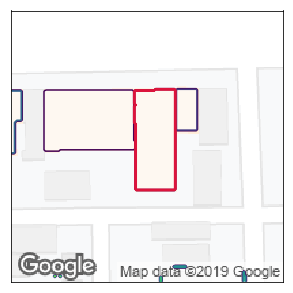

437
5861.895
2155
Elapsed time:  3.9630494117736816


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


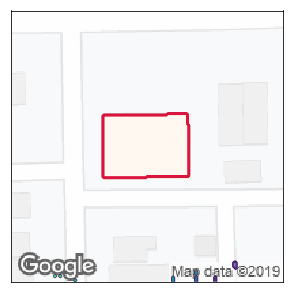

438
6395.0
2875
Elapsed time:  4.142263889312744


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


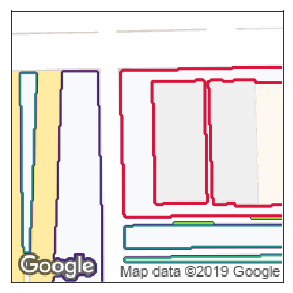

439
4402.12466125
4449
Elapsed time:  5.6833648681640625


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


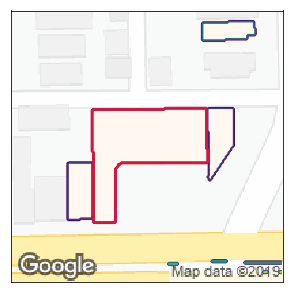

440
8923.075
4022
Elapsed time:  4.0497214794158936


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


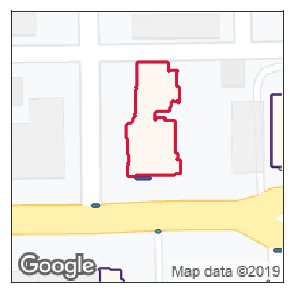

441
3478.32822266
2584
Elapsed time:  4.2098329067230225


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


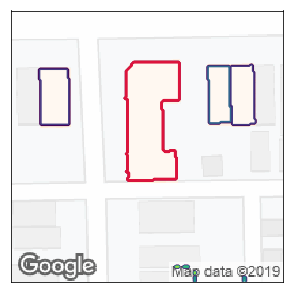

442
3758.13698425
2793
Elapsed time:  5.181605577468872


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


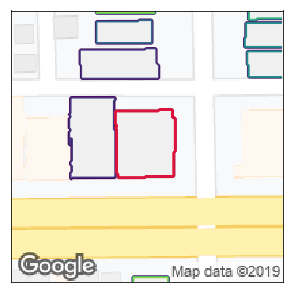

443
4271.63623047
2075
Elapsed time:  4.731976509094238


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


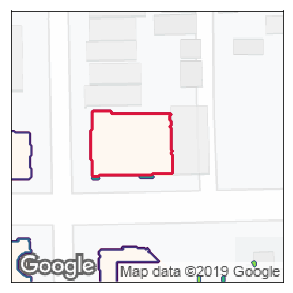

444
8911.25
2661
Elapsed time:  4.142341375350952


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


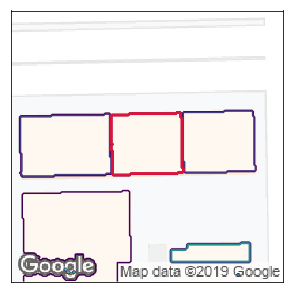

445
4773.78357498
2270
Elapsed time:  4.855082035064697


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


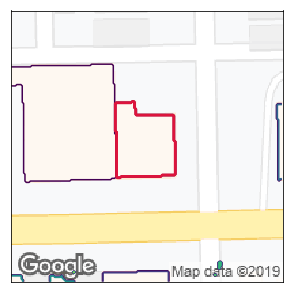

446
3982.0
2054
Elapsed time:  5.4187586307525635


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


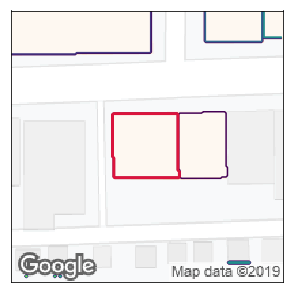

447
5153.5
2246
Elapsed time:  5.069085121154785


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


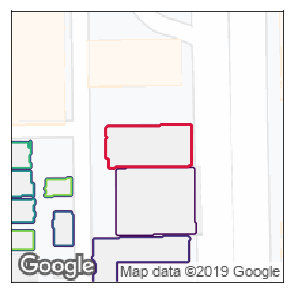

448
4020.14089294
1902
Elapsed time:  5.237818956375122


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


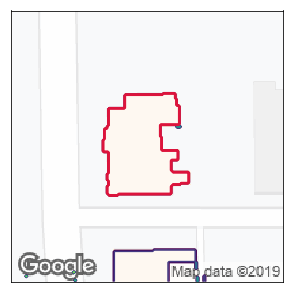

449
7519.25
3446
Elapsed time:  6.406690835952759


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


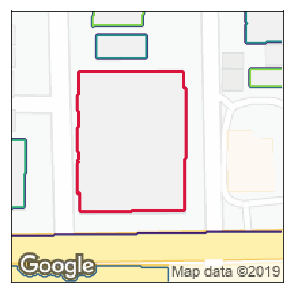

450
18330.0
8075
Elapsed time:  5.953678846359253


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


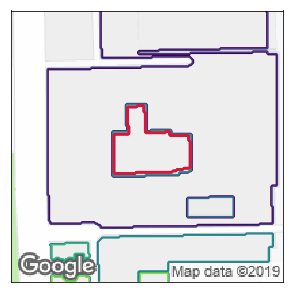

451
4578.25
1813
Elapsed time:  4.792316436767578


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


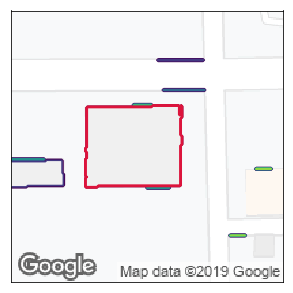

452
6119.75
4063
Elapsed time:  4.473243236541748


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


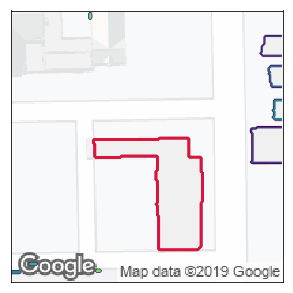

453
2777.48671875
3073
Elapsed time:  3.7934484481811523


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


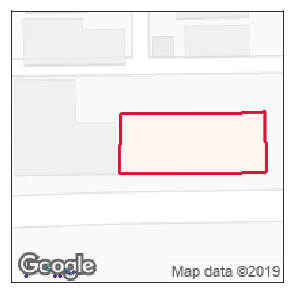

454
3210.48049431
4708
Elapsed time:  4.710628509521484


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


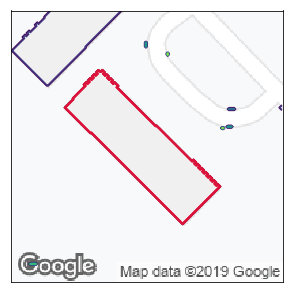

455
7232.0
4604
Elapsed time:  5.202238082885742


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


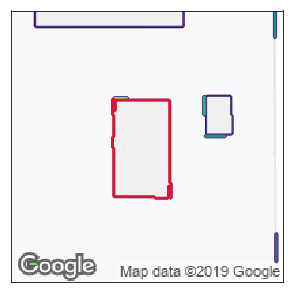

456
7366.625
2936
Elapsed time:  4.564424514770508


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


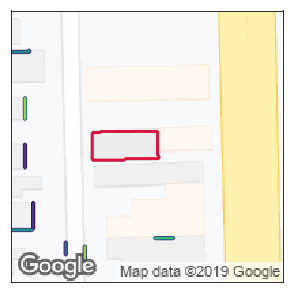

457
4107.12368782
980
Elapsed time:  4.04357123374939


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


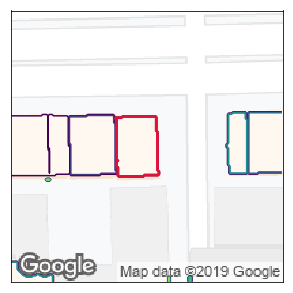

458
2617.94638672
1291
Elapsed time:  4.627345085144043


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


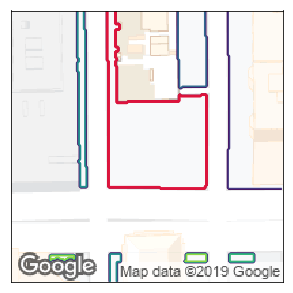

459
6439.75
5063
Elapsed time:  4.314314365386963


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


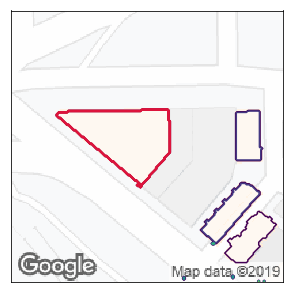

460
8676.84
2692
Elapsed time:  4.09039568901062


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


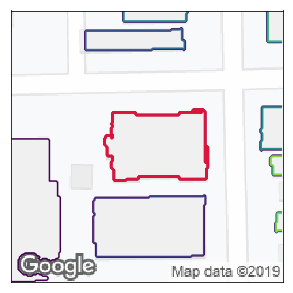

461
8606.75
3330
Elapsed time:  3.9044854640960693


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


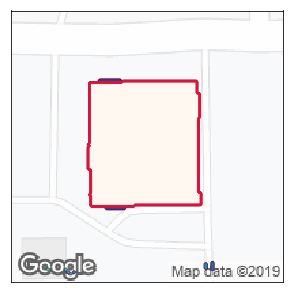

462
14445.731967200001
7308
Elapsed time:  5.986565113067627


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


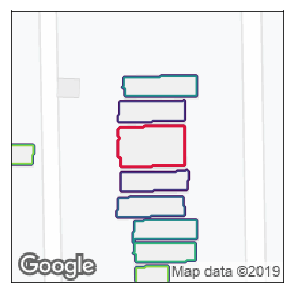

463
4211.43596161
1410
Elapsed time:  4.6697986125946045


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


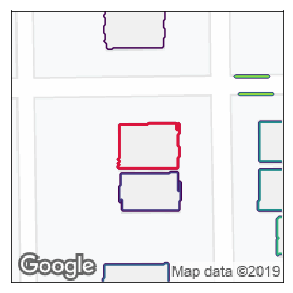

464
2644.45948677
1413
Elapsed time:  5.230491399765015


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


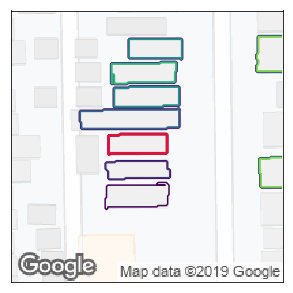

465
1155.57475204
595
Elapsed time:  4.878803014755249


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


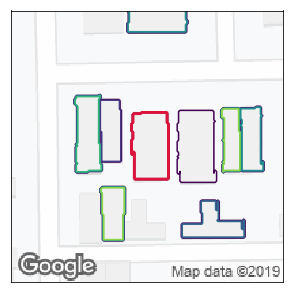

466
3191.17507782
1257
Elapsed time:  4.932342767715454


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


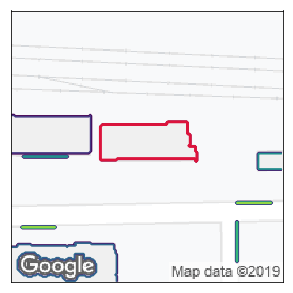

467
4175.65998932
1719
Elapsed time:  5.132861852645874


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


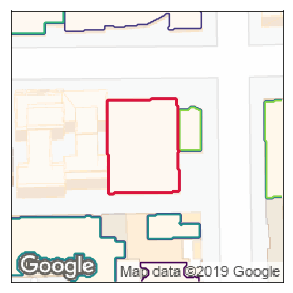

468
6410.45339233
3540
Elapsed time:  5.9300456047058105


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


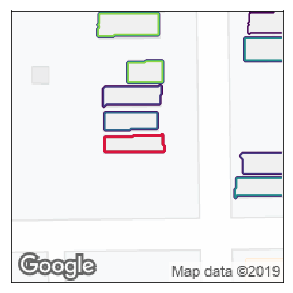

469
1449.32109222
501
Elapsed time:  5.928001165390015


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


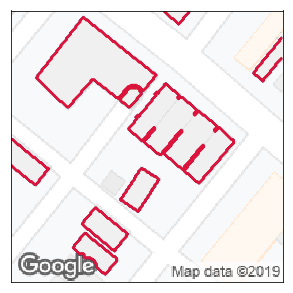

470
2679.95
32235
Elapsed time:  5.296734094619751


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


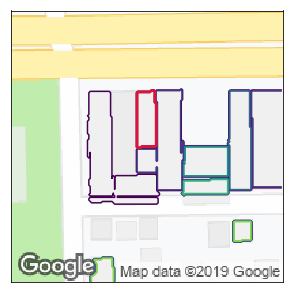

471
8516.75
558
Elapsed time:  6.952980279922485


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


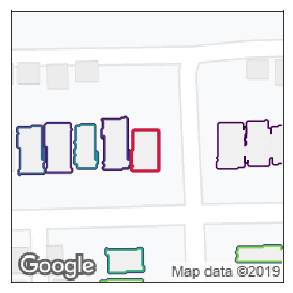

472
1266.875
584
Elapsed time:  5.76823353767395


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


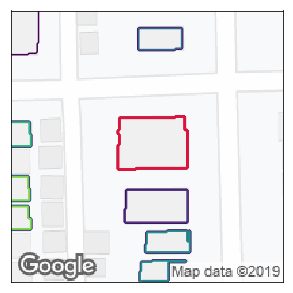

473
3463.5
1872
Elapsed time:  5.192775011062622


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


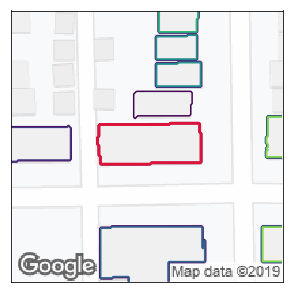

474
4135.0
2154
Elapsed time:  4.199579238891602


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


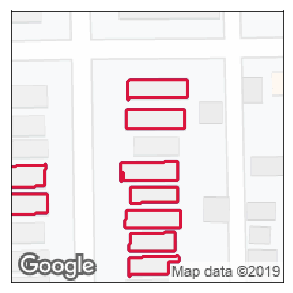

475
1005.375
35722
Elapsed time:  3.8992068767547607


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


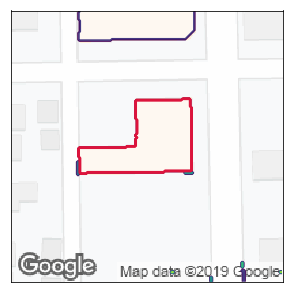

476
6938.5
2899
Elapsed time:  4.312142610549927


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


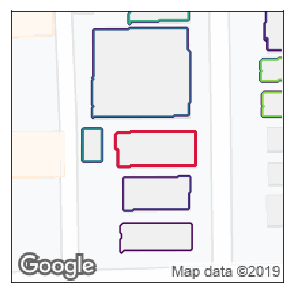

477
3110.625
1448
Elapsed time:  4.460601329803467


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


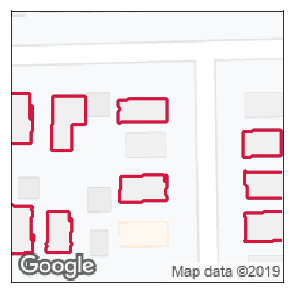

478
858.75
34720
Elapsed time:  4.3313562870025635


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


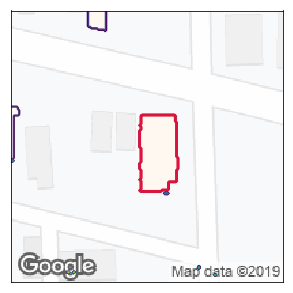

479
3654.875
1434
Elapsed time:  4.153018951416016


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


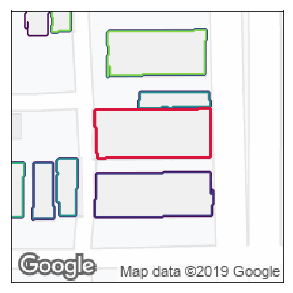

480
9009.97
2965
Elapsed time:  4.759479284286499


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


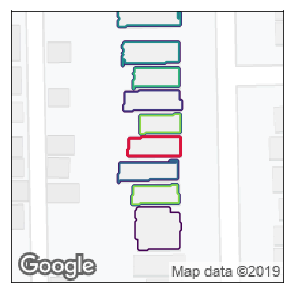

481
1165.5
528
Elapsed time:  4.405338764190674


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


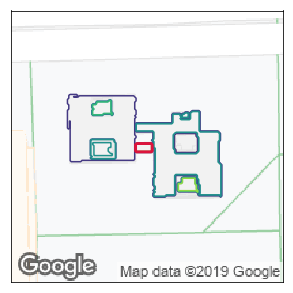

482
11226.25
72
Elapsed time:  4.242706298828125


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


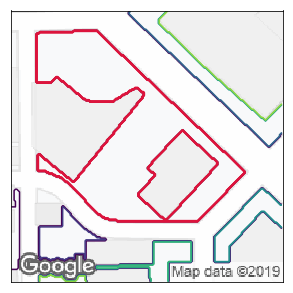

483
3308.2
8702
Elapsed time:  4.778653383255005


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


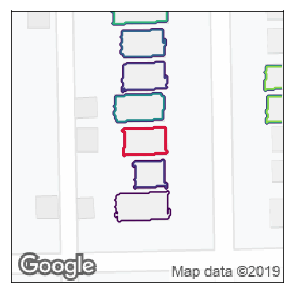

484
1127.0
582
Elapsed time:  5.465442180633545


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


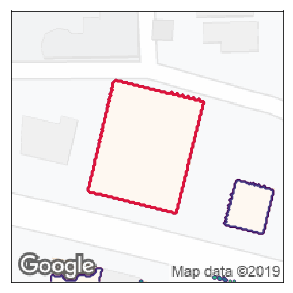

485
12792.875
5677
Elapsed time:  4.240885496139526


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


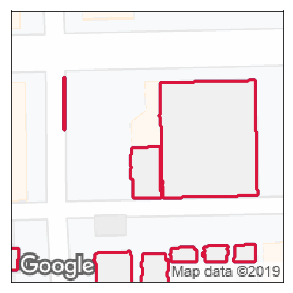

486
3587.575
31592
Elapsed time:  4.096426963806152


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


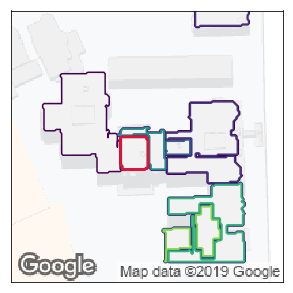

487
13696.5
473
Elapsed time:  4.7985169887542725


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


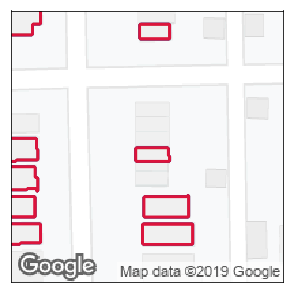

488
3034.625
36896
Elapsed time:  4.41156005859375


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


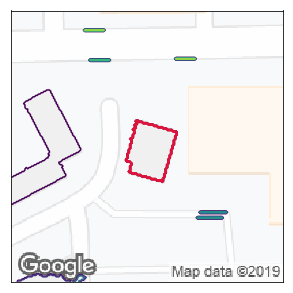

489
2341.375
1108
Elapsed time:  4.621381759643555


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


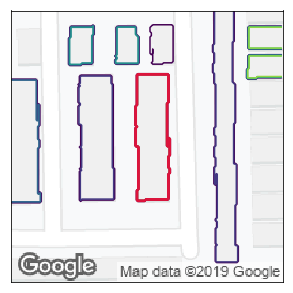

490
5155.5
2104
Elapsed time:  4.628923654556274


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


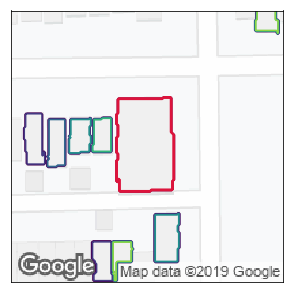

491
6752.0
2746
Elapsed time:  4.282206058502197


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


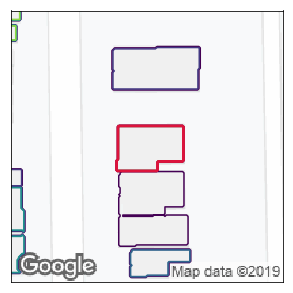

492
3135.125
1459
Elapsed time:  4.04443359375


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


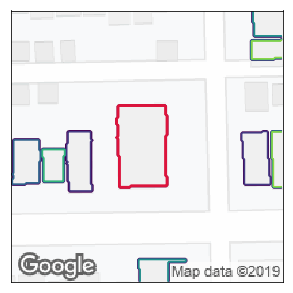

493
4540.5
2079
Elapsed time:  4.328686475753784


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


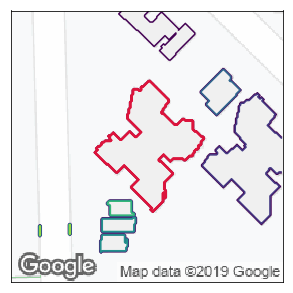

494
7714.625
3179
Elapsed time:  5.484798192977905


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


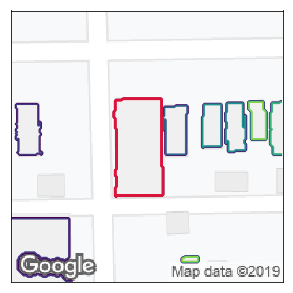

495
4503.5
2398
Elapsed time:  5.461524963378906


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


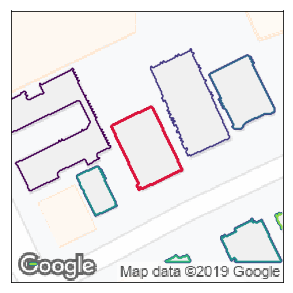

496
3858.25
1727
Elapsed time:  5.695796251296997


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


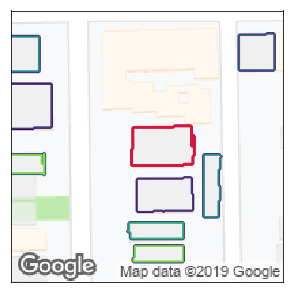

497
2644.86
1251
Elapsed time:  4.703542470932007


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


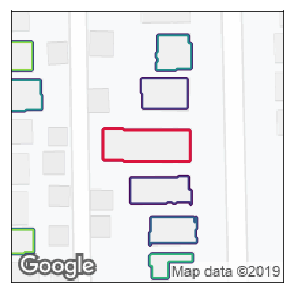

498
2651.75
1472
Elapsed time:  4.552767515182495


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


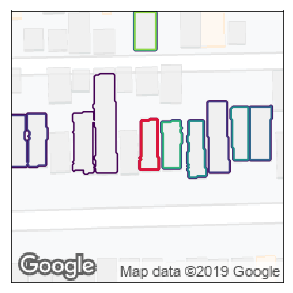

499
1110.75
455
Elapsed time:  4.091618299484253


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


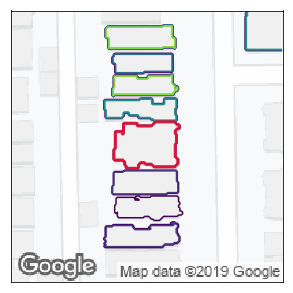

500
2977.0
1347
Elapsed time:  4.852001428604126


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


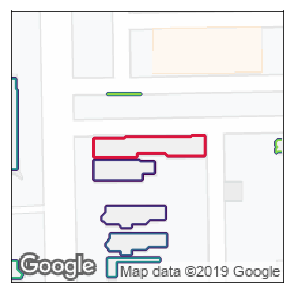

501
2796.75
1124
Elapsed time:  4.368985176086426


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


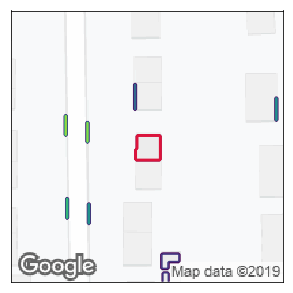

502
811.705
314
Elapsed time:  4.723703861236572


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


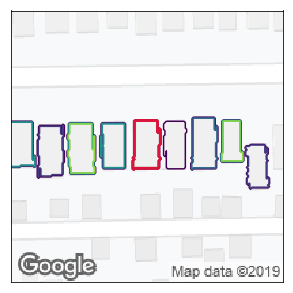

503
1226.75
643
Elapsed time:  5.10200834274292


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


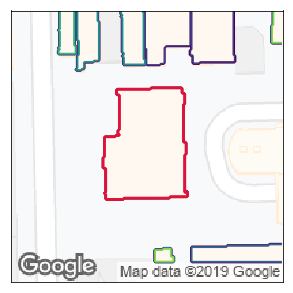

504
9366.75
4343
Elapsed time:  4.5945587158203125


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


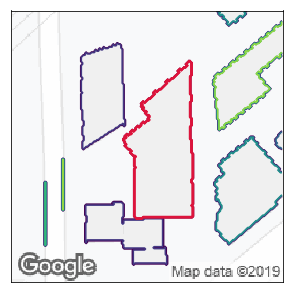

505
2530.0
4028
Elapsed time:  4.538383483886719


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


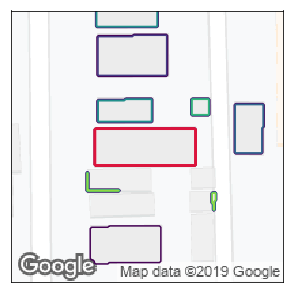

506
5744.0
1998
Elapsed time:  4.9740049839019775


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


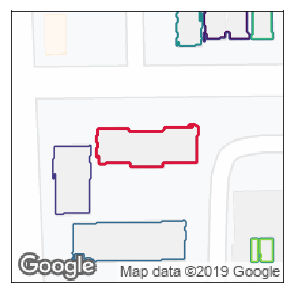

507
4265.25
1897
Elapsed time:  4.442661285400391


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


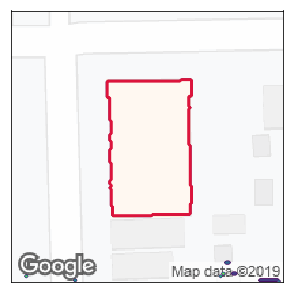

508
12230.625
5776
Elapsed time:  4.129140138626099


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


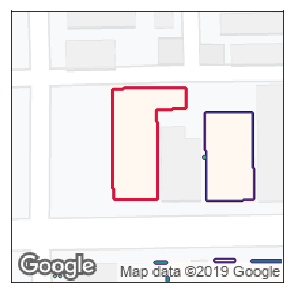

509
6092.0
3007
Elapsed time:  4.124588489532471


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


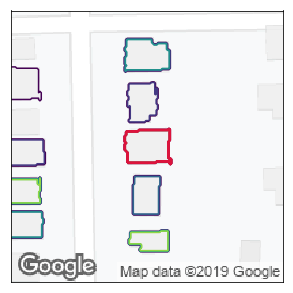

510
1538.375
743
Elapsed time:  4.6507158279418945


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


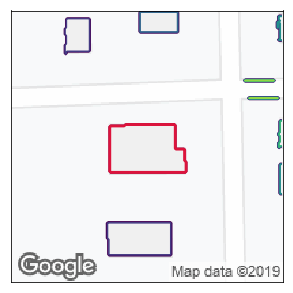

511
3455.875
1796
Elapsed time:  6.060338973999023


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


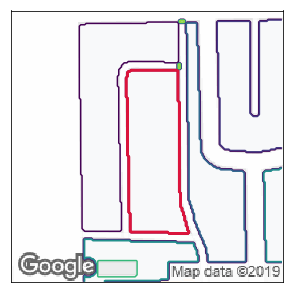

512
4653.75
4544
Elapsed time:  6.58146858215332


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


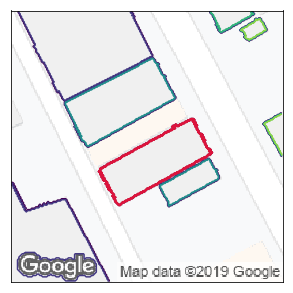

513
8658.195
2315
Elapsed time:  5.290140151977539


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


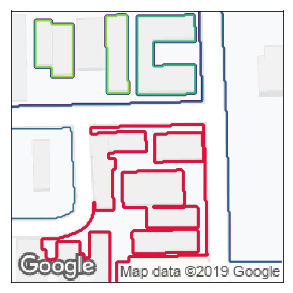

514
2928.125
3713
Elapsed time:  4.148106813430786


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


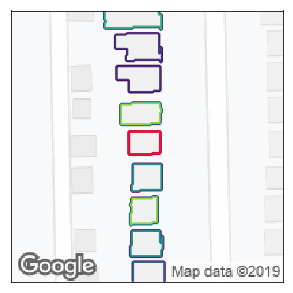

515
949.75
385
Elapsed time:  4.442502975463867


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


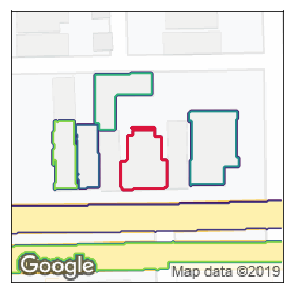

516
5854.92
1242
Elapsed time:  5.0313146114349365


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


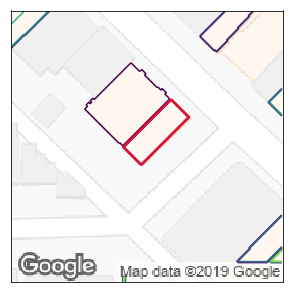

517
2988.49
910
Elapsed time:  4.2769341468811035


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


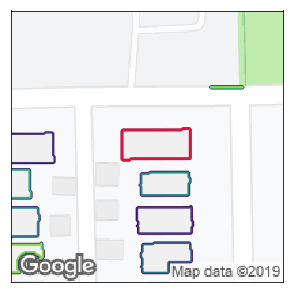

518
2613.125
1062
Elapsed time:  5.597409963607788


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


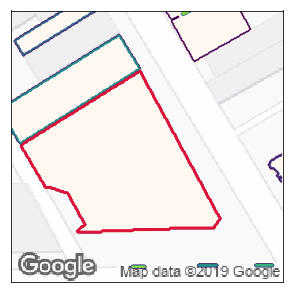

519
3387.34
9961
Elapsed time:  5.53144907951355


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


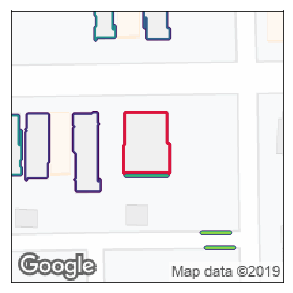

520
3109.13300781
1428
Elapsed time:  6.461174964904785


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


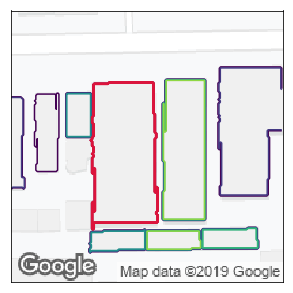

521
6905.05
4665
Elapsed time:  4.069943904876709


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


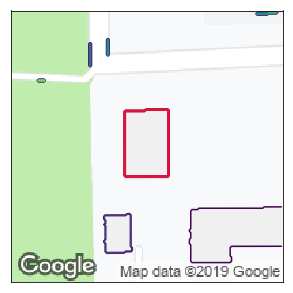

522
3479.25
1553
Elapsed time:  5.913702011108398


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


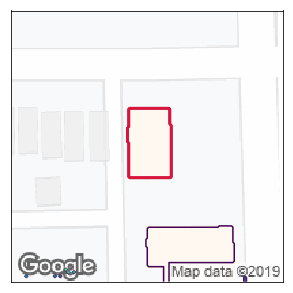

523
2956.75
1580
Elapsed time:  6.030802965164185


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


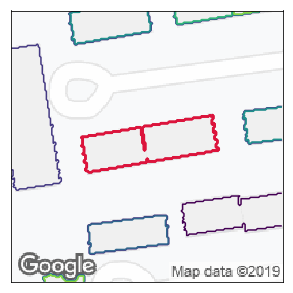

524
4621.75
2515
Elapsed time:  5.296796798706055


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


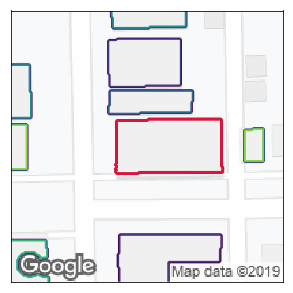

525
2958.87733307
3003
Elapsed time:  4.67148494720459


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


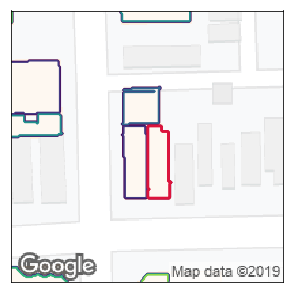

526
5457.0
787
Elapsed time:  4.123589992523193


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


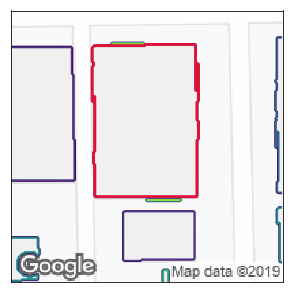

527
14644.875
8454
Elapsed time:  4.428620100021362


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


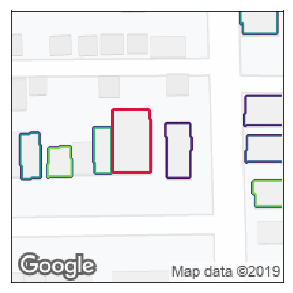

528
3201.0
1281
Elapsed time:  5.586613655090332


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


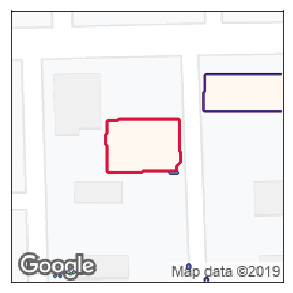

529
4516.93323601
2039
Elapsed time:  4.7824132442474365


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


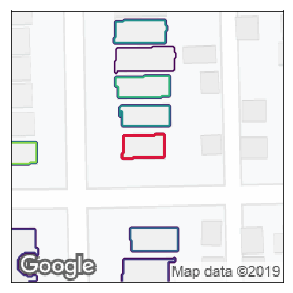

530
926.5
498
Elapsed time:  4.274430990219116


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


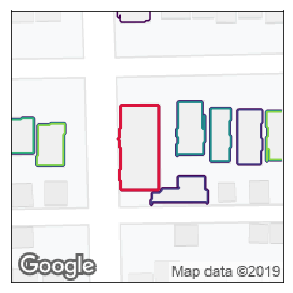

531
2567.625
1759
Elapsed time:  4.482950448989868


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


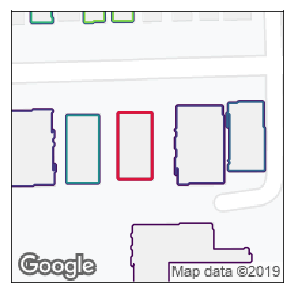

532
3143.625
1225
Elapsed time:  4.5806779861450195


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


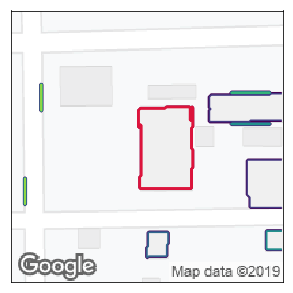

533
4600.875
2255
Elapsed time:  4.828074932098389


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


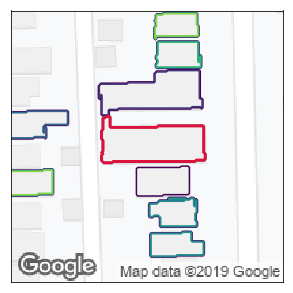

534
3796.26
1941
Elapsed time:  4.687358379364014


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


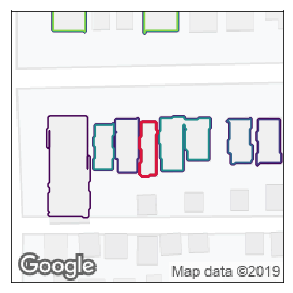

535
1256.25
456
Elapsed time:  5.509333372116089


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


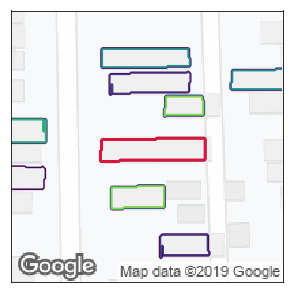

536
2809.625
1197
Elapsed time:  5.119006633758545


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


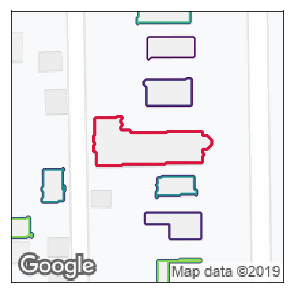

537
4333.625
2126
Elapsed time:  5.0986082553863525


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


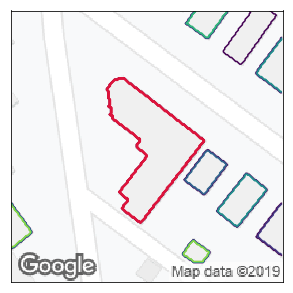

538
6955.875
3370
Elapsed time:  5.111408233642578


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


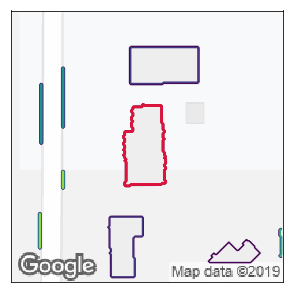

539
2983.25
1528
Elapsed time:  4.154452800750732


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


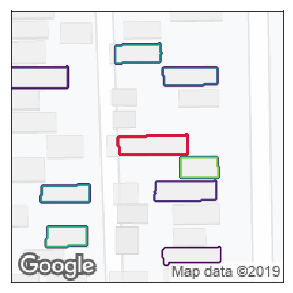

540
1901.5
688
Elapsed time:  4.78179407119751


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


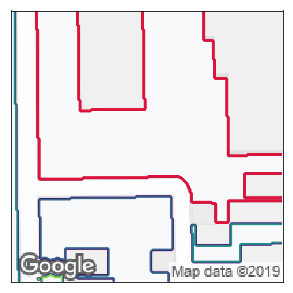

541
2545.625
14487
Elapsed time:  6.598450183868408


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


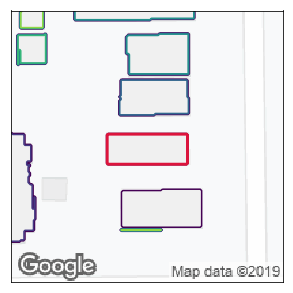

542
2783.125
1298
Elapsed time:  5.204060077667236


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


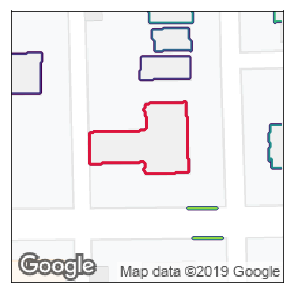

543
6283.375
2547
Elapsed time:  4.7837677001953125


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


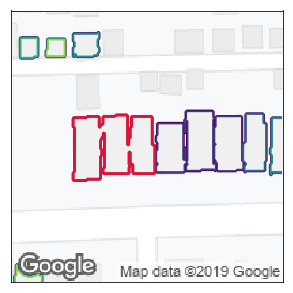

544
1400.75
2367
Elapsed time:  4.8310463428497314


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


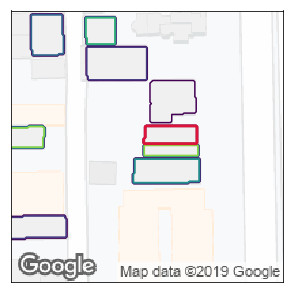

545
3747.25
498
Elapsed time:  5.841107606887817


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


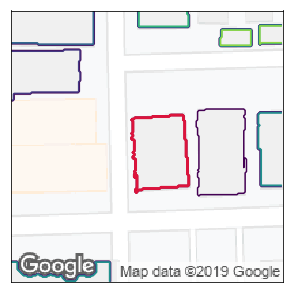

546
3952.75
1996
Elapsed time:  4.275005340576172


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


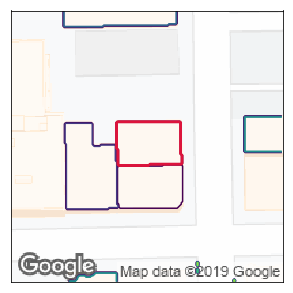

547
3422.875
1476
Elapsed time:  5.254977464675903


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


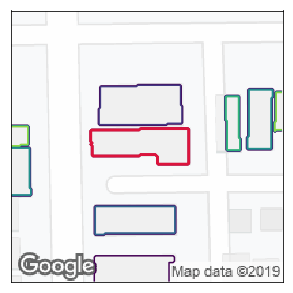

548
2807.625
1521
Elapsed time:  4.5195465087890625


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


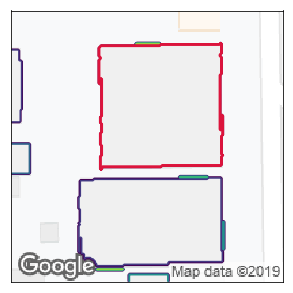

549
5084.34
7880
Elapsed time:  4.2014007568359375


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


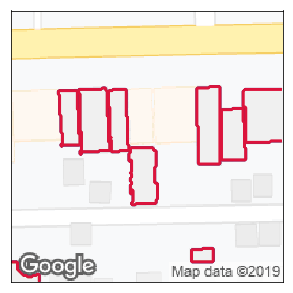

550
2869.625
34251
Elapsed time:  5.6019816398620605


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


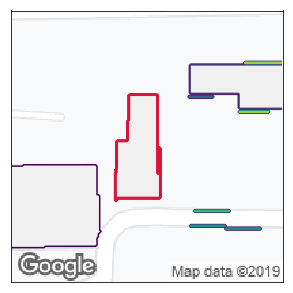

551
4551.5
2066
Elapsed time:  5.7455854415893555


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


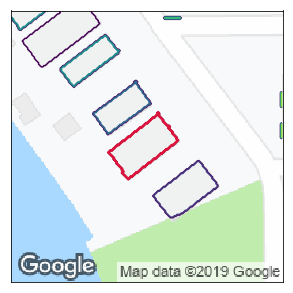

552
2809.125
1121
Elapsed time:  4.201207637786865


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


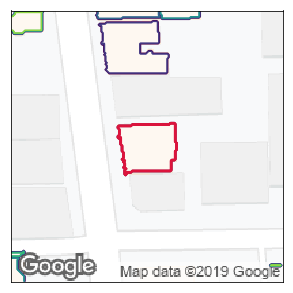

553
2717.625
1318
Elapsed time:  4.955758571624756


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


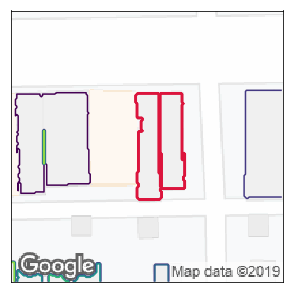

554
2924.175
2351
Elapsed time:  5.2542901039123535


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


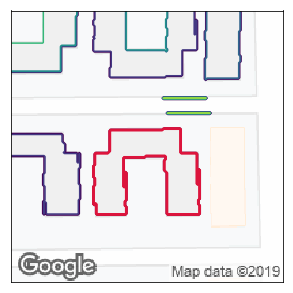

555
6401.875
3046
Elapsed time:  4.972301721572876


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


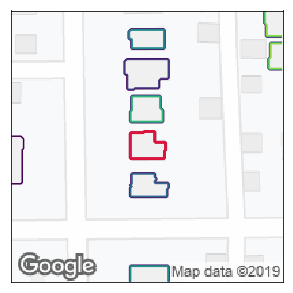

556
928.75
440
Elapsed time:  5.995706796646118


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


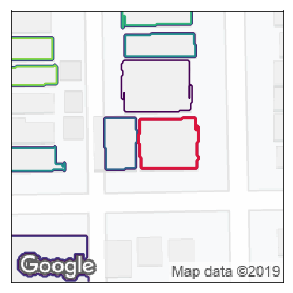

557
4925.125
1528
Elapsed time:  8.696511507034302


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


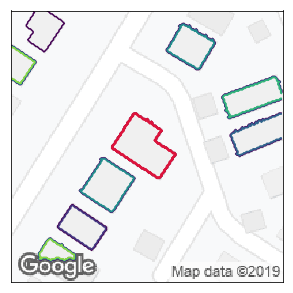

558
2522.75
1116
Elapsed time:  4.736007928848267


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


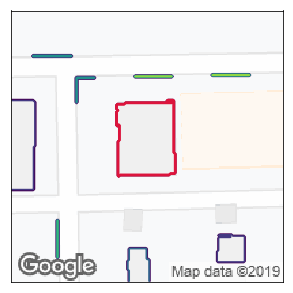

559
5965.34
2190
Elapsed time:  5.170641660690308


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


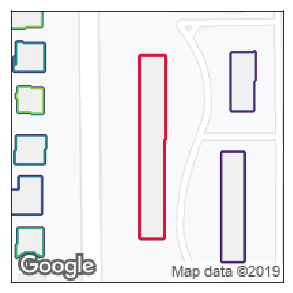

560
5760.75
2492
Elapsed time:  6.006333351135254


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


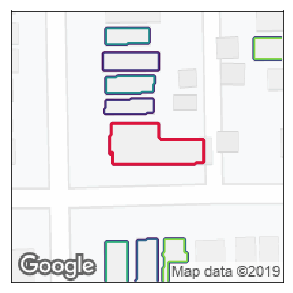

561
4227.0
1644
Elapsed time:  7.427285194396973


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


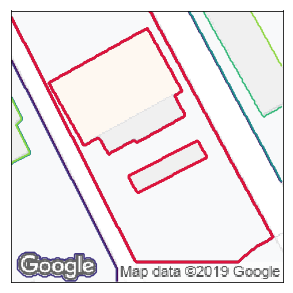

562
7431.5
13255
Elapsed time:  5.3136866092681885


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


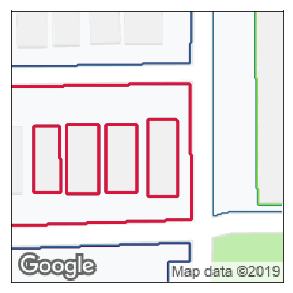

563
2879.25
8821
Elapsed time:  5.065422534942627


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


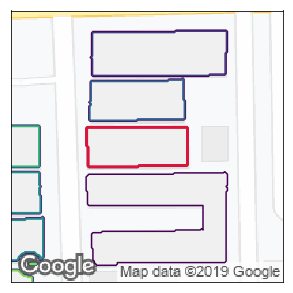

564
4279.25
2095
Elapsed time:  5.2143425941467285


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


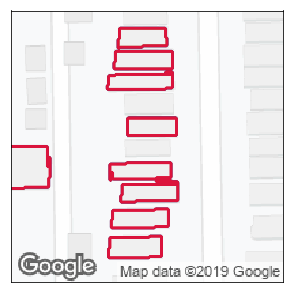

565
1111.0
34985
Elapsed time:  5.533442735671997


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


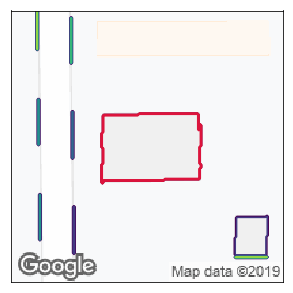

566
6779.625
3459
Elapsed time:  4.998879909515381


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


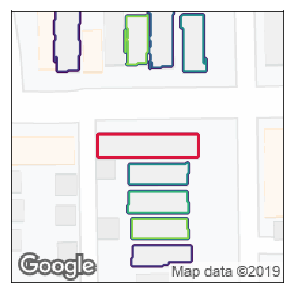

567
2826.5
1258
Elapsed time:  5.825963735580444


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


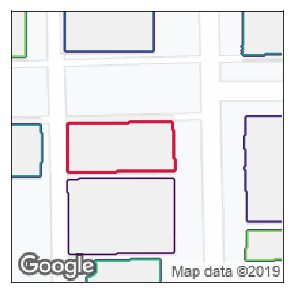

568
2821.55
2802
Elapsed time:  4.694927453994751


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


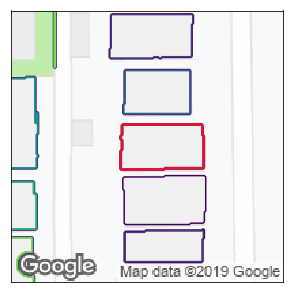

569
3812.25
1960
Elapsed time:  4.813432216644287


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


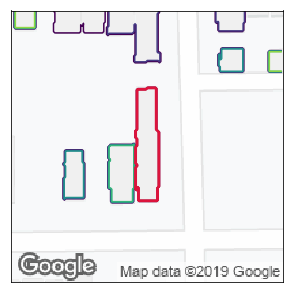

570
2904.5
1274
Elapsed time:  5.464406728744507


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


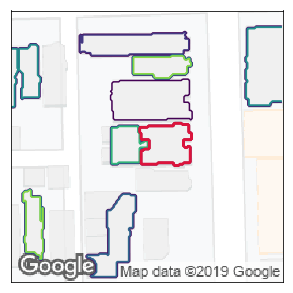

571
3803.5
940
Elapsed time:  4.920571327209473


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


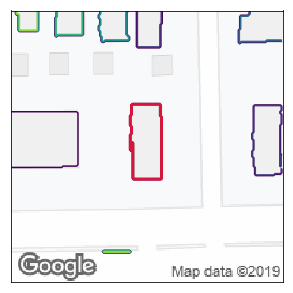

572
2537.5
1194
Elapsed time:  4.061612129211426


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


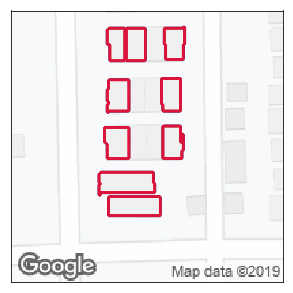

573
2712.75
36496
Elapsed time:  4.747056484222412


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


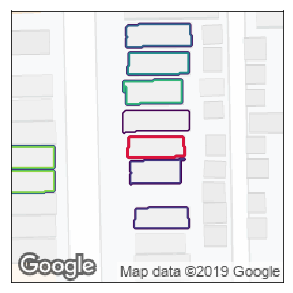

574
1328.25
608
Elapsed time:  4.462432146072388


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


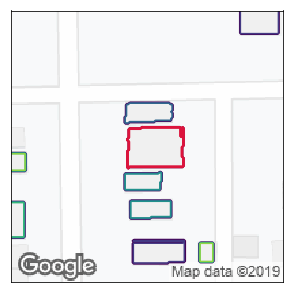

575
2782.0
1151
Elapsed time:  5.34960412979126


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


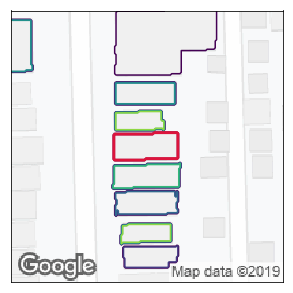

576
1607.5
887
Elapsed time:  5.044819116592407


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


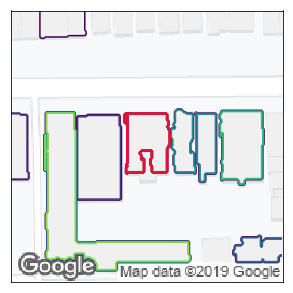

577
3034.875
1185
Elapsed time:  5.6037187576293945


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


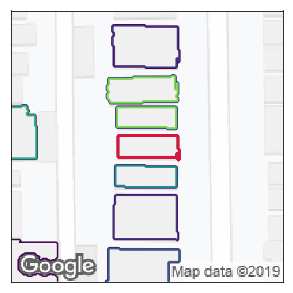

578
1583.125
709
Elapsed time:  4.992488861083984


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


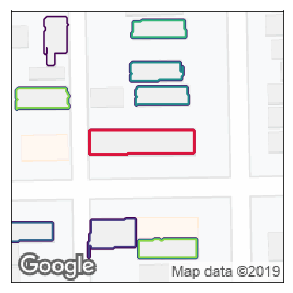

579
3232.25
1337
Elapsed time:  5.574071645736694


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


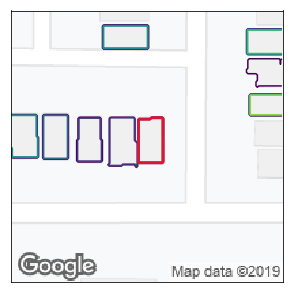

580
1545.0
585
Elapsed time:  4.93762469291687


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


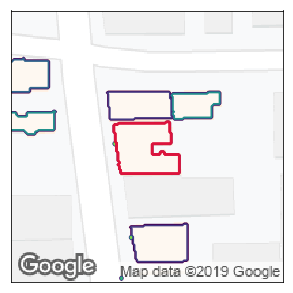

581
3134.125
1445
Elapsed time:  4.427055597305298


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


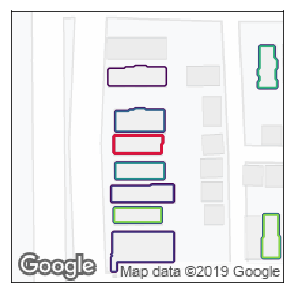

582
1272.125
461
Elapsed time:  5.31486701965332


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


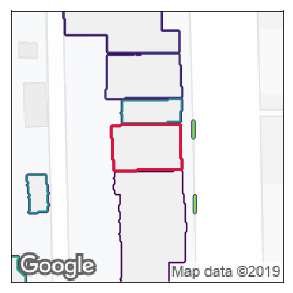

583
3703.25
1671
Elapsed time:  5.4428136348724365


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


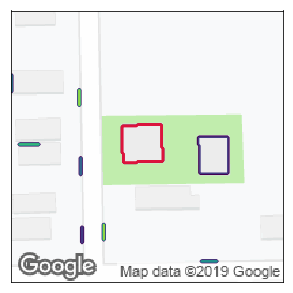

584
2067.25
786
Elapsed time:  4.135753393173218


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


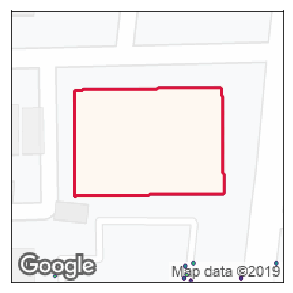

585
19996.625
8500
Elapsed time:  5.455243110656738


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


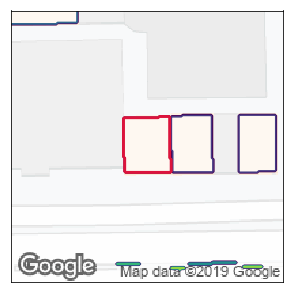

586
2990.60988861
1367
Elapsed time:  7.885547637939453


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


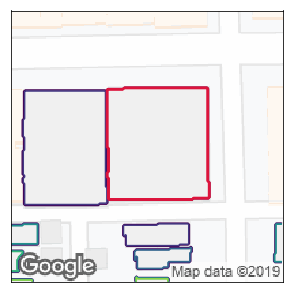

587
13242.7756641
6023
Elapsed time:  8.012616395950317


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


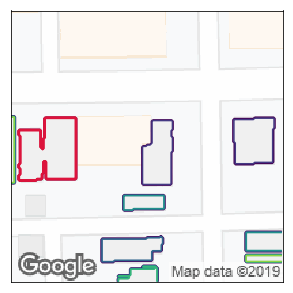

588
3964.295
1643
Elapsed time:  6.954358816146851


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


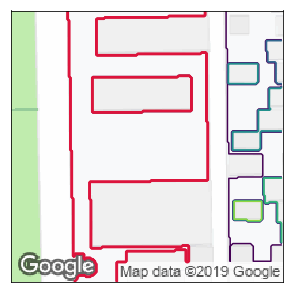

589
9764.8436525
9952
Elapsed time:  4.530025243759155


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


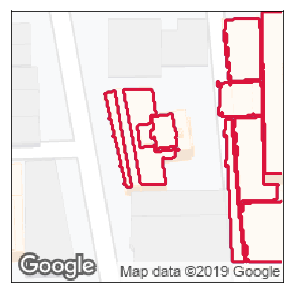

590
5642.125
31230
Elapsed time:  5.362802028656006


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


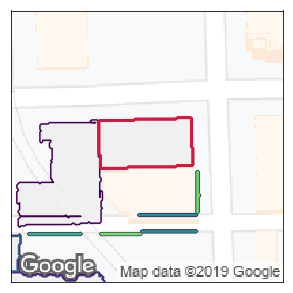

591
5105.98837486
2378
Elapsed time:  5.0648016929626465


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


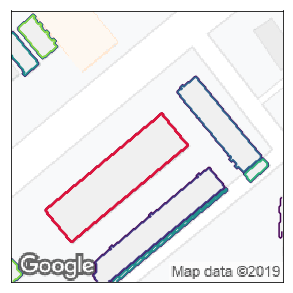

592
799.4227031710001
3371
Elapsed time:  4.306611061096191


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


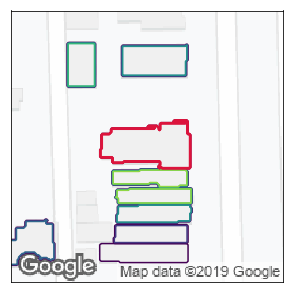

593
4045.875
1726
Elapsed time:  4.892723321914673


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


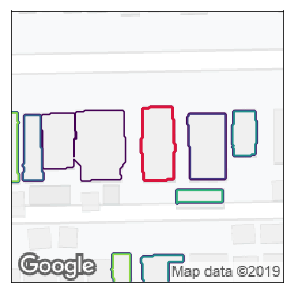

594
2801.0
1234
Elapsed time:  4.996535062789917


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


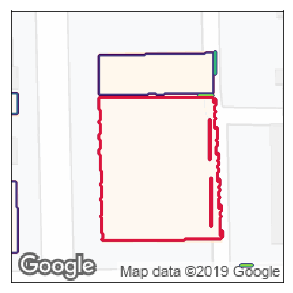

595
12373.0455389
8956
Elapsed time:  4.718830585479736


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


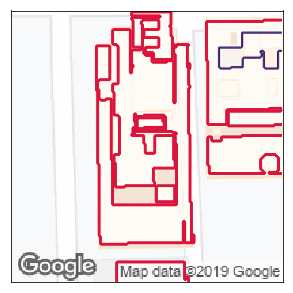

596
18698.5661215
24958
Elapsed time:  5.530142307281494


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


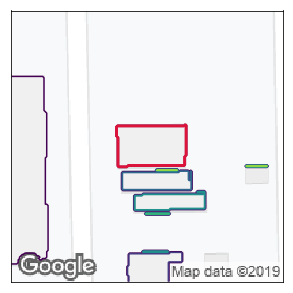

597
3359.0
1459
Elapsed time:  5.4234559535980225


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


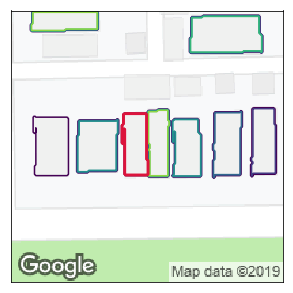

598
2883.375
756
Elapsed time:  4.4081504344940186


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


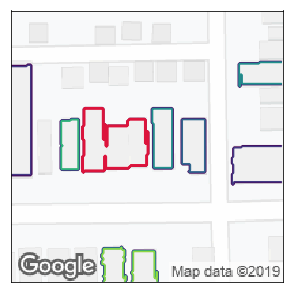

599
1168.375
1670
Elapsed time:  5.180306673049927


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


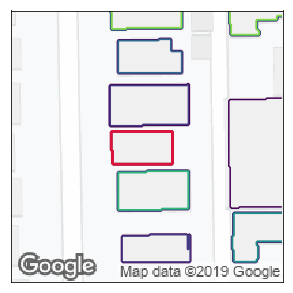

600
2825.75
1070
Elapsed time:  5.31787371635437


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


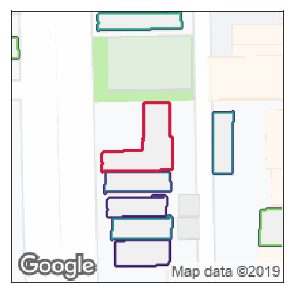

601
3075.125
1447
Elapsed time:  5.2326953411102295


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


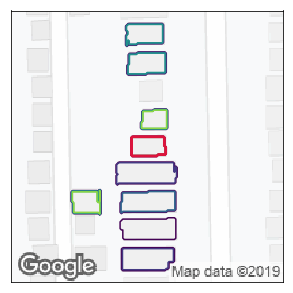

602
895.25
337
Elapsed time:  4.611062049865723


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


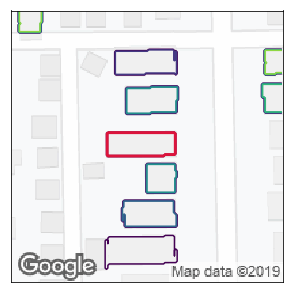

603
1634.5
842
Elapsed time:  5.86740517616272


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


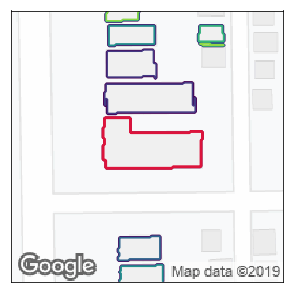

604
4263.0
2061
Elapsed time:  5.997900485992432


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


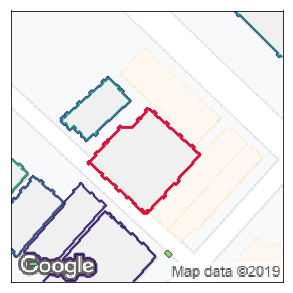

605
5311.875
3233
Elapsed time:  4.547760248184204


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


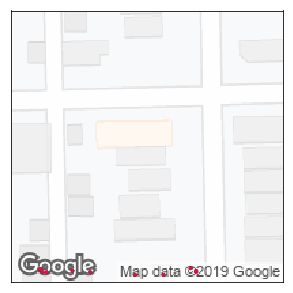

606
3404.875
39989
Elapsed time:  5.057517766952515


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


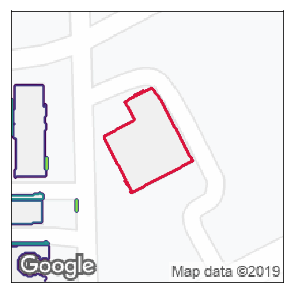

607
6223.0
2655
Elapsed time:  5.488219738006592


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


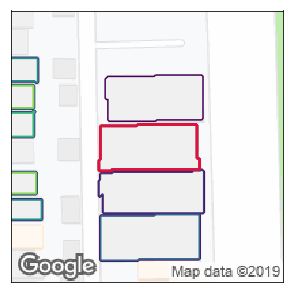

608
5354.9
2348
Elapsed time:  6.767516613006592


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


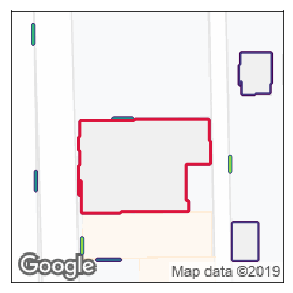

609
7007.0
5896
Elapsed time:  5.707869291305542


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


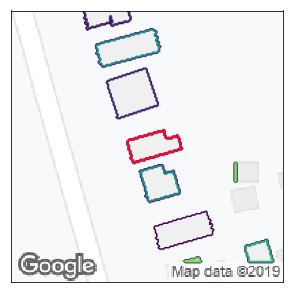

610
1208.875
557
Elapsed time:  5.336550951004028


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


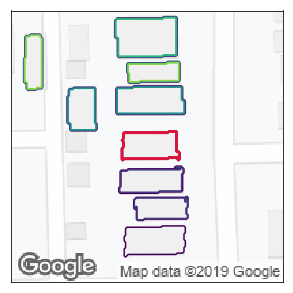

611
1687.375
761
Elapsed time:  6.262732028961182


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


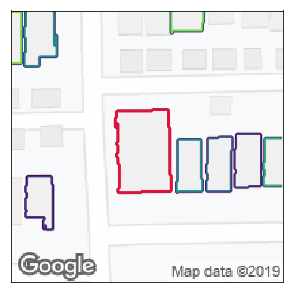

612
5087.125
2274
Elapsed time:  5.177676200866699


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


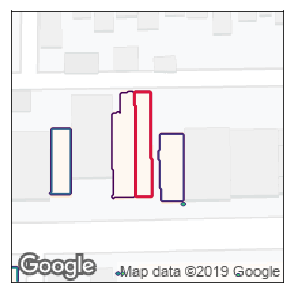

613
2655.875
885
Elapsed time:  5.830018043518066


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


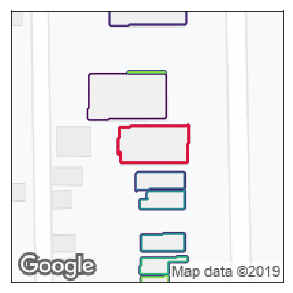

614
2999.855
1360
Elapsed time:  5.729993581771851


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


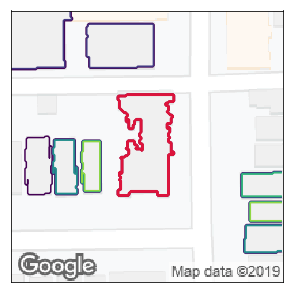

615
5019.875
2267
Elapsed time:  4.044684410095215


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


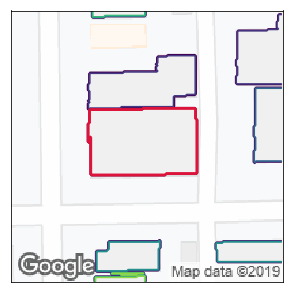

616
6257.6
3787
Elapsed time:  5.16405987739563


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


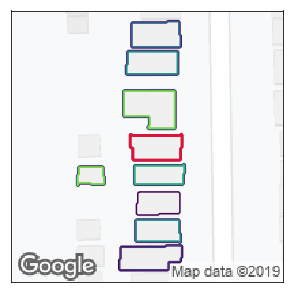

617
1213.75
659
Elapsed time:  5.540875673294067


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


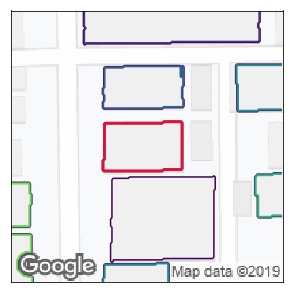

618
3893.5
2003
Elapsed time:  4.154807806015015


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


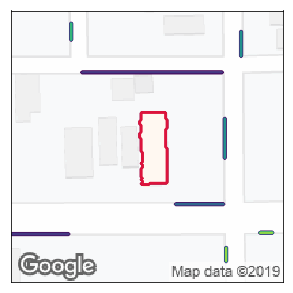

619
1727.25
968
Elapsed time:  4.814579248428345


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


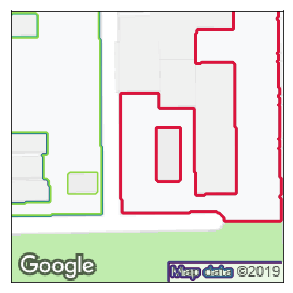

620
6004.44
9943
Elapsed time:  5.7868735790252686


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


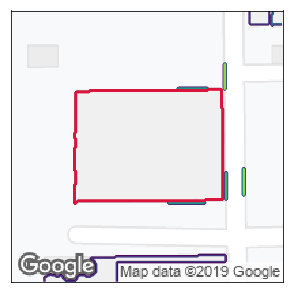

621
19287.875
8758
Elapsed time:  4.993358135223389


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


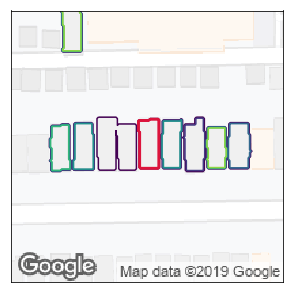

622
1129.25
505
Elapsed time:  7.2314159870147705


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


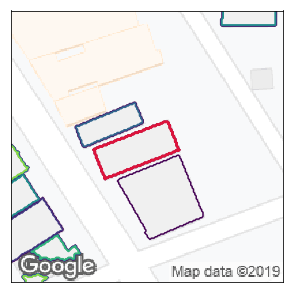

623
3764.25
1338
Elapsed time:  7.190713405609131


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


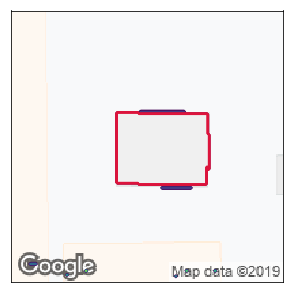

624
7685.0
3497
Elapsed time:  5.25118350982666


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


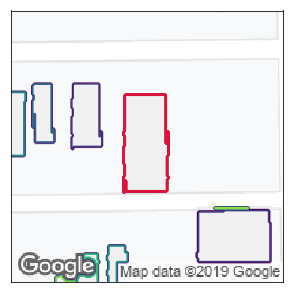

625
4471.125
2205
Elapsed time:  5.4677894115448


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


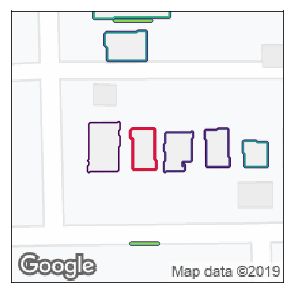

626
909.0
500
Elapsed time:  4.701036214828491


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


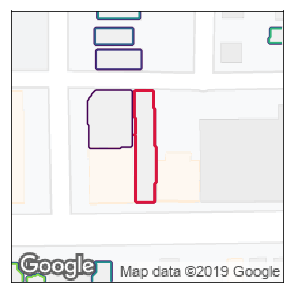

627
2670.5
1183
Elapsed time:  5.614089727401733


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


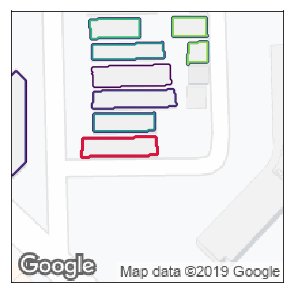

628
3361.625
729
Elapsed time:  5.881098031997681


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


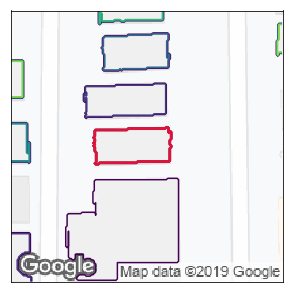

629
4313.125
1332
Elapsed time:  6.3228209018707275


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


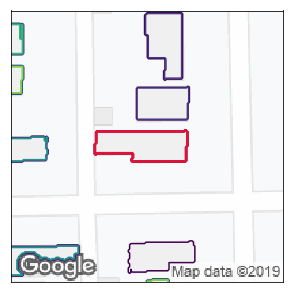

630
2988.0
1312
Elapsed time:  5.067854881286621


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


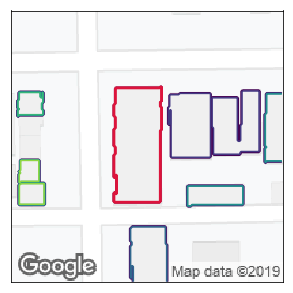

631
5465.0
2832
Elapsed time:  5.101752281188965


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


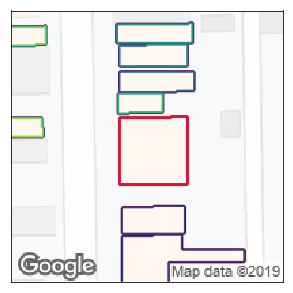

632
5057.75
2462
Elapsed time:  5.605697154998779


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


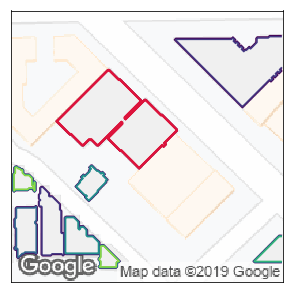

633
3251.065
3034
Elapsed time:  5.025517463684082


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


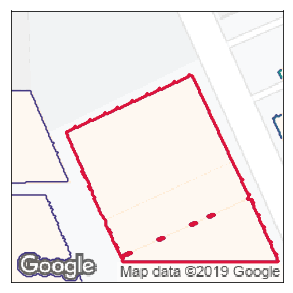

634
14817.08
13214
Elapsed time:  5.3958821296691895


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


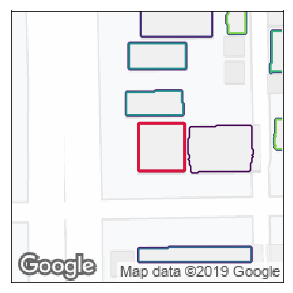

635
2684.5
1190
Elapsed time:  4.599817276000977


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


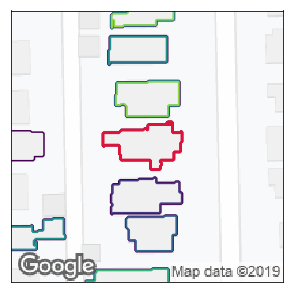

636
2815.25
1190
Elapsed time:  5.966166257858276


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


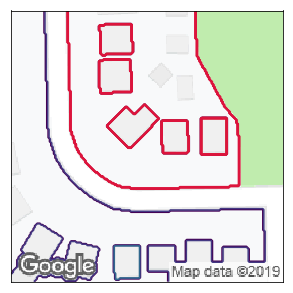

637
367.125
11089
Elapsed time:  4.542951822280884


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


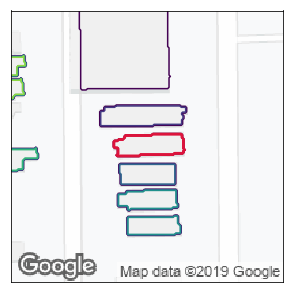

638
1504.75
704
Elapsed time:  5.0781474113464355


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


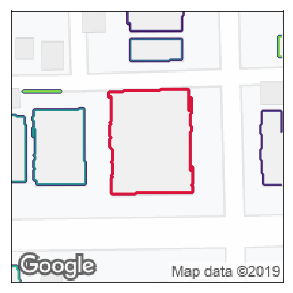

639
9200.875
4420
Elapsed time:  5.15798544883728


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


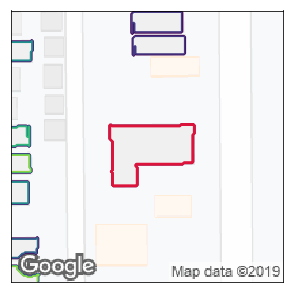

640
3876.25
1970
Elapsed time:  6.0743567943573


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


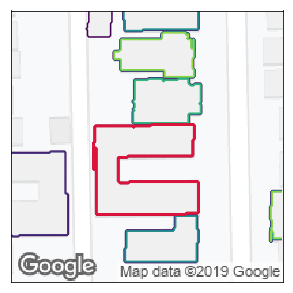

641
7712.25
3734
Elapsed time:  4.049181938171387


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


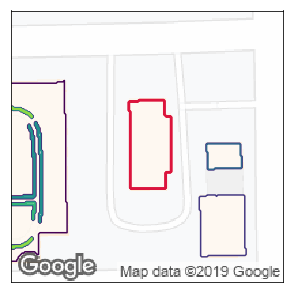

642
5697.25
1844
Elapsed time:  4.2763893604278564


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


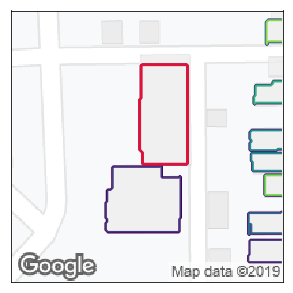

643
14112.625
2511
Elapsed time:  5.221234083175659


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


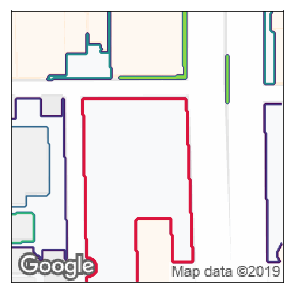

644
8926.19
8866
Elapsed time:  4.892250061035156


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


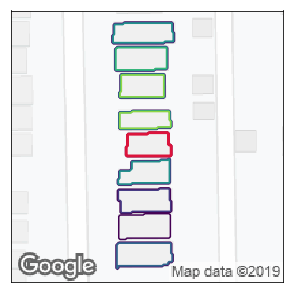

645
1441.0
518
Elapsed time:  6.3060102462768555


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


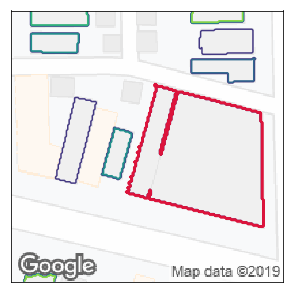

646
3074.73926331
7367
Elapsed time:  7.209835529327393


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


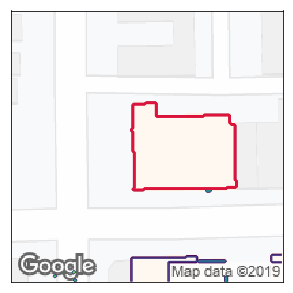

647
2698.375
4114
Elapsed time:  5.341681480407715


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


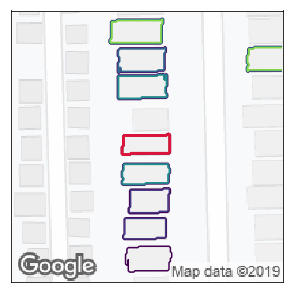

648
1040.625
455
Elapsed time:  5.899528980255127


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


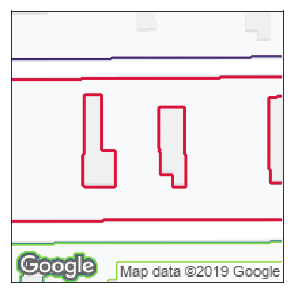

649
3545.25
18024
Elapsed time:  4.749683141708374


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


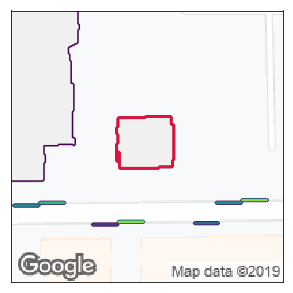

650
2875.25
1516
Elapsed time:  6.179468870162964


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


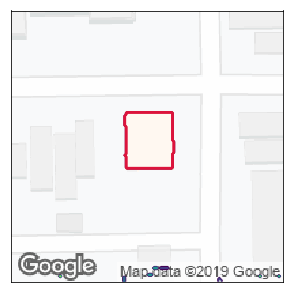

651
3532.125
1412
Elapsed time:  5.834681034088135


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


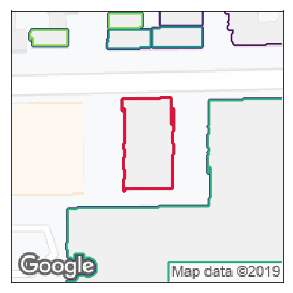

652
4813.375
2362
Elapsed time:  5.441173076629639


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


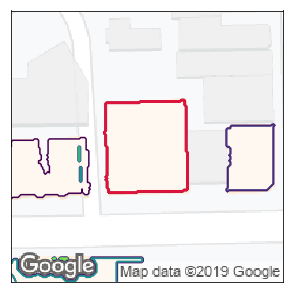

653
8611.875
3885
Elapsed time:  5.6814796924591064


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


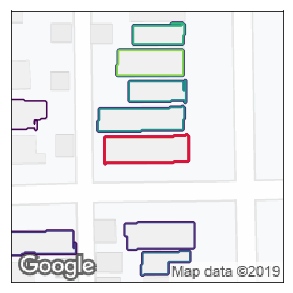

654
2575.75
1180
Elapsed time:  6.126448631286621


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


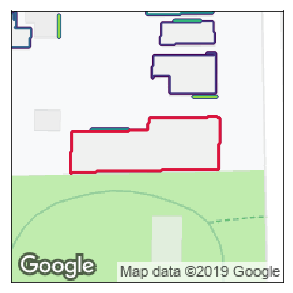

655
7500.5
3680
Elapsed time:  5.450241565704346


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


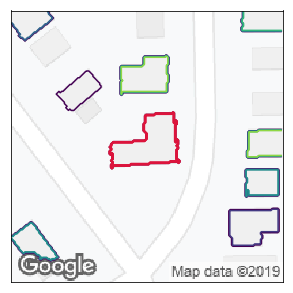

656
2600.875
1226
Elapsed time:  5.757853031158447


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


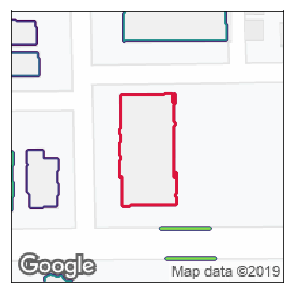

657
7145.5
3224
Elapsed time:  6.395207166671753


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


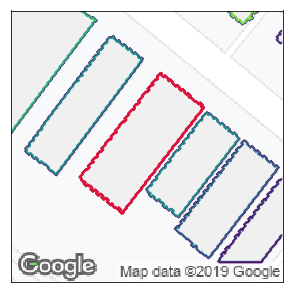

658
5787.0
3954
Elapsed time:  4.7512147426605225


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


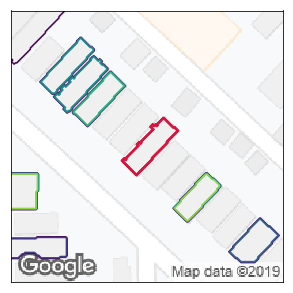

659
1226.75
630
Elapsed time:  5.68402624130249


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


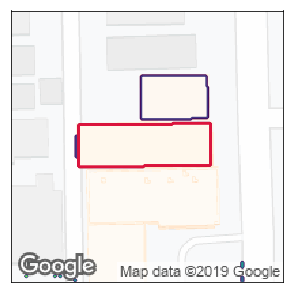

660
5932.0
2986
Elapsed time:  6.025768518447876


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


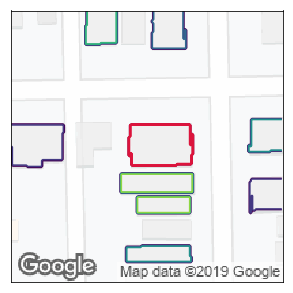

661
2985.025
1344
Elapsed time:  5.428905248641968


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


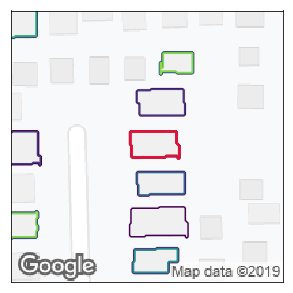

662
1445.625
648
Elapsed time:  6.163638353347778


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


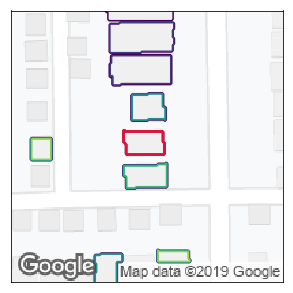

663
1061.125
486
Elapsed time:  4.535339593887329


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


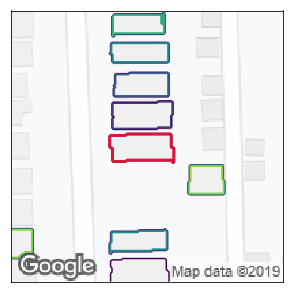

664
1668.5
855
Elapsed time:  4.257003307342529


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


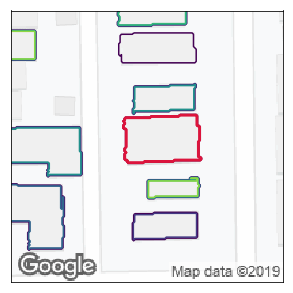

665
4835.375
1765
Elapsed time:  5.393775463104248


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


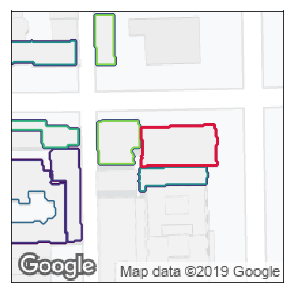

666
5293.5
1580
Elapsed time:  4.303642749786377


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


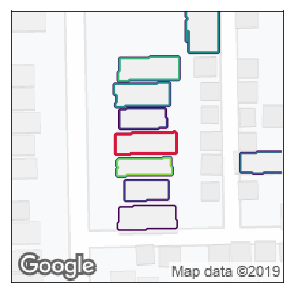

667
1346.125
675
Elapsed time:  4.658395290374756


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


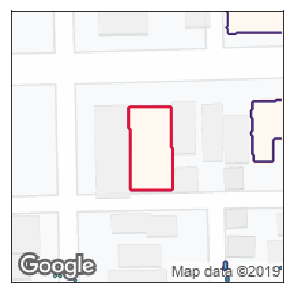

668
4527.125
1877
Elapsed time:  5.912074327468872


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


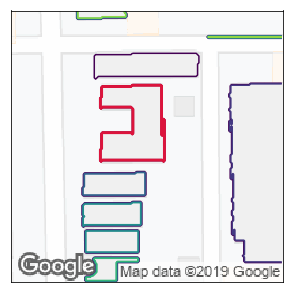

669
4663.25
2027
Elapsed time:  4.920947313308716


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


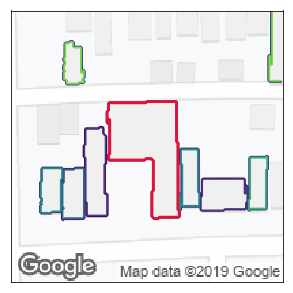

670
6136.5
2897
Elapsed time:  5.4253270626068115


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


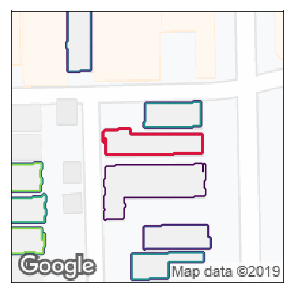

671
2662.25
1121
Elapsed time:  6.139498233795166


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


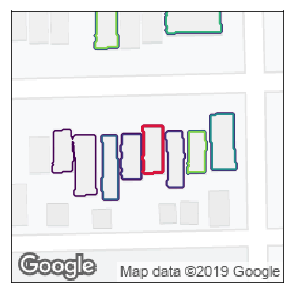

672
1040.75
491
Elapsed time:  6.278244256973267


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


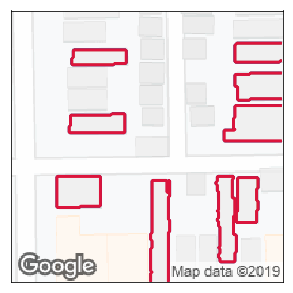

673
893.25
34060
Elapsed time:  7.018953800201416


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


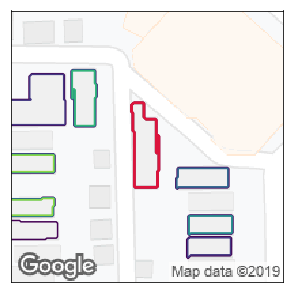

674
3536.25
963
Elapsed time:  4.880427360534668


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


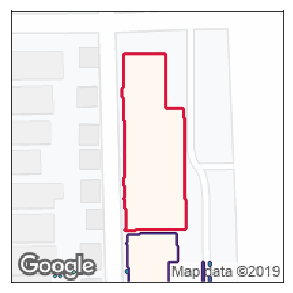

675
11691.875
5187
Elapsed time:  6.597994565963745


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


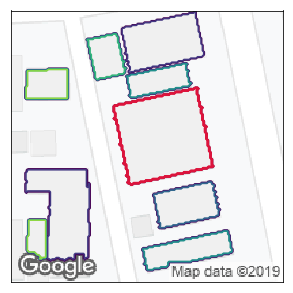

676
5459.0
3683
Elapsed time:  5.376236438751221


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


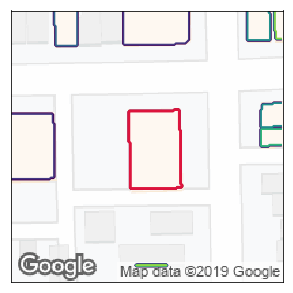

677
4811.25
2121
Elapsed time:  5.198498249053955


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


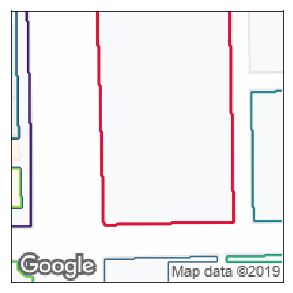

678
6903.375
15091
Elapsed time:  5.763267993927002


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


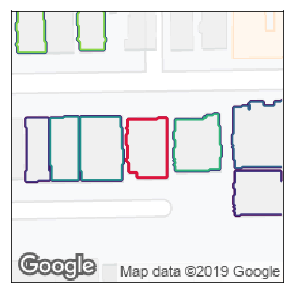

679
2934.225
1230
Elapsed time:  5.397572994232178


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


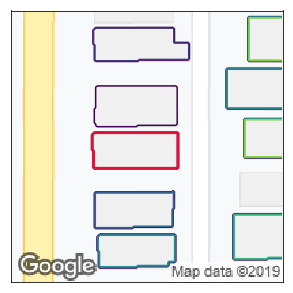

680
7093.375
1624
Elapsed time:  4.713757276535034


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


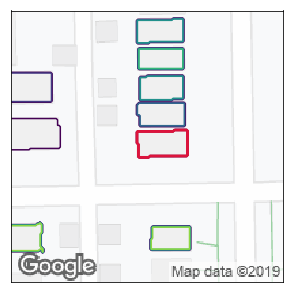

681
2620.375
675
Elapsed time:  6.337926387786865


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


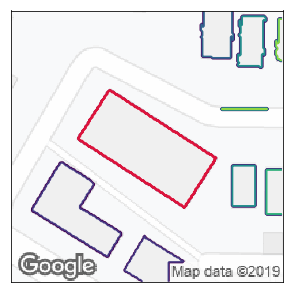

682
5961.375
3987
Elapsed time:  6.108643531799316


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


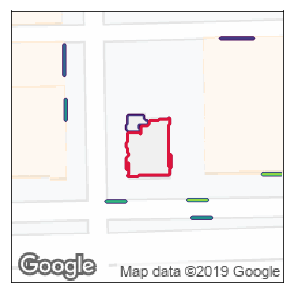

683
2909.75
1124
Elapsed time:  4.76223611831665


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


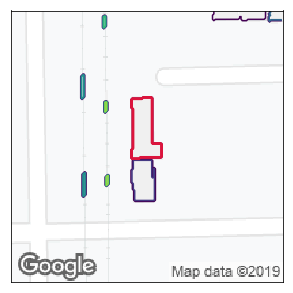

684
2707.5
698
Elapsed time:  4.6289873123168945


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


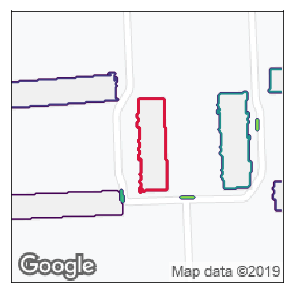

685
3064.5
1295
Elapsed time:  5.693097829818726


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


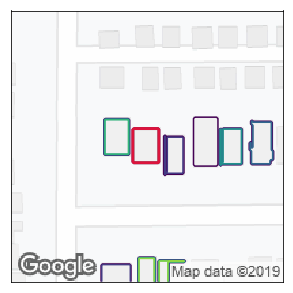

686
1093.0
475
Elapsed time:  5.567493438720703


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


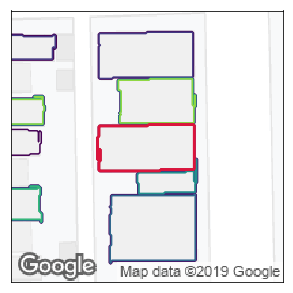

687
4708.5
2327
Elapsed time:  5.1956517696380615


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


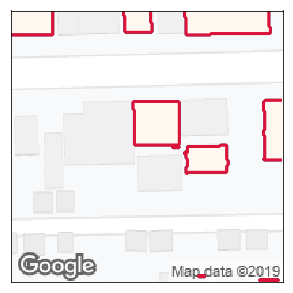

688
4718.875
35821
Elapsed time:  7.571011304855347


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


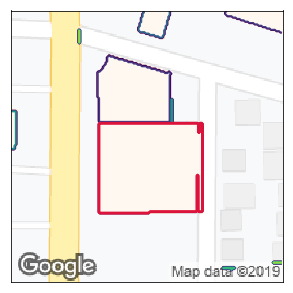

689
15829.0
4943
Elapsed time:  5.235234975814819


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


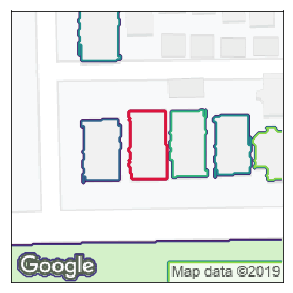

690
2991.25
1334
Elapsed time:  4.717500686645508


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


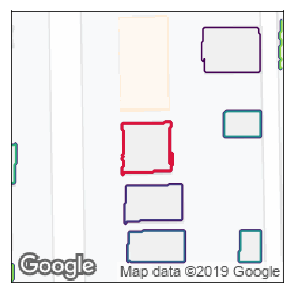

691
2757.5
1248
Elapsed time:  4.4550981521606445


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


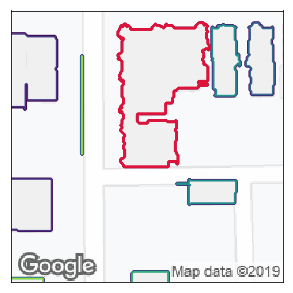

692
2500.875
4801
Elapsed time:  5.229353189468384


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


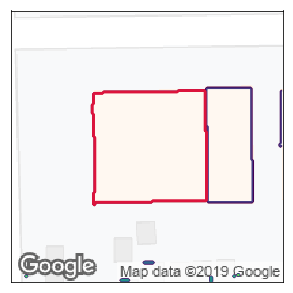

693
14982.3
6635
Elapsed time:  7.17043924331665


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


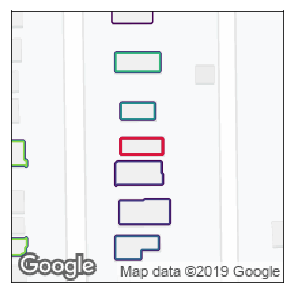

694
1320.5
372
Elapsed time:  7.502035617828369


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


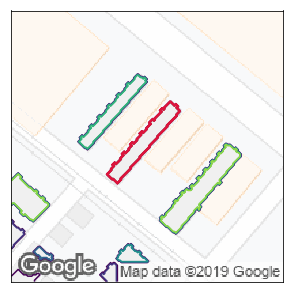

695
2947.32
728
Elapsed time:  6.0042126178741455


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


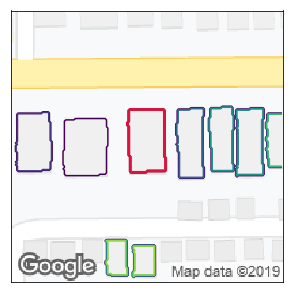

696
3066.75
1184
Elapsed time:  4.977048873901367


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


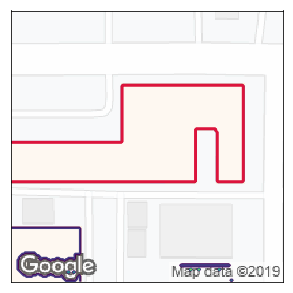

697
16139.125
8075
Elapsed time:  4.826997756958008


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


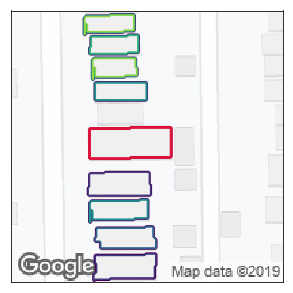

698
3740.0
1320
Elapsed time:  4.694032669067383


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


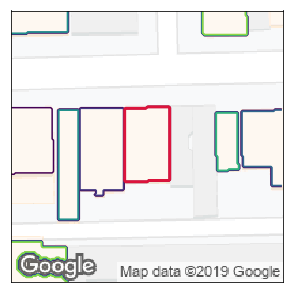

699
3767.0
1783
Elapsed time:  4.6769163608551025


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


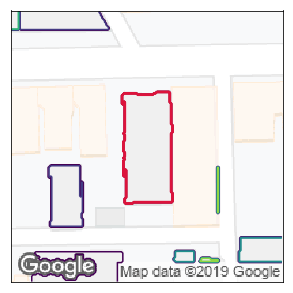

700
5496.91850479
2744
Elapsed time:  5.269328832626343


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


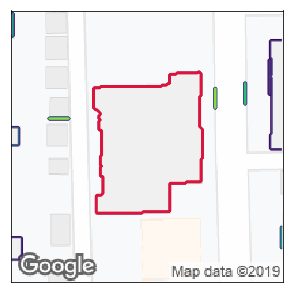

701
16864.01
6662
Elapsed time:  4.709200382232666


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


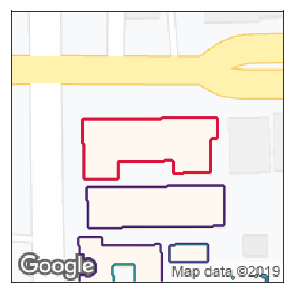

702
9019.0
3555
Elapsed time:  5.894148111343384


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


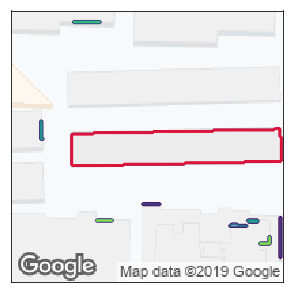

703
679.218361359
3609
Elapsed time:  5.852736473083496


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


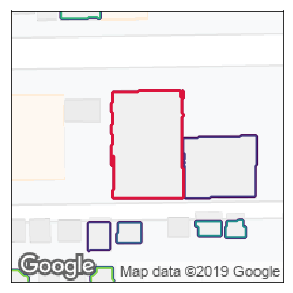

704
9595.89931641
4039
Elapsed time:  4.882752895355225


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


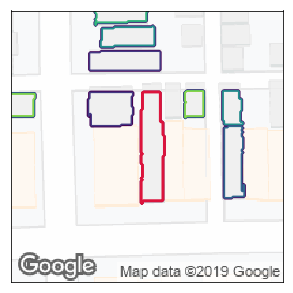

705
2557.3553890999997
1228
Elapsed time:  4.9088969230651855


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


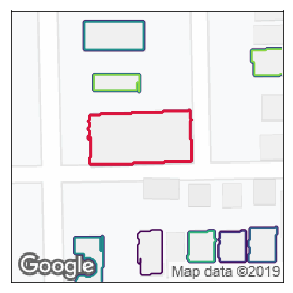

706
3621.25
2741
Elapsed time:  4.803989410400391


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


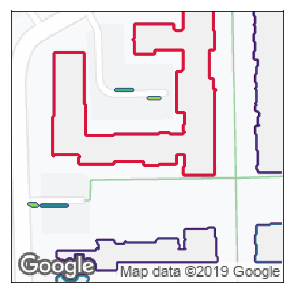

707
14966.625
6759
Elapsed time:  4.8753767013549805


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


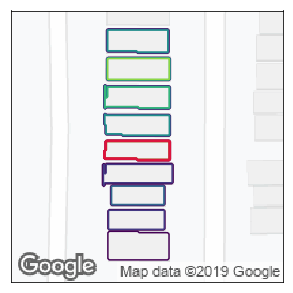

708
1307.25
641
Elapsed time:  5.7512476444244385


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


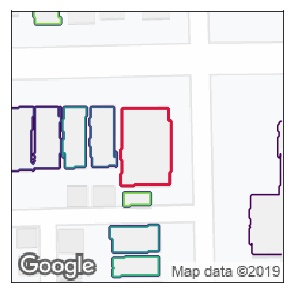

709
3864.75
2015
Elapsed time:  5.649250268936157


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


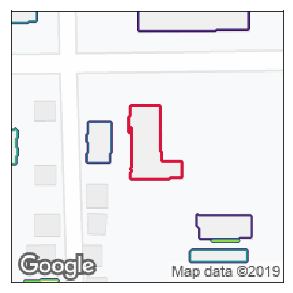

710
3674.25
1374
Elapsed time:  5.161274194717407


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


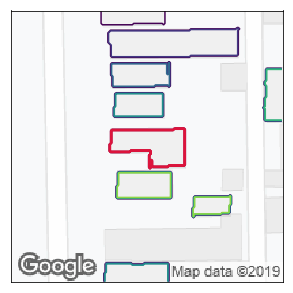

711
2547.5
1131
Elapsed time:  5.8184144496917725


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


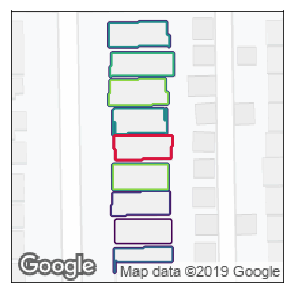

712
1508.25
735
Elapsed time:  5.210482597351074


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


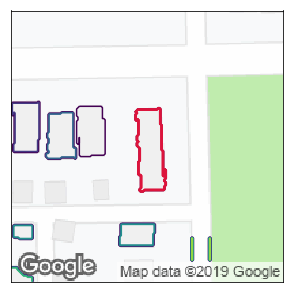

713
2252.625
1035
Elapsed time:  5.533756732940674


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


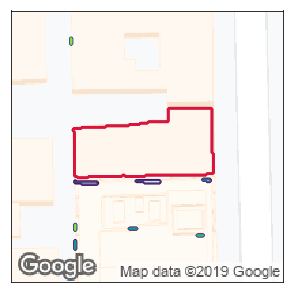

714
10204.375
4160
Elapsed time:  7.132125616073608


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


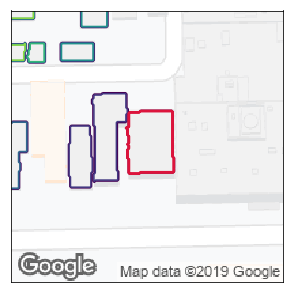

715
2578.5
1466
Elapsed time:  6.442865610122681


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


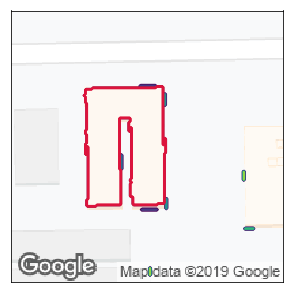

716
9828.0
4327
Elapsed time:  5.112292051315308


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


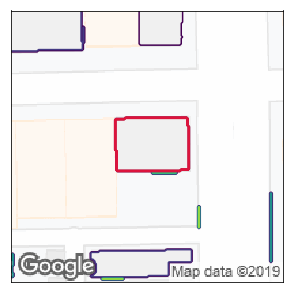

717
5079.95
2072
Elapsed time:  4.746514797210693


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


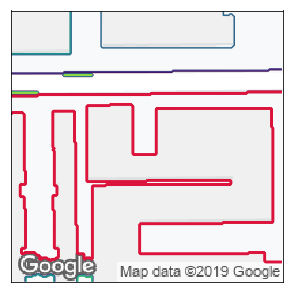

718
7618.28
9430
Elapsed time:  3.9265284538269043


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


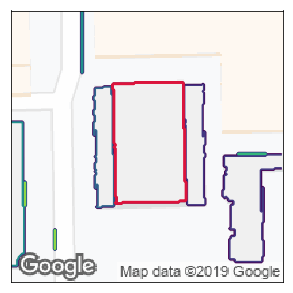

719
14791.5
4500
Elapsed time:  4.806200742721558


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


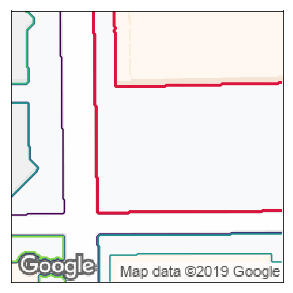

720
6934.0
13578
Elapsed time:  4.477727890014648


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


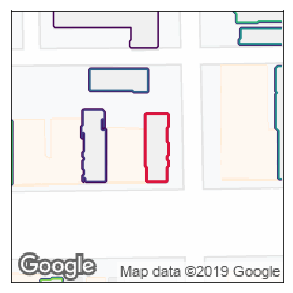

721
1858.0
814
Elapsed time:  4.442738056182861


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


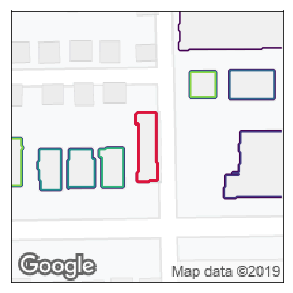

722
1668.0
694
Elapsed time:  5.4891357421875


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


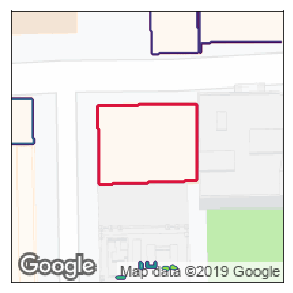

723
8553.3
4129
Elapsed time:  5.536384105682373


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


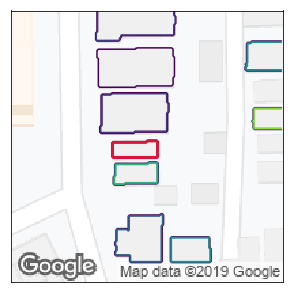

724
1471.625
371
Elapsed time:  4.842397212982178


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


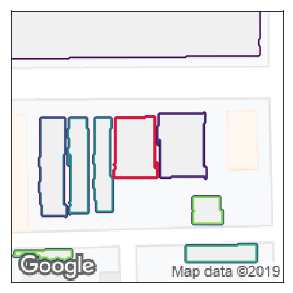

725
6527.075
1308
Elapsed time:  5.671856641769409


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


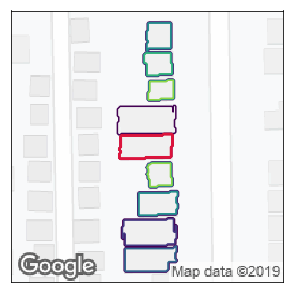

726
1431.0
631
Elapsed time:  4.162890195846558


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


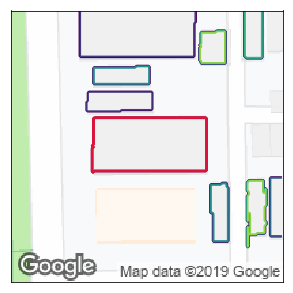

727
7267.625
3256
Elapsed time:  4.215982913970947


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


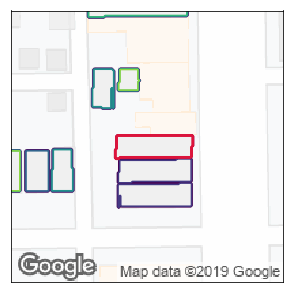

728
2026.255
897
Elapsed time:  4.482010364532471


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


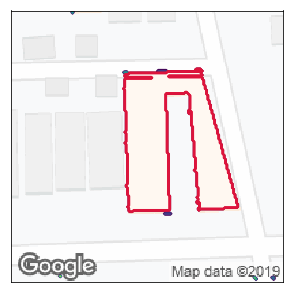

729
11422.875
5207
Elapsed time:  5.083162069320679


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


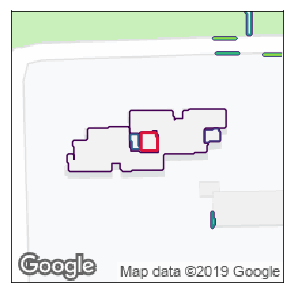

730
8144.25
153
Elapsed time:  5.282942295074463


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


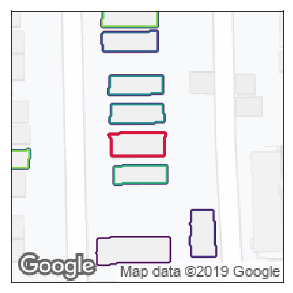

731
1258.0
664
Elapsed time:  5.434895753860474


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


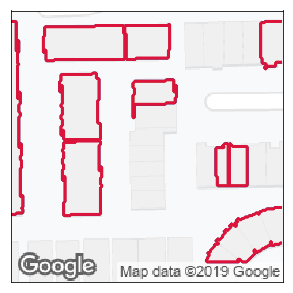

732
6145.375
31122
Elapsed time:  5.619581460952759


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


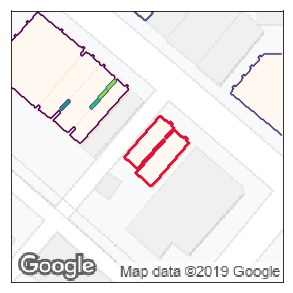

733
1373.375
1156
Elapsed time:  5.010475158691406


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


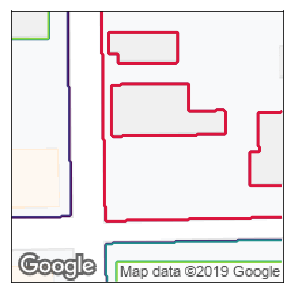

734
1372.5
15335
Elapsed time:  4.826719045639038


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


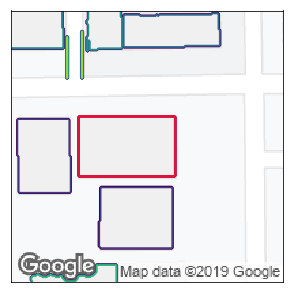

735
6874.75
3124
Elapsed time:  4.385438919067383


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


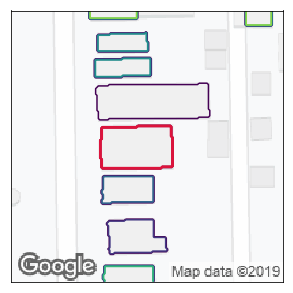

736
3435.625
1584
Elapsed time:  4.47167444229126


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


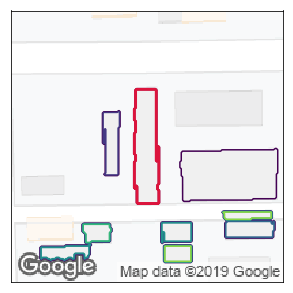

737
2973.875
1361
Elapsed time:  7.02215838432312


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


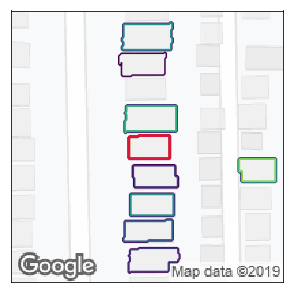

738
1196.125
503
Elapsed time:  6.367971658706665


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


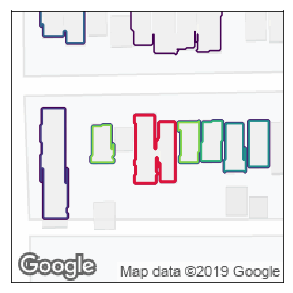

739
1410.0
1290
Elapsed time:  4.483502388000488


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


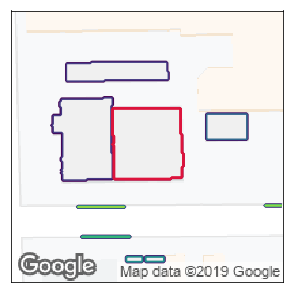

740
5954.0
2604
Elapsed time:  4.7235658168792725


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


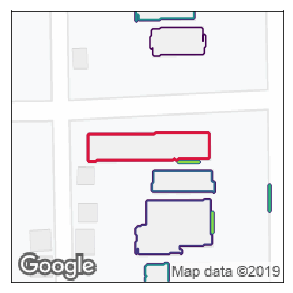

741
3255.625
1713
Elapsed time:  5.752633571624756


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


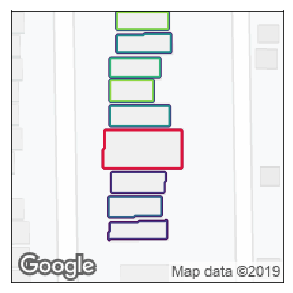

742
3600.875
1610
Elapsed time:  4.58178973197937


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


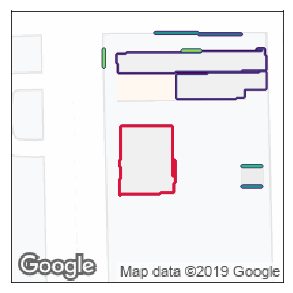

743
3167.0
1937
Elapsed time:  5.016982316970825


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


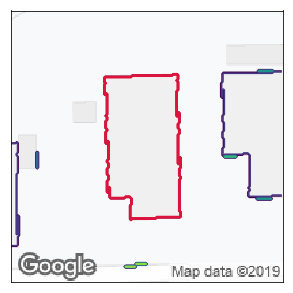

744
10893.375
5218
Elapsed time:  4.930994749069214


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


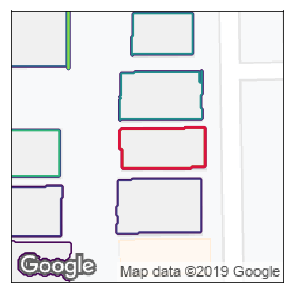

745
4875.0
1803
Elapsed time:  5.371605396270752


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


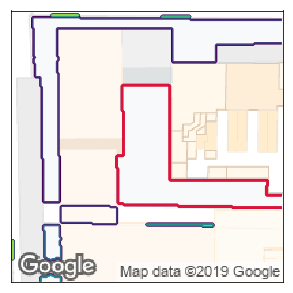

746
9606.5
4640
Elapsed time:  5.36897349357605


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


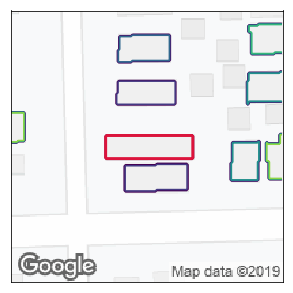

747
2654.75
1088
Elapsed time:  5.563991069793701


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


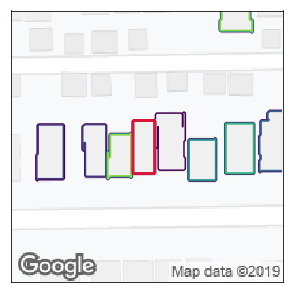

748
1443.5
624
Elapsed time:  4.351356744766235


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


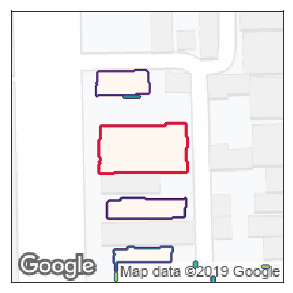

749
5308.5
2219
Elapsed time:  5.707084894180298


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


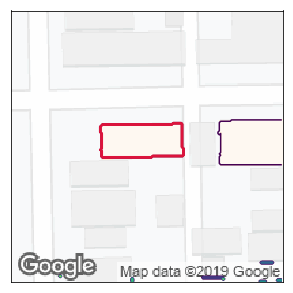

750
3642.25
1413
Elapsed time:  5.834858655929565


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


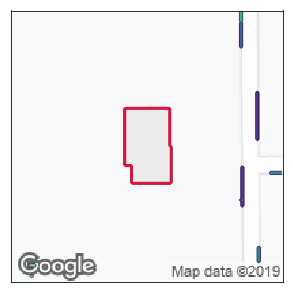

751
4468.25
1777
Elapsed time:  5.53040075302124


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


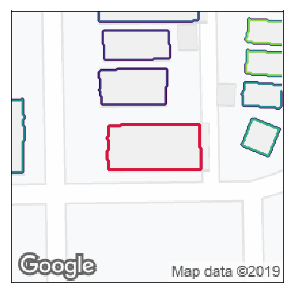

752
4624.25
2227
Elapsed time:  4.9853973388671875


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


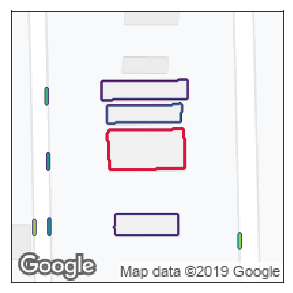

753
3331.5
1604
Elapsed time:  4.876208305358887


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


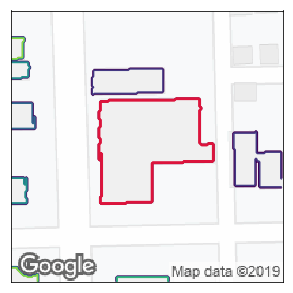

754
9210.125
4600
Elapsed time:  4.779553651809692


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


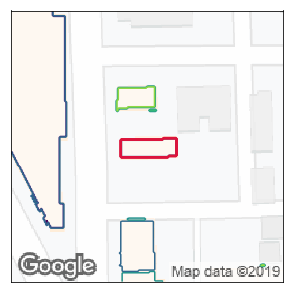

755
1305.875
537
Elapsed time:  4.996264934539795


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


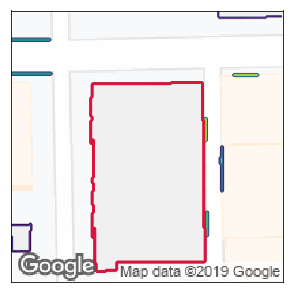

756
16372.875
10809
Elapsed time:  4.276223182678223


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


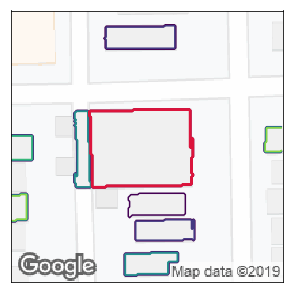

757
5887.25
4085
Elapsed time:  4.492396593093872


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


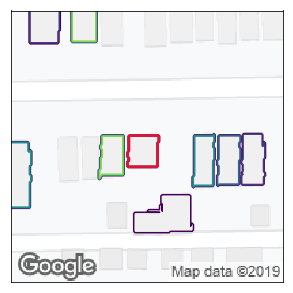

758
1275.5
496
Elapsed time:  4.058020353317261


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


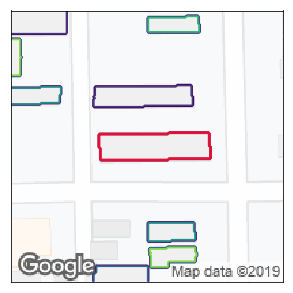

759
3044.875
1539
Elapsed time:  6.246512413024902


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


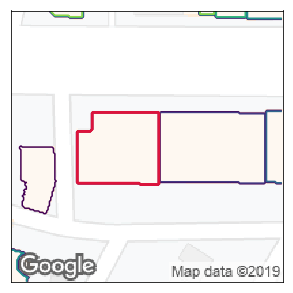

760
2698.24767639
2981
Elapsed time:  5.058335065841675


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


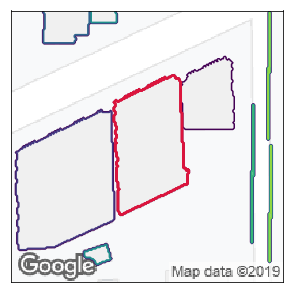

761
9735.50911804
4096
Elapsed time:  3.998386859893799


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


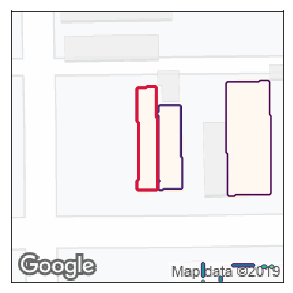

762
2627.93535278
1067
Elapsed time:  5.402102470397949


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


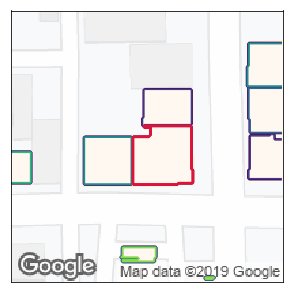

763
8549.125
1751
Elapsed time:  5.0133771896362305


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


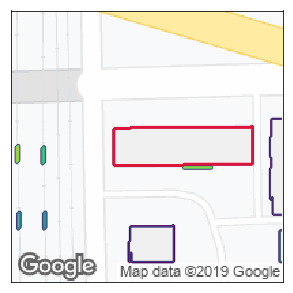

764
783.182470703
2794
Elapsed time:  4.824894666671753


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


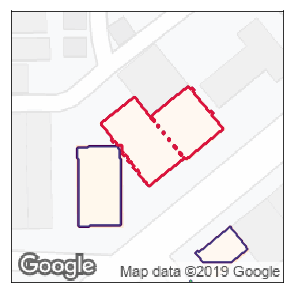

765
4160.7
3310
Elapsed time:  5.333692789077759


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


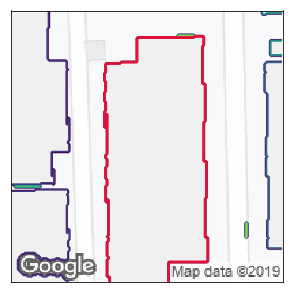

766
9474.16583282
12174
Elapsed time:  4.729391098022461


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


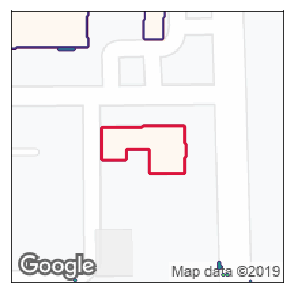

767
3940.875
1629
Elapsed time:  4.6451826095581055


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


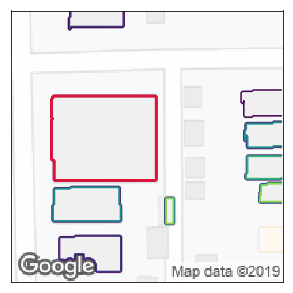

768
3277.91220978
4741
Elapsed time:  5.754238605499268


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


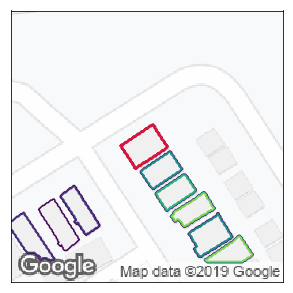

769
1171.32893257
559
Elapsed time:  4.24015998840332


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


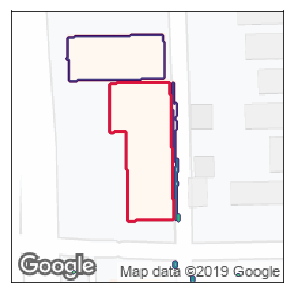

770
8982.0
3791
Elapsed time:  4.926628589630127


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


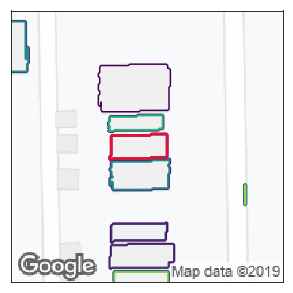

771
2695.25
700
Elapsed time:  5.270766019821167


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


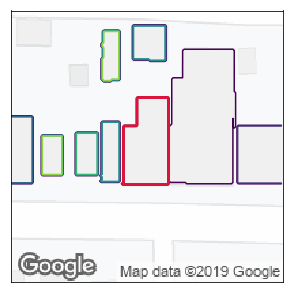

772
4039.6
1903
Elapsed time:  4.524344205856323


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


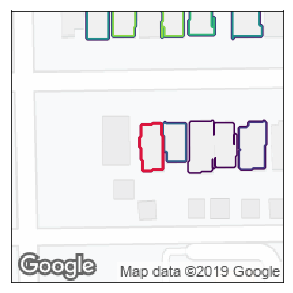

773
1106.25
535
Elapsed time:  4.134041786193848


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


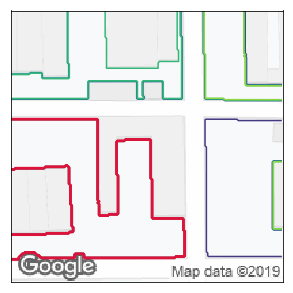

774
9558.625
7626
Elapsed time:  5.7428507804870605


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


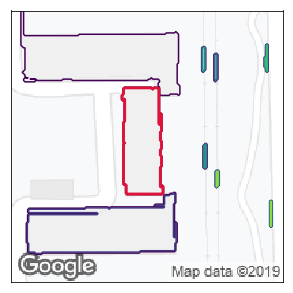

775
4012.5
2088
Elapsed time:  4.6144959926605225


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


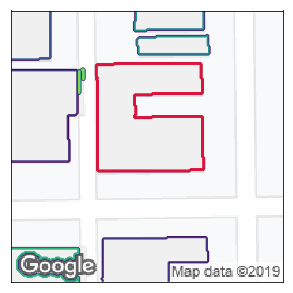

776
10373.375
5227
Elapsed time:  5.16191029548645


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


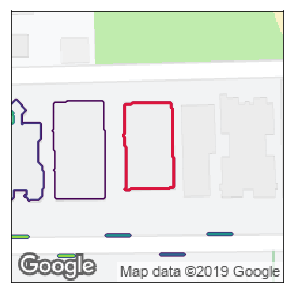

777
5159.375
2191
Elapsed time:  4.367065668106079


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


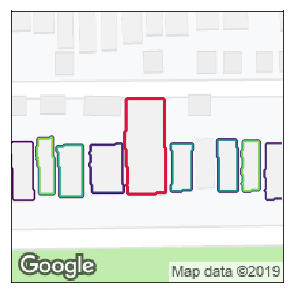

778
4164.0
1981
Elapsed time:  5.337215185165405


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


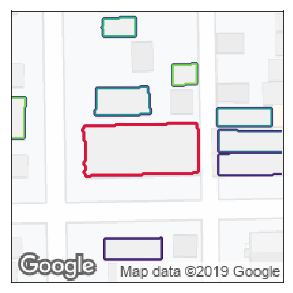

779
7384.25
3045
Elapsed time:  4.285902976989746


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


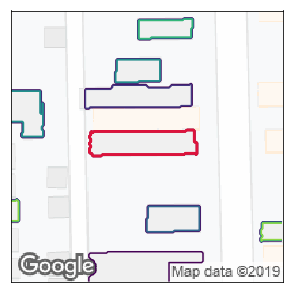

780
2727.25
1321
Elapsed time:  4.882312297821045


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


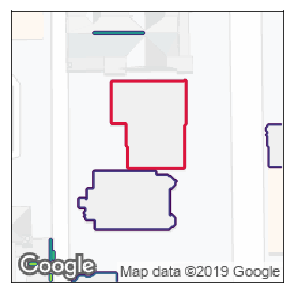

781
3106.625
3110
Elapsed time:  6.067844390869141


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


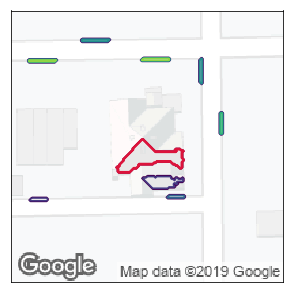

782
7193.0
532
Elapsed time:  4.738632678985596


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


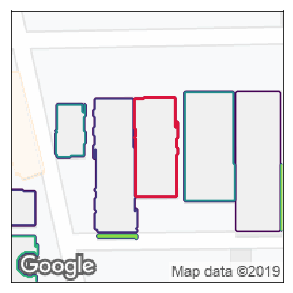

783
3566.125
2202
Elapsed time:  6.537228107452393


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


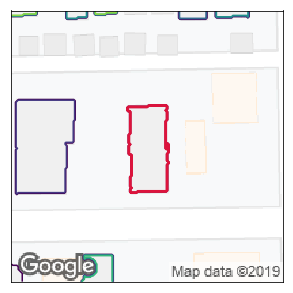

784
3629.0
1683
Elapsed time:  5.3850417137146


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


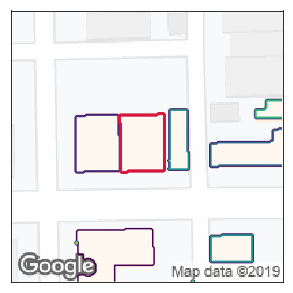

785
3064.75
1328
Elapsed time:  6.1604108810424805


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


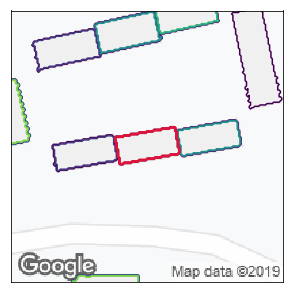

786
5919.5
882
Elapsed time:  5.796295881271362


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


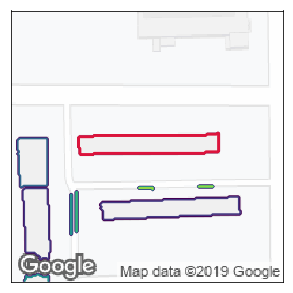

787
2941.0
1334
Elapsed time:  6.669928312301636


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


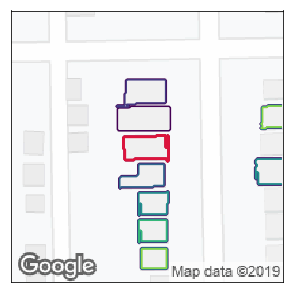

788
1127.375
530
Elapsed time:  4.99618935585022


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


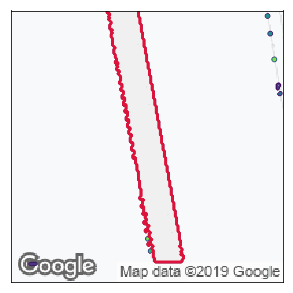

789
18637.625
4115
Elapsed time:  5.035000801086426


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


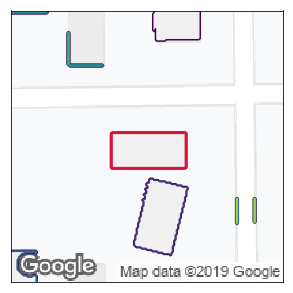

790
3154.625
1430
Elapsed time:  4.943596601486206


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


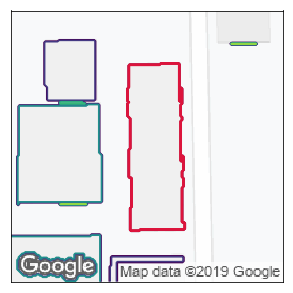

791
9785.83
4622
Elapsed time:  3.995237350463867


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


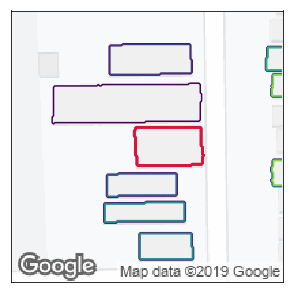

792
3150.375
1349
Elapsed time:  5.681601285934448


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


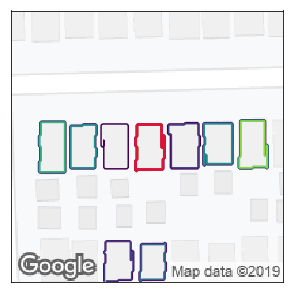

793
1383.125
642
Elapsed time:  5.355684041976929


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


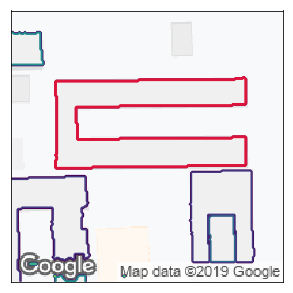

794
13194.875
5858
Elapsed time:  5.128268003463745


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


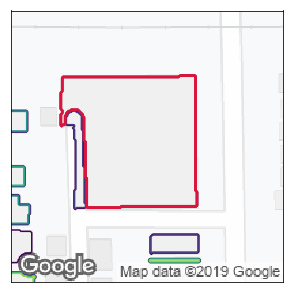

795
17068.0
8216
Elapsed time:  6.921412944793701


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


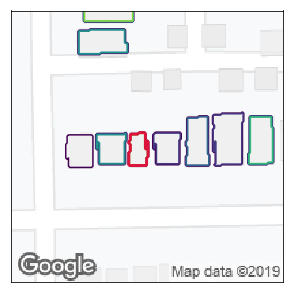

796
850.0
294
Elapsed time:  4.962174654006958


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


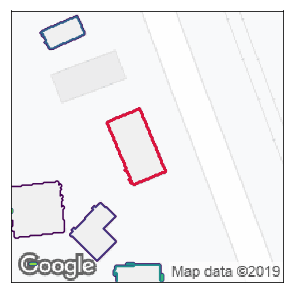

797
2888.745
1298
Elapsed time:  4.937744379043579


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


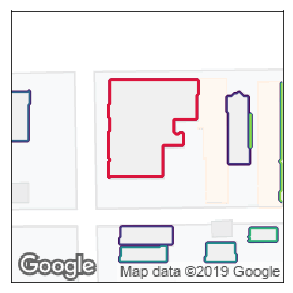

798
7866.845
3759
Elapsed time:  5.9858009815216064


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


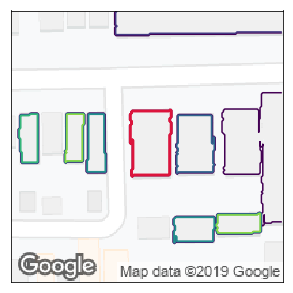

799
2696.545
1329
Elapsed time:  4.908170461654663


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


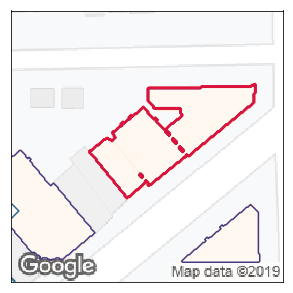

800
3441.25
4674
Elapsed time:  4.257038831710815


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


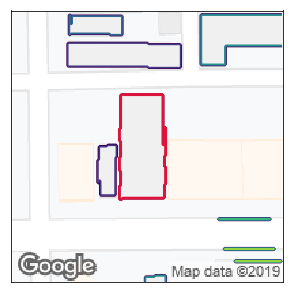

801
5543.05
2459
Elapsed time:  5.289934158325195


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


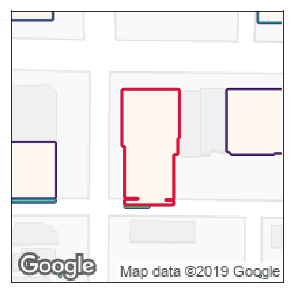

802
3878.95
3308
Elapsed time:  4.932437181472778


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


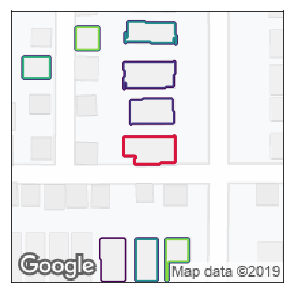

803
1258.5
700
Elapsed time:  4.47707986831665


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


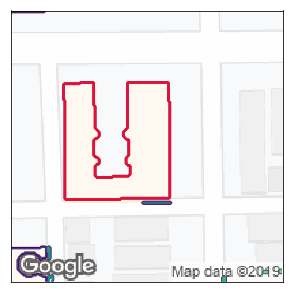

804
10537.625
4904
Elapsed time:  6.000157594680786


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


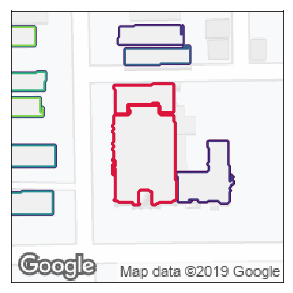

805
9670.86748047
3697
Elapsed time:  5.797320127487183


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


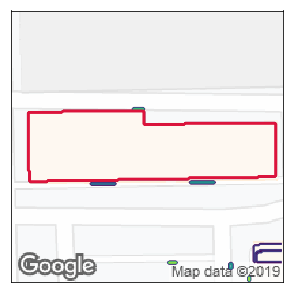

806
17873.915
8167
Elapsed time:  6.072742462158203


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


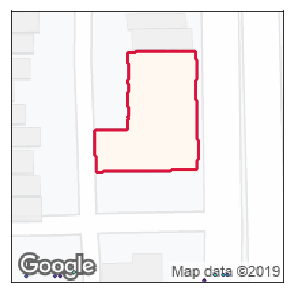

807
5407.475
5145
Elapsed time:  6.176388502120972


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


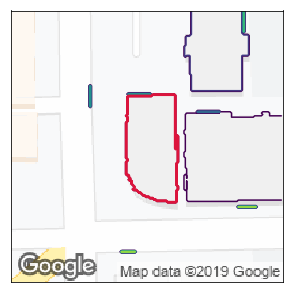

808
7389.875
2681
Elapsed time:  4.720692873001099


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


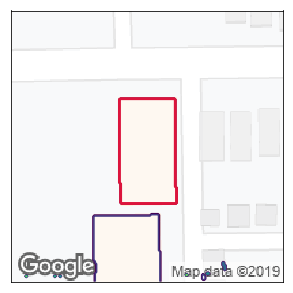

809
6992.125
3154
Elapsed time:  6.004894495010376


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


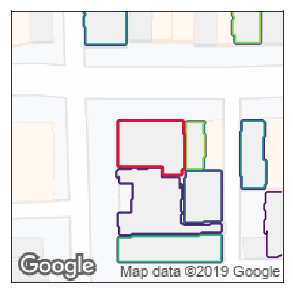

810
3559.14675896
1744
Elapsed time:  5.6095592975616455


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


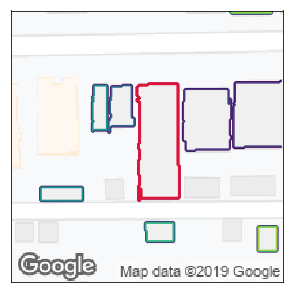

811
4435.375
2409
Elapsed time:  4.4397149085998535


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


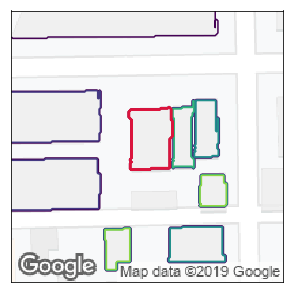

812
3209.87
1279
Elapsed time:  5.236923933029175


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


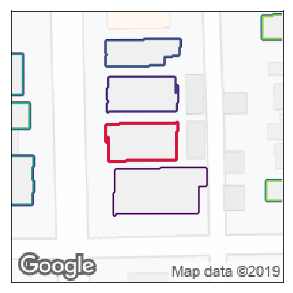

813
2680.875
1384
Elapsed time:  5.165523529052734


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


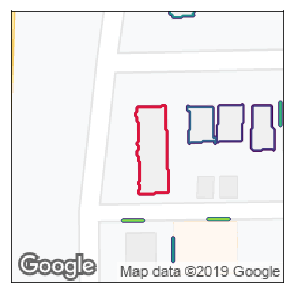

814
2683.75
1339
Elapsed time:  5.097137451171875


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


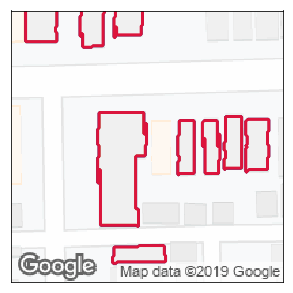

815
1274.25
33815
Elapsed time:  6.231015205383301


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


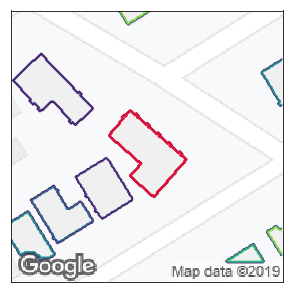

816
2942.0
1616
Elapsed time:  5.5526838302612305


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


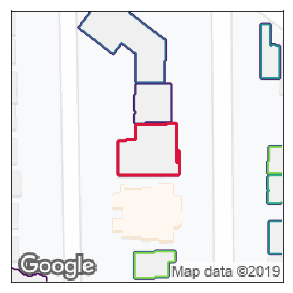

817
3525.75
1476
Elapsed time:  5.8215038776397705


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


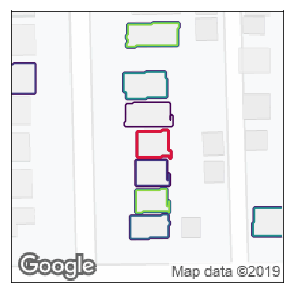

818
942.25
447
Elapsed time:  6.744773864746094


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


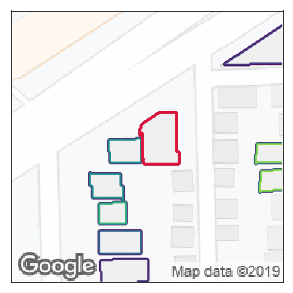

819
2952.75
924
Elapsed time:  5.339188814163208


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


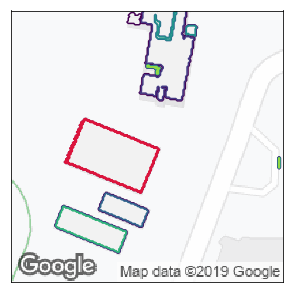

820
4650.5
2039
Elapsed time:  4.067201137542725


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


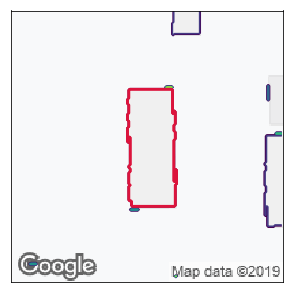

821
5089.5
2852
Elapsed time:  4.801351070404053


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


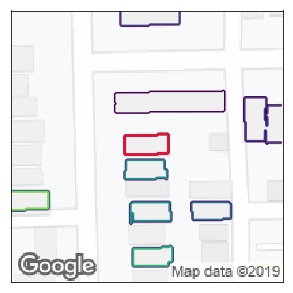

822
1126.875
448
Elapsed time:  4.5402421951293945


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


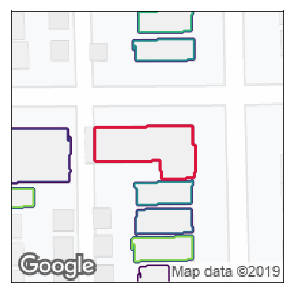

823
4250.625
2173
Elapsed time:  5.0986645221710205


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


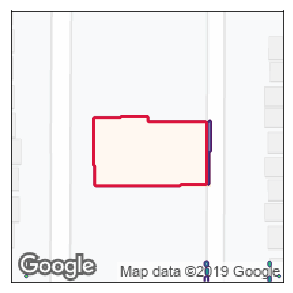

824
10288.75
4007
Elapsed time:  5.143378019332886


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


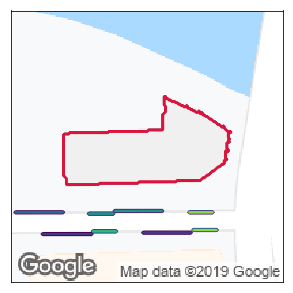

825
12258.62
4973
Elapsed time:  5.28632116317749


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


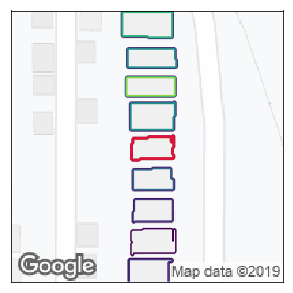

826
1132.375
478
Elapsed time:  5.503971815109253


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


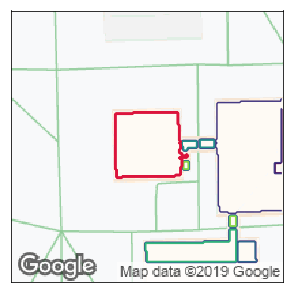

827
4969.125
2217
Elapsed time:  6.7681801319122314


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


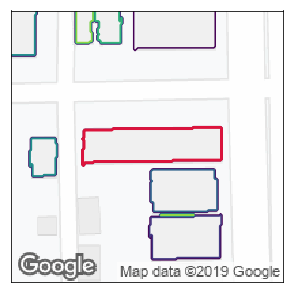

828
6377.25
2408
Elapsed time:  4.913653612136841


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


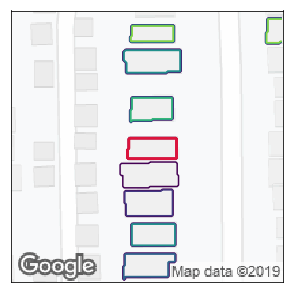

829
1402.5
532
Elapsed time:  4.44474196434021


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


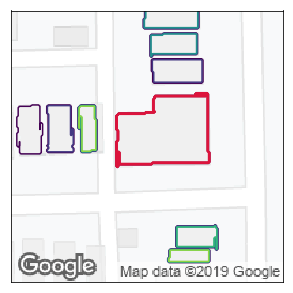

830
3414.05
2963
Elapsed time:  8.101521015167236


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


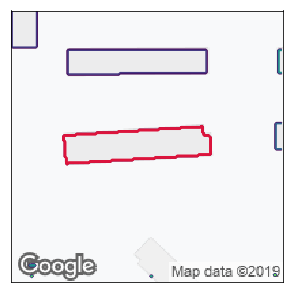

831
4932.125
2177
Elapsed time:  5.920792102813721


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


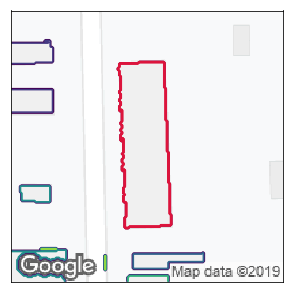

832
7918.125
3972
Elapsed time:  5.344693422317505


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


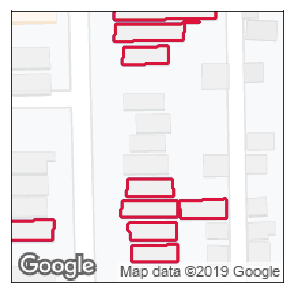

833
623.42
35720
Elapsed time:  5.728513956069946


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


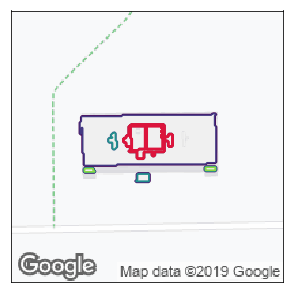

834
8435.875
221
Elapsed time:  5.945553302764893


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


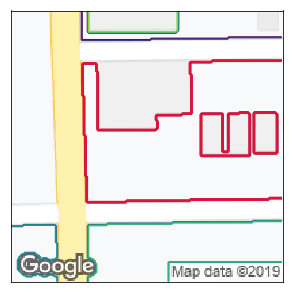

835
2900.125
10163
Elapsed time:  6.525725841522217


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


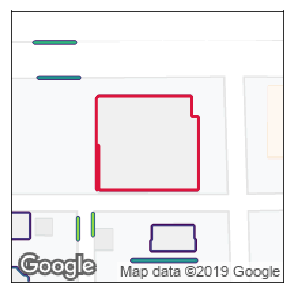

836
11115.5
5066
Elapsed time:  5.637422323226929


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


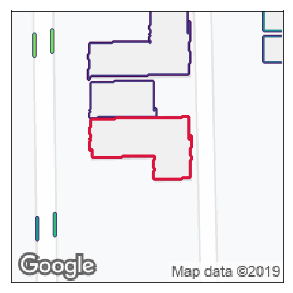

837
4905.5
2505
Elapsed time:  4.867408752441406


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


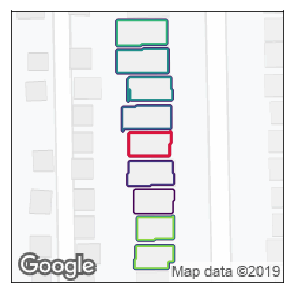

838
1128.5
519
Elapsed time:  6.221884489059448


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


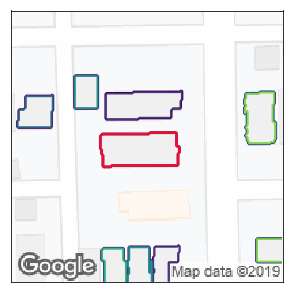

839
2510.5
1312
Elapsed time:  4.592111587524414


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


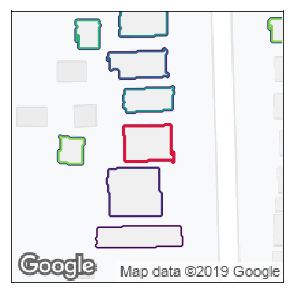

840
1414.875
891
Elapsed time:  6.81986403465271


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


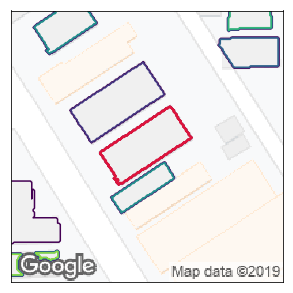

841
3244.25
1729
Elapsed time:  6.231482744216919


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


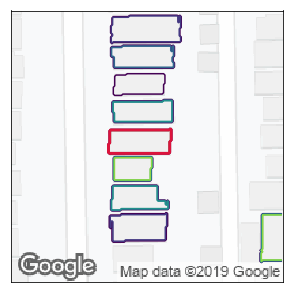

842
1440.125
764
Elapsed time:  6.2653656005859375


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


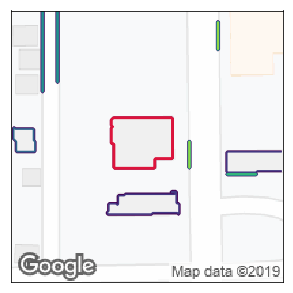

843
3060.75
1536
Elapsed time:  6.7063984870910645


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


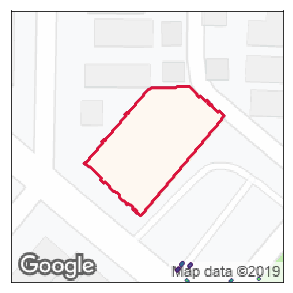

844
10856.75
5008
Elapsed time:  5.367910861968994


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


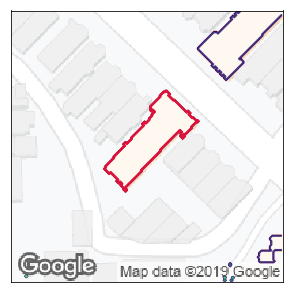

845
4016.875
1722
Elapsed time:  4.552680492401123


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


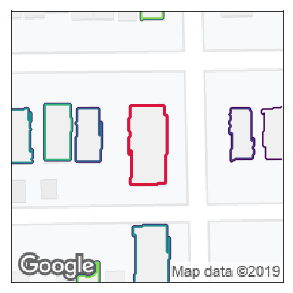

846
3303.75
1527
Elapsed time:  6.199370861053467


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


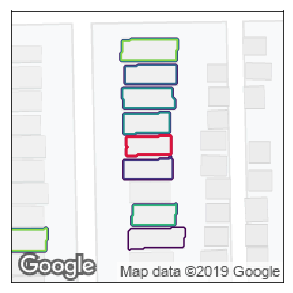

847
866.75
445
Elapsed time:  5.453130483627319


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


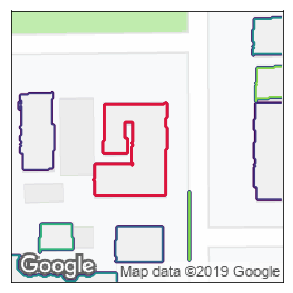

848
8094.75
2942
Elapsed time:  5.172633647918701


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


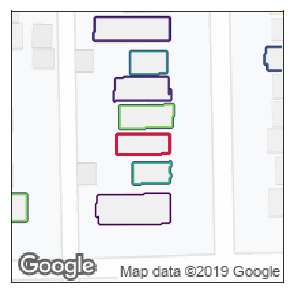

849
1376.0
579
Elapsed time:  4.59621524810791


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


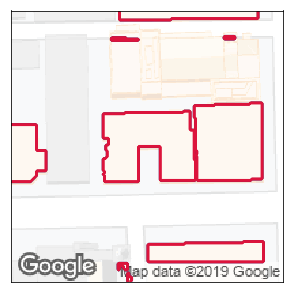

850
6144.75
31585
Elapsed time:  5.229672431945801


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


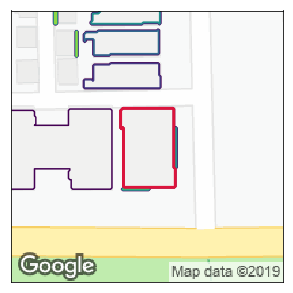

851
5009.625
2188
Elapsed time:  5.077365875244141


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


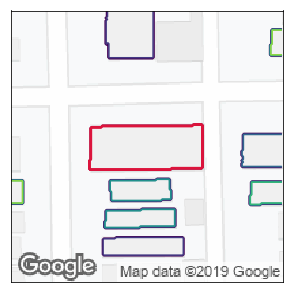

852
4981.375
2607
Elapsed time:  5.1206374168396


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


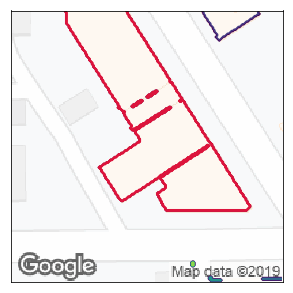

853
2642.5
8444
Elapsed time:  4.6830949783325195


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


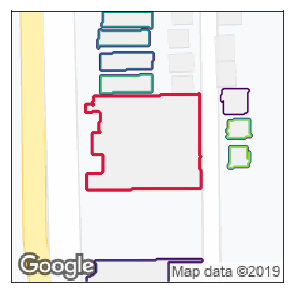

854
11721.375
5319
Elapsed time:  4.847136735916138


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


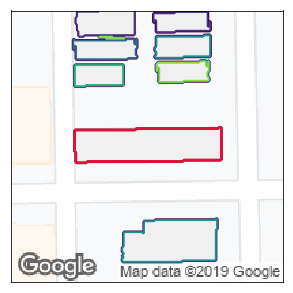

855
4801.0
2522
Elapsed time:  4.679946422576904


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


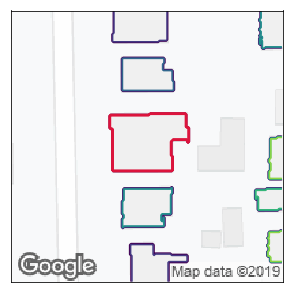

856
4326.5
2040
Elapsed time:  5.163948059082031


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


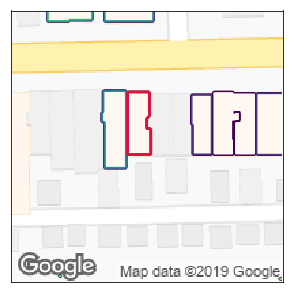

857
2580.375
738
Elapsed time:  3.9692370891571045


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


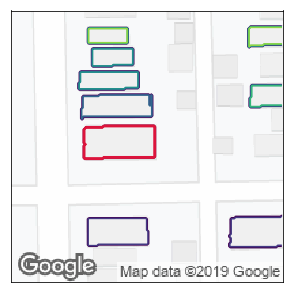

858
3345.0
1194
Elapsed time:  5.575024127960205


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


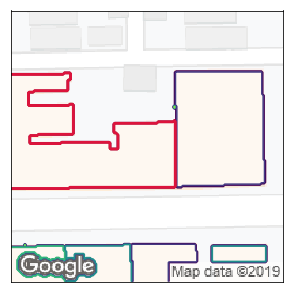

859
4202.575
6330
Elapsed time:  4.94816255569458


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


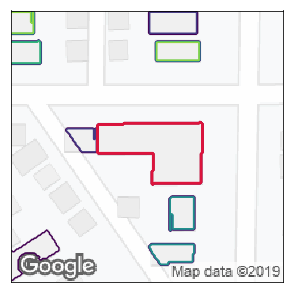

860
5453.5
2456
Elapsed time:  5.1484150886535645


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


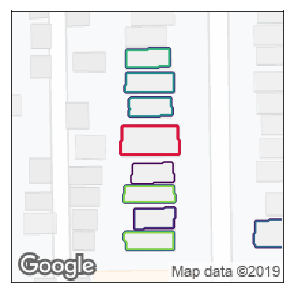

861
1277.5
882
Elapsed time:  6.267893552780151


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


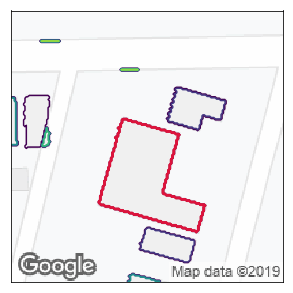

862
7096.75
3446
Elapsed time:  5.061641454696655


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


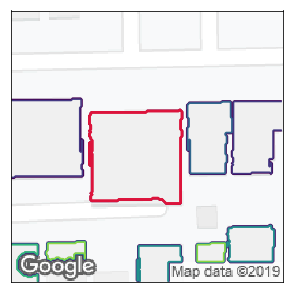

863
4963.875
4301
Elapsed time:  5.002114534378052


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


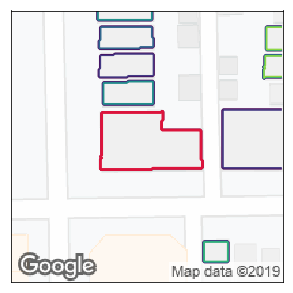

864
5674.5
2675
Elapsed time:  5.294390439987183


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


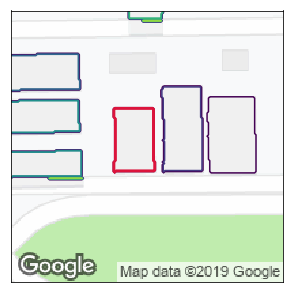

865
3098.25
1310
Elapsed time:  4.854774236679077


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


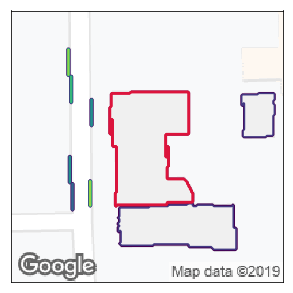

866
8730.875
4013
Elapsed time:  4.498158693313599


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


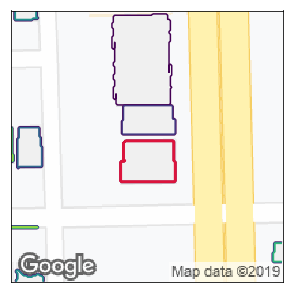

867
4586.9
1153
Elapsed time:  5.576327562332153


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


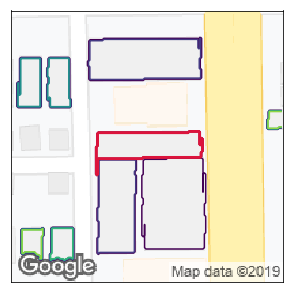

868
3653.55
1431
Elapsed time:  5.196083307266235


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


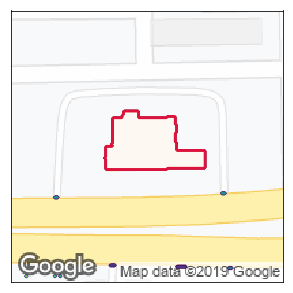

869
5125.475
2190
Elapsed time:  7.0208213329315186


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


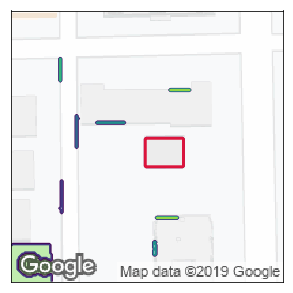

870
7065.375
588
Elapsed time:  5.861688613891602


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


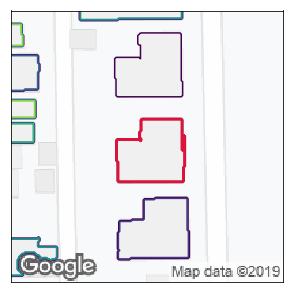

871
3727.125
1973
Elapsed time:  5.352959394454956


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


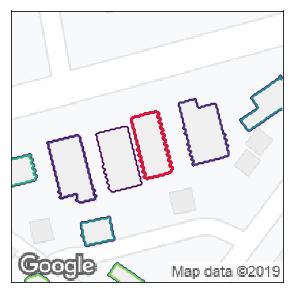

872
1826.5
923
Elapsed time:  6.108975172042847


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


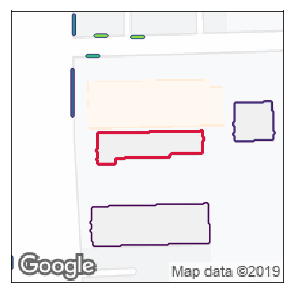

873
3420.375
1433
Elapsed time:  5.722462177276611


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


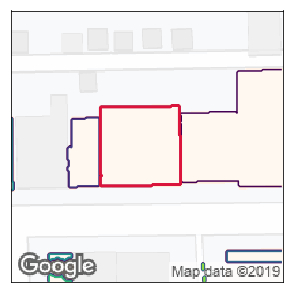

874
7724.5
3385
Elapsed time:  4.799550771713257


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


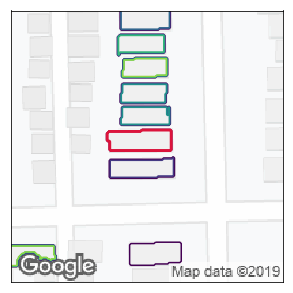

875
1391.125
665
Elapsed time:  5.919131278991699


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


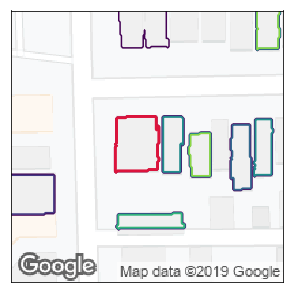

876
4078.625
1212
Elapsed time:  5.203977584838867


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


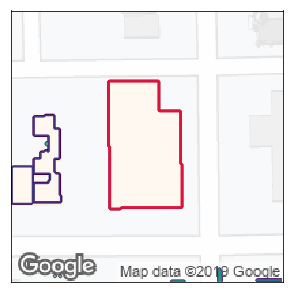

877
5868.0
4572
Elapsed time:  5.875045299530029


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


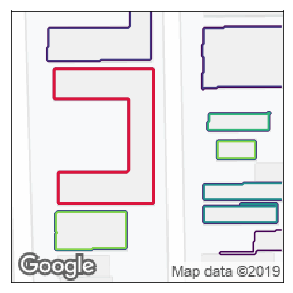

878
9566.375
4189
Elapsed time:  6.563655614852905


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


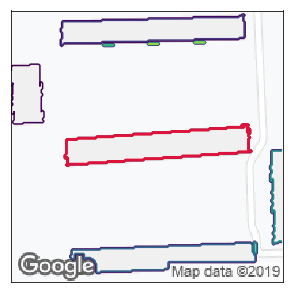

879
6106.875
2493
Elapsed time:  5.2121970653533936


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


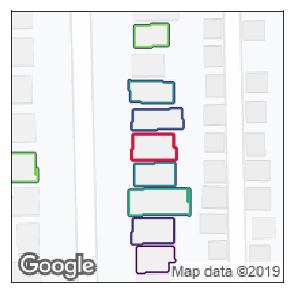

880
1111.0
596
Elapsed time:  5.8963117599487305


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


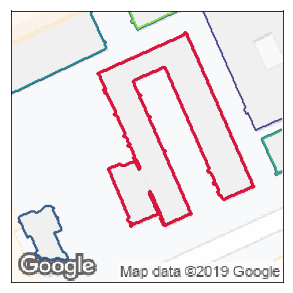

881
15351.25
6935
Elapsed time:  5.459873914718628


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


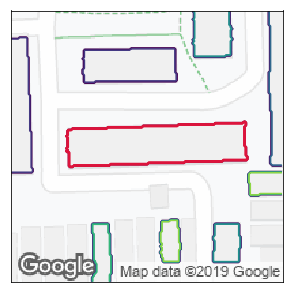

882
8273.0
3537
Elapsed time:  4.0047008991241455


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


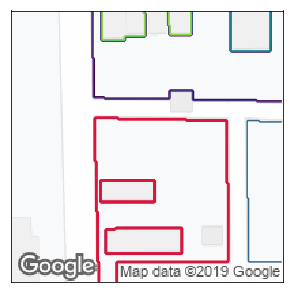

883
2881.25
8617
Elapsed time:  5.100682258605957


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


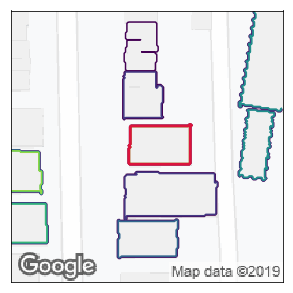

884
2699.5
1247
Elapsed time:  5.459950923919678


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


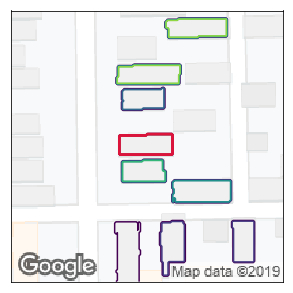

885
1392.625
565
Elapsed time:  5.432630300521851


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


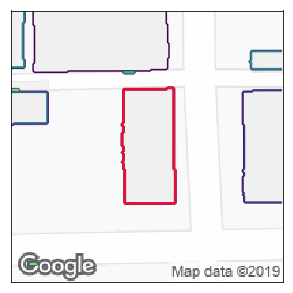

886
5790.375
3127
Elapsed time:  7.6781768798828125


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


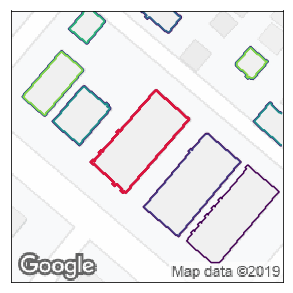

887
3978.0
2338
Elapsed time:  6.398912668228149


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


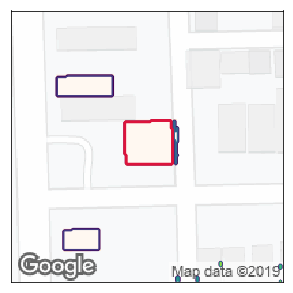

888
2789.375
1088
Elapsed time:  6.261502981185913


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


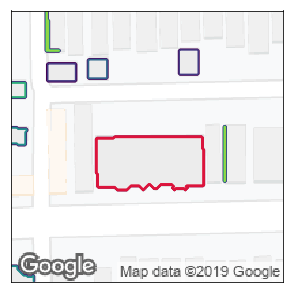

889
10769.43
2883
Elapsed time:  5.949170112609863


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


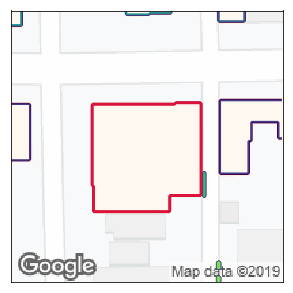

890
4644.875
6044
Elapsed time:  5.09858775138855


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


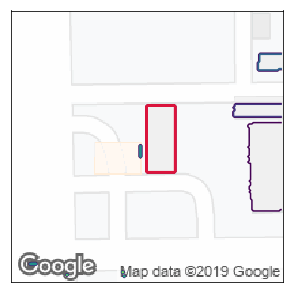

891
3418.125
1029
Elapsed time:  5.772587776184082


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


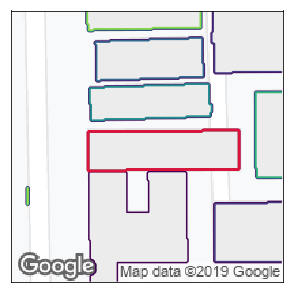

892
5201.28
3163
Elapsed time:  5.695832014083862


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


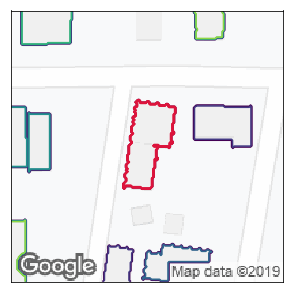

893
2816.375
1526
Elapsed time:  5.423141717910767


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


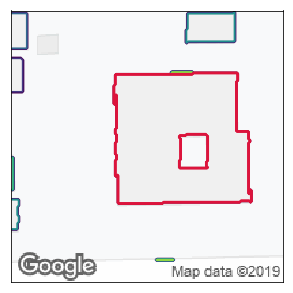

894
18179.5
8356
Elapsed time:  5.853567361831665


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


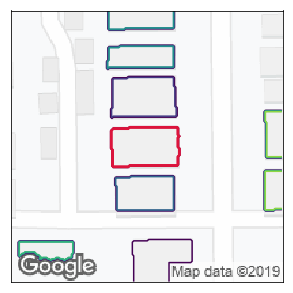

895
3319.875
1365
Elapsed time:  5.880147218704224


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


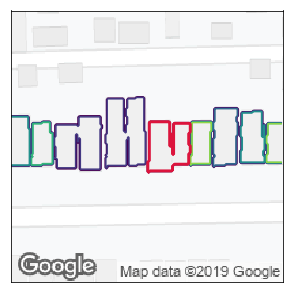

896
1224.5
944
Elapsed time:  4.0742857456207275


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


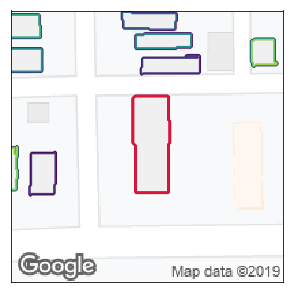

897
4240.965
1791
Elapsed time:  6.013451099395752


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


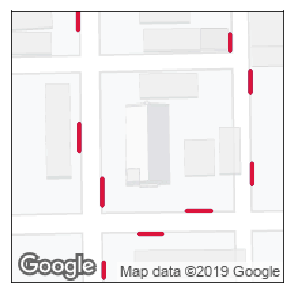

898
3822.5
39848
Elapsed time:  4.842114686965942


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


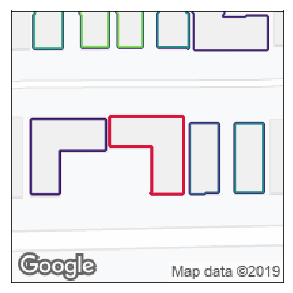

899
4239.75
1994
Elapsed time:  3.955375909805298


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


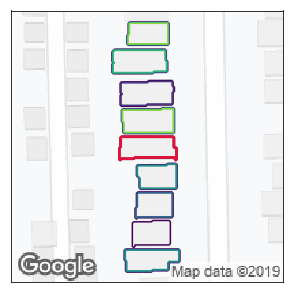

900
1566.75
620
Elapsed time:  6.506916284561157


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


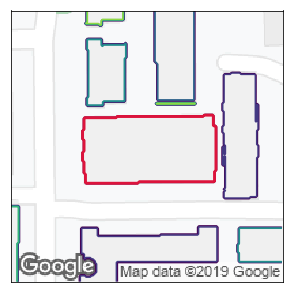

901
9329.25
4664
Elapsed time:  5.418612241744995


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


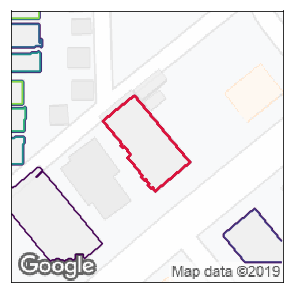

902
4520.5
2018
Elapsed time:  4.9418604373931885


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


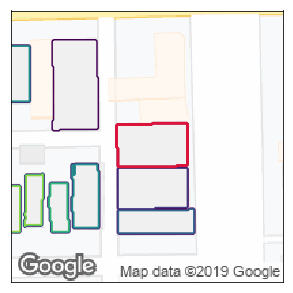

903
3680.25
1616
Elapsed time:  5.585401296615601


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


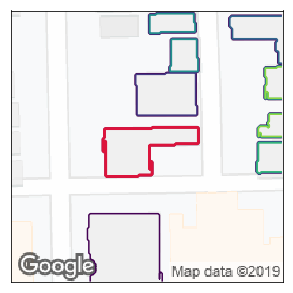

904
3147.795
1594
Elapsed time:  3.9360992908477783


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


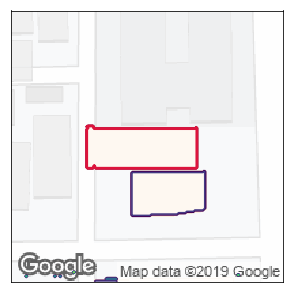

905
5578.25
2357
Elapsed time:  4.450711488723755


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


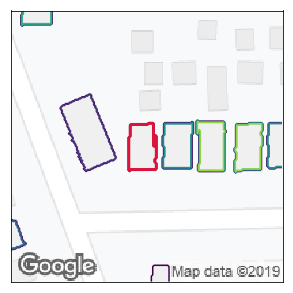

906
1442.125
629
Elapsed time:  5.04164719581604


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


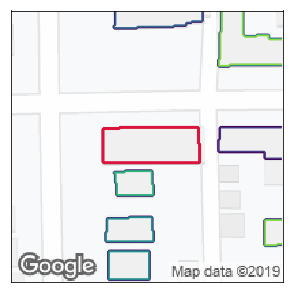

907
3500.25
1822
Elapsed time:  4.175878286361694


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


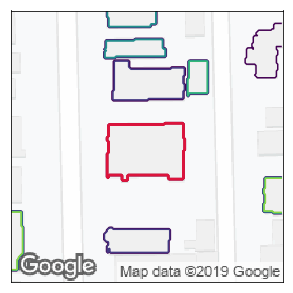

908
4474.895
2128
Elapsed time:  2.8763279914855957


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


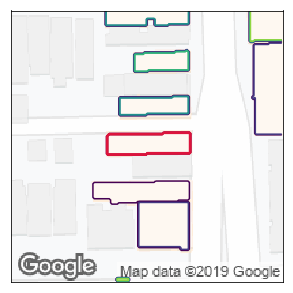

909
2139.75
902
Elapsed time:  3.3111379146575928


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


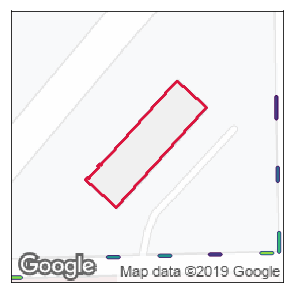

910
6258.375
2895
Elapsed time:  3.291733741760254


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


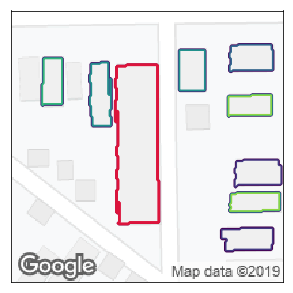

911
6454.805
3469
Elapsed time:  3.5405237674713135


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


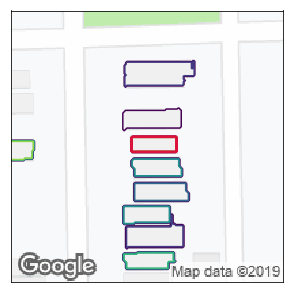

912
933.875
363
Elapsed time:  3.519580841064453


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


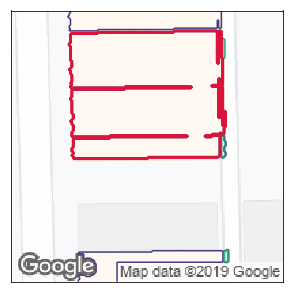

913
3971.06
10017
Elapsed time:  3.318120241165161


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


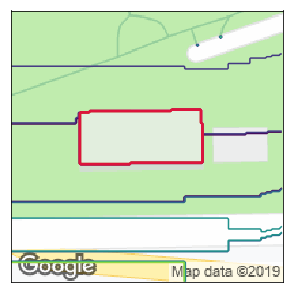

914
6537.375
3463
Elapsed time:  4.196768045425415


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


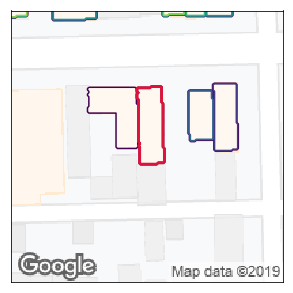

915
3025.0
1004
Elapsed time:  3.6408402919769287


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


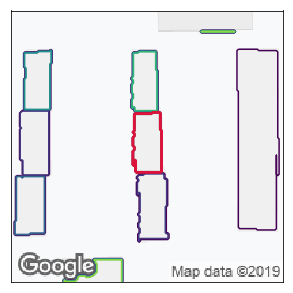

916
6107.875
864
Elapsed time:  3.0099451541900635


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


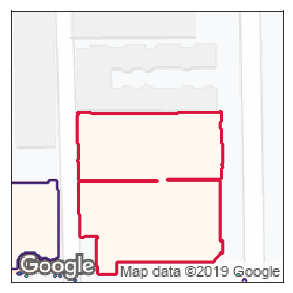

917
9771.0
11235
Elapsed time:  2.7855770587921143


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


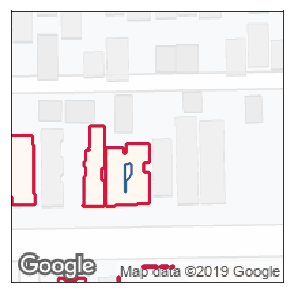

918
2576.875
36934
Elapsed time:  3.546509027481079


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


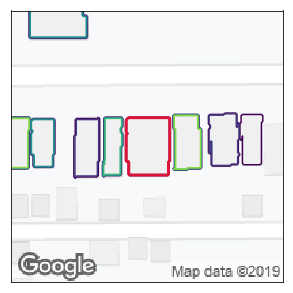

919
2673.75
1312
Elapsed time:  2.6359806060791016


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


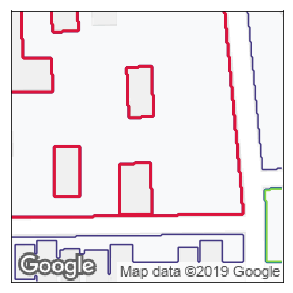

920
3566.375
21215
Elapsed time:  3.4443750381469727


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


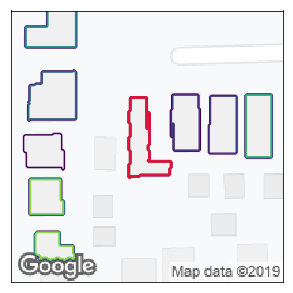

921
2837.5
950
Elapsed time:  3.0319643020629883


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


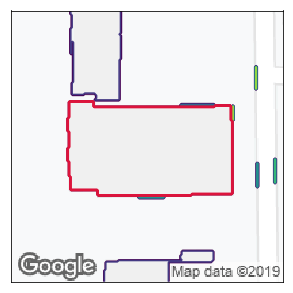

922
17781.5
7770
Elapsed time:  3.079794406890869


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


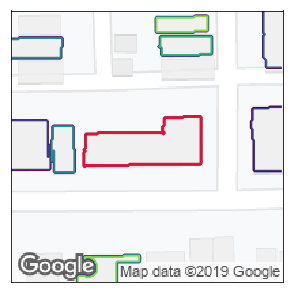

923
4824.5
2303
Elapsed time:  3.5913875102996826


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


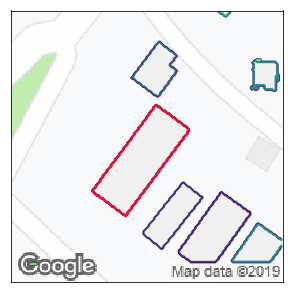

924
7447.625
2414
Elapsed time:  2.8603427410125732


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


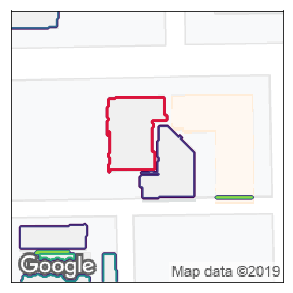

925
8001.875
1881
Elapsed time:  3.710071086883545


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


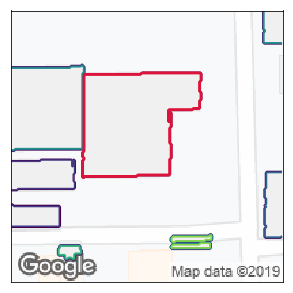

926
12465.455490999999
5353
Elapsed time:  2.9850096702575684


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


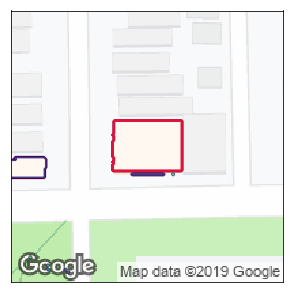

927
3894.25
1869
Elapsed time:  2.8733088970184326


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


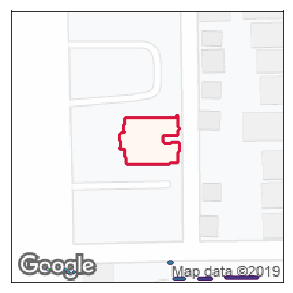

928
3601.75
1313
Elapsed time:  2.69382643699646


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


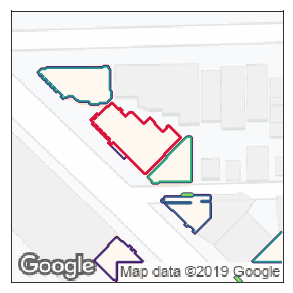

929
5584.04
1571
Elapsed time:  2.9401307106018066


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


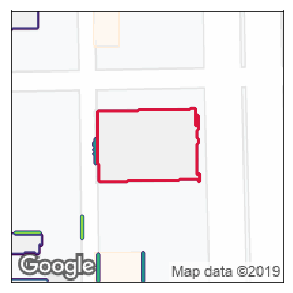

930
8766.5
3778
Elapsed time:  3.263226270675659


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


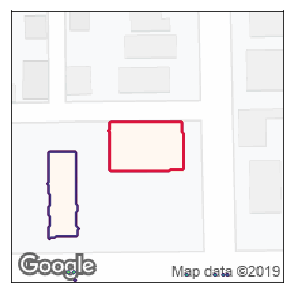

931
4230.75
1927
Elapsed time:  3.7559475898742676


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


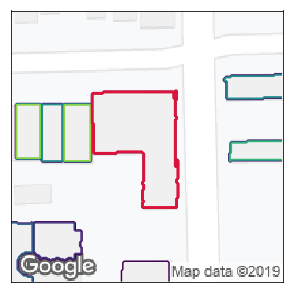

932
5515.175
3689
Elapsed time:  2.5960497856140137


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


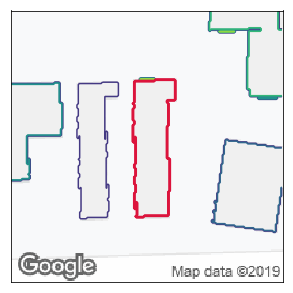

933
4297.25
2540
Elapsed time:  2.7925240993499756


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


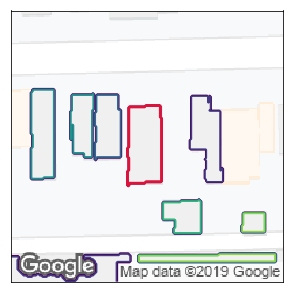

934
3280.76710037
1353
Elapsed time:  3.7176005840301514


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


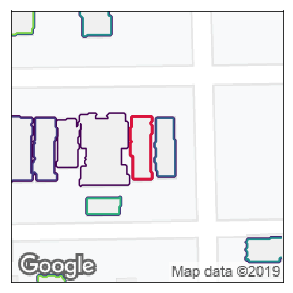

935
2772.06066063
663
Elapsed time:  3.1326167583465576


C:\Anaconda\envs\tensorflow_gpuenv\lib\site-packages\matplotlib\contour.py:1000: UserWarning: The following kwargs were not used by contour: 'contours'
  s)


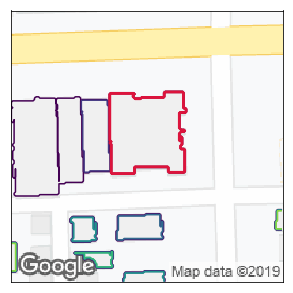

936
8046.10715294
2928


In [87]:
pixel_area_list=[]
##for i in range(10):
for i in range(len(buildings)):
    try:
        #########Cleaning the immage
        img=all_images[i]
        try:
            b = img[:,:,1]
            center = b[95:105, 95:105]
            median=int(np.median(center))
            median
            img_main=b==median
            ##plt.imshow(img_main)
        except:
            b=img
            center = b[95:105, 95:105]
            median=int(np.median(center))
            median
            img_main=b==median
            plt.imshow(img_main)
        #### Seperating buildings
        st = time.time()
        X = np.reshape(img_main, (-1, 1))

        connectivity = grid_to_graph(*img_main.shape)

        n_clusters =10  # number of regions
        ward = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', connectivity=connectivity)
        ward.fit(X)
        label = np.reshape(ward.labels_, img_main.shape)
        #### isoliating the middle cluster and calculating area
        center = label[95:105, 95:105]
        median=int(np.median(center))
        median
        label_main=label==median
        label_main=label_main.astype(int)
        pixel_area=sum(1 for row in label      for i in row if i==median)
        print("Elapsed time: ", time.time() - st)
        # Plot the results on an image
        image=img
        plt.figure(figsize=(5, 5))
        plt.imshow(image, cmap=plt.cm.gray)
        plt.contour(label, contours=1)
        plt.contour(label_main, contours=1,colors=['#DC143C'])
        plt.xticks(())
        plt.yticks(())
        plt.show()

        print (i)
        print(buildings['shape_area'][i])
        print (pixel_area)
        pixel_area_list.append(pixel_area)
    except:
        print (i)
        print ("Fail")
        pixel_area_list.append(-5)

In [88]:
buildings['pixel_area']=pixel_area_list


In [89]:
buildings.tail()

,index,bldg_id,bldg_sq_fo,footprint_,no_of_unit,no_stories,orig_bldg_,pre_dir1,shape_area,shape_len,...,y_coord,year_built,z_coord,rand,sample,AreaSqMi,CentroidX,CentroidY,latlong,pixel_area
932,6193,864076,0,AERIALS,0,0,371867,W,5515.175000,466.993519,...,1.894664e+06,0,0,0.051772,1,0.000198,-87.715647,41.866939,"-87.7156474906349,41.8669388683115",3689
933,6200,768689,0,AERIALS98,0,0,768689,W,4297.250000,381.650699,...,1.831156e+06,0,0,0.052734,1,0.000154,-87.672619,41.692281,"-87.6726185663741,41.6922812585779",2540
934,6217,887688,0,AERIALS,0,0,887688,W,3280.767100,243.757800,...,1.903494e+06,2007,0,0.119233,1,0.000118,-87.663217,41.890758,"-87.6632174015625,41.890758344616",1353
935,6222,887432,0,AERIALS,0,0,887432,W,2772.060661,241.616931,...,1.897947e+06,2007,0,0.079397,1,0.000099,-87.730626,41.875900,"-87.7306256898249,41.8759004869154",663
936,6224,886917,0,AERIALS,0,0,886917,W,8046.107153,407.695641,...,1.925606e+06,2007,0,0.047980,1,0.000289,-87.817354,41.952238,"-87.8173539503519,41.9522384680749",2928


In [90]:
buildings.to_csv('chicago_buildings_sample_clean_pixel_area.csv', index=False)


In [50]:
buildings = pd.read_csv("chicago_buildings_sample_clean_pixel_area.csv") 
buildings.head()

,index,bldg_id,bldg_sq_fo,footprint_,no_of_unit,no_stories,orig_bldg_,pre_dir1,shape_area,shape_len,...,y_coord,year_built,z_coord,rand,sample,AreaSqMi,CentroidX,CentroidY,latlong,pixel_area
0,3,455892,1480,AERIALS98,2,0,455892,S,873.750,128.582300,...,1.871774e+06,1918,0,0.012691,1,0.000031,-87.655350,41.803660,"-87.6553496217099,41.8036596151415",435
1,7,845465,0,AERIALS,0,0,845465,W,17864.485,704.144707,...,1.927450e+06,2006,0,0.040056,1,0.000641,-87.787886,41.957307,"-87.7878860608839,41.9573071437222",7949
2,12,362554,48500,AERIALS98,0,0,362554,S,9656.500,393.081421,...,1.898285e+06,1920,0,0.068290,1,0.000346,-87.651559,41.876377,"-87.6515591622159,41.8763772601835",4373
3,13,183757,0,AERIALS98,8,0,183757,W,3075.625,270.228296,...,1.923501e+06,1968,0,0.129195,1,0.000110,-87.762089,41.946197,"-87.7620892177341,41.9461967538786",1632
4,16,374824,0,AERIALS98,0,0,374824,W,7466.875,609.748992,...,1.893057e+06,0,0,0.025851,1,0.000268,-87.660486,41.862177,"-87.660486146882,41.8621767117838",3145


# building of models

In [51]:
import statsmodels.api as sm

In [52]:
buildings_model=buildings
buildings_model['intercept']=1
buildings_model.head()

,index,bldg_id,bldg_sq_fo,footprint_,no_of_unit,no_stories,orig_bldg_,pre_dir1,shape_area,shape_len,...,year_built,z_coord,rand,sample,AreaSqMi,CentroidX,CentroidY,latlong,pixel_area,intercept
0,3,455892,1480,AERIALS98,2,0,455892,S,873.750,128.582300,...,1918,0,0.012691,1,0.000031,-87.655350,41.803660,"-87.6553496217099,41.8036596151415",435,1
1,7,845465,0,AERIALS,0,0,845465,W,17864.485,704.144707,...,2006,0,0.040056,1,0.000641,-87.787886,41.957307,"-87.7878860608839,41.9573071437222",7949,1
2,12,362554,48500,AERIALS98,0,0,362554,S,9656.500,393.081421,...,1920,0,0.068290,1,0.000346,-87.651559,41.876377,"-87.6515591622159,41.8763772601835",4373,1
3,13,183757,0,AERIALS98,8,0,183757,W,3075.625,270.228296,...,1968,0,0.129195,1,0.000110,-87.762089,41.946197,"-87.7620892177341,41.9461967538786",1632,1
4,16,374824,0,AERIALS98,0,0,374824,W,7466.875,609.748992,...,0,0,0.025851,1,0.000268,-87.660486,41.862177,"-87.660486146882,41.8621767117838",3145,1


In [53]:
buildings_model.describe()

,index,bldg_id,bldg_sq_fo,no_of_unit,no_stories,orig_bldg_,shape_area,shape_len,stories,suf_dir1,...,y_coord,year_built,z_coord,rand,sample,AreaSqMi,CentroidX,CentroidY,pixel_area,intercept
count,937.000000,937.000000,937.000000,937.000000,937.0,937.000000,937.000000,937.000000,937.000000,0.0,...,9.370000e+02,937.000000,937.0,937.000000,937.0,937.000000,937.000000,937.000000,937.00000,937.0
mean,3092.216649,472505.219851,2080.750267,3.452508,0.0,421911.326574,4808.551025,322.236247,1.534685,NaN,...,1.892814e+06,1362.846318,0.0,0.076297,1.0,0.000172,-87.679409,41.861519,3901.89968,1.0
std,1791.734716,279062.622904,4574.357792,10.351315,0.0,260634.747770,3762.223360,164.466057,2.021551,NaN,...,3.554593e+04,886.061654,0.0,0.042408,0.0,0.000135,0.060221,0.097737,6717.77061,0.0
min,3.000000,285.000000,0.000000,0.000000,0.0,285.000000,367.125000,77.814804,0.000000,NaN,...,1.814391e+06,0.000000,0.0,0.000479,1.0,0.000013,-87.840100,41.645942,72.00000,1.0
25%,1564.000000,238115.000000,0.000000,0.000000,0.0,202833.000000,2637.000000,229.079305,0.000000,NaN,...,1.861422e+06,0.000000,0.0,0.038980,1.0,0.000095,-87.717432,41.775381,1104.00000,1.0
50%,3082.000000,459030.000000,0.000000,0.000000,0.0,393160.000000,3525.750000,287.809815,1.000000,NaN,...,1.901106e+06,1917.000000,0.0,0.077621,1.0,0.000126,-87.673234,41.884263,1764.00000,1.0
75%,4610.000000,738245.000000,2192.000000,2.000000,0.0,630860.000000,5961.375000,382.981078,2.000000,NaN,...,1.924370e+06,1952.000000,0.0,0.111727,1.0,0.000214,-87.642024,41.948449,3636.00000,1.0
max,6224.000000,893714.000000,49200.000000,130.000000,0.0,893714.000000,19996.625000,1618.417519,32.000000,NaN,...,1.950586e+06,2010.000000,0.0,0.149981,1.0,0.000717,-87.532190,42.020043,39989.00000,1.0


In [54]:
lm=sm.OLS(buildings_model['shape_area'],buildings_model['pixel_area'])
results = lm.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             shape_area   R-squared (uncentered):                   0.239
Model:                            OLS   Adj. R-squared (uncentered):              0.238
Method:                 Least Squares   F-statistic:                              294.3
Date:                Tue, 01 Oct 2019   Prob (F-statistic):                    1.43e-57
Time:                        21:38:48   Log-Likelihood:                         -9369.0
No. Observations:                 937   AIC:                                  1.874e+04
Df Residuals:                     936   BIC:                                  1.874e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
pixel_area     0.3845      0.022     17.155      0.000       0.340       0.428
==============================================================================
Omnibus:                      121.985   Durbin-Watson:                   1.222
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              795.694
Skew:                          -0.377   Prob(JB):                    1.65e-173
Kurtosis:                       7.451   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [58]:
buildings_model=(buildings_model[buildings_model.pixel_area >0])
##buildings_model=(buildings_model[buildings_model.accuracy=="ROOFTOP"])
buildings_model=(buildings_model[buildings_model.pixel_area <10000])##.reset_index()

In [59]:
buildings_model['shape_area'].describe()

count      874.000000
mean      4770.389041
std       3675.897937
min        486.500000
25%       2647.598750
50%       3513.250000
75%       5913.625000
max      19996.625000
Name: shape_area, dtype: float64

In [60]:
buildings_model['pixel_area'].describe()

count     874.000000
mean     2333.310069
std      1951.728638
min        72.000000
25%      1035.250000
50%      1634.500000
75%      3066.250000
max      9961.000000
Name: pixel_area, dtype: float64

In [61]:
buildings_model=(buildings_model[buildings_model.pixel_area <10000])##.reset_index()

In [62]:
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.sandbox.regression.predstd import wls_prediction_std

In [63]:
X = (buildings_model['pixel_area'])
y=buildings_model['shape_area']
lm=sm.OLS(y,X)
res = sm.OLS(y, X).fit()
print(res.summary())

                                 OLS Regression Results                                
Dep. Variable:             shape_area   R-squared (uncentered):                   0.792
Model:                            OLS   Adj. R-squared (uncentered):              0.792
Method:                 Least Squares   F-statistic:                              3331.
Date:                Tue, 01 Oct 2019   Prob (F-statistic):                   3.25e-300
Time:                        21:39:01   Log-Likelihood:                         -8159.7
No. Observations:                 874   AIC:                                  1.632e+04
Df Residuals:                     873   BIC:                                  1.633e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

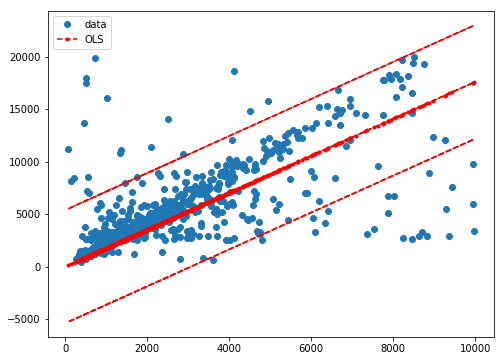

In [64]:
prstd, iv_l, iv_u = wls_prediction_std(res)

fig, ax = plt.subplots(figsize=(8,6))
x=X
y_true=y
ax.plot(x, y, 'o', label="data")

ax.plot(x, res.fittedvalues, 'r--.', label="OLS")
ax.plot(x, iv_u, 'r--')
ax.plot(x, iv_l, 'r--')
ax.legend(loc='best');

In [65]:
buildings_model=(buildings_model[buildings_model.pixel_area >0])
##buildings_model=(buildings_model[buildings_model.accuracy=="ROOFTOP"])
##buildings_model=(buildings_model[buildings_model.SHAPE_AREA <100000])##.reset_index()

                                 OLS Regression Results                                
Dep. Variable:             shape_area   R-squared (uncentered):                   0.792
Model:                            OLS   Adj. R-squared (uncentered):              0.792
Method:                 Least Squares   F-statistic:                              3331.
Date:                Tue, 01 Oct 2019   Prob (F-statistic):                   3.25e-300
Time:                        21:39:04   Log-Likelihood:                         -8159.7
No. Observations:                 874   AIC:                                  1.632e+04
Df Residuals:                     873   BIC:                                  1.633e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

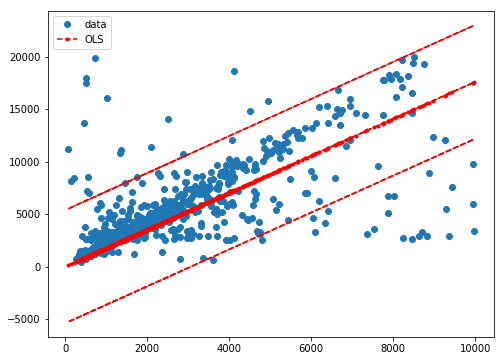

In [66]:
X = (buildings_model['pixel_area'])
y=buildings_model['shape_area']
lm=sm.OLS(y,X)
res = sm.OLS(y, X).fit()
print(res.summary())
prstd, iv_l, iv_u = wls_prediction_std(res)

fig, ax = plt.subplots(figsize=(8,6))
x=X
y_true=y
ax.plot(x, y, 'o', label="data")

ax.plot(x, res.fittedvalues, 'r--.', label="OLS")
ax.plot(x, iv_u, 'r--')
ax.plot(x, iv_l, 'r--')
ax.legend(loc='best');

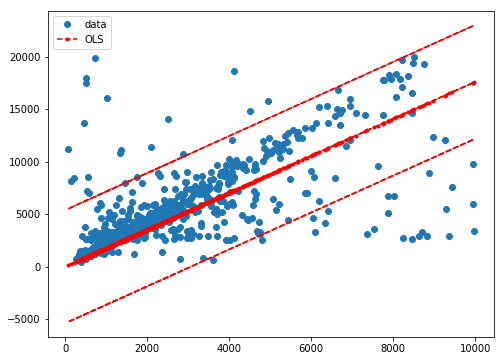

In [67]:
prstd, iv_l, iv_u = wls_prediction_std(res)

fig, ax = plt.subplots(figsize=(8,6))
x=X
y_true=y
ax.plot(x, y, 'o', label="data")

ax.plot(x, res.fittedvalues, 'r--.', label="OLS")
ax.plot(x, iv_u, 'r--')
ax.plot(x, iv_l, 'r--')
ax.legend(loc='best');

In [68]:
 buildings_model.describe()

,index,bldg_id,bldg_sq_fo,no_of_unit,no_stories,orig_bldg_,shape_area,shape_len,stories,suf_dir1,...,y_coord,year_built,z_coord,rand,sample,AreaSqMi,CentroidX,CentroidY,pixel_area,intercept
count,874.000000,874.000000,874.000000,874.000000,874.0,874.000000,874.000000,874.000000,874.000000,0.0,...,8.740000e+02,874.000000,874.0,874.000000,874.0,874.000000,874.000000,874.000000,874.000000,874.0
mean,3096.257437,472470.784897,2132.076659,3.556064,0.0,421905.874142,4770.389041,320.795031,1.517162,NaN,...,1.892532e+06,1377.207094,0.0,0.076295,1.0,0.000171,-87.678996,41.860740,2333.310069,1.0
std,1789.968892,281098.379006,4661.731165,10.597594,0.0,262511.951662,3675.897937,161.606365,1.746947,NaN,...,3.597710e+04,879.973739,0.0,0.042030,0.0,0.000132,0.060700,0.098924,1951.728638,0.0
min,3.000000,285.000000,0.000000,0.000000,0.0,285.000000,486.500000,90.050911,0.000000,NaN,...,1.814391e+06,0.000000,0.0,0.000479,1.0,0.000017,-87.840100,41.645942,72.000000,1.0
25%,1571.250000,228980.750000,0.000000,0.000000,0.0,190391.500000,2647.598750,231.375861,0.000000,NaN,...,1.860741e+06,0.000000,0.0,0.039584,1.0,0.000095,-87.716090,41.773211,1035.250000,1.0
50%,3080.000000,460008.000000,0.000000,0.000000,0.0,394558.000000,3513.250000,287.168894,1.000000,NaN,...,1.901057e+06,1920.000000,0.0,0.077047,1.0,0.000126,-87.673890,41.883956,1634.500000,1.0
75%,4627.000000,742462.000000,2293.000000,2.000000,0.0,639278.250000,5913.625000,379.045828,2.000000,NaN,...,1.924963e+06,1952.000000,0.0,0.110510,1.0,0.000212,-87.641762,41.949836,3066.250000,1.0
max,6224.000000,893714.000000,49200.000000,130.000000,0.0,893714.000000,19996.625000,1618.417519,19.000000,NaN,...,1.950586e+06,2010.000000,0.0,0.149957,1.0,0.000717,-87.532190,42.020043,9961.000000,1.0


In [76]:
 buildings_model['rand'].describe()

count    800.000000
mean       0.076083
std        0.042003
min        0.000479
25%        0.038986
50%        0.077398
75%        0.110029
max        0.149957
Name: rand, dtype: float64

## adding cooks distance from 
http://mpastell.com/2013/04/19/python_regression/

<StemContainer object of 3 artists>

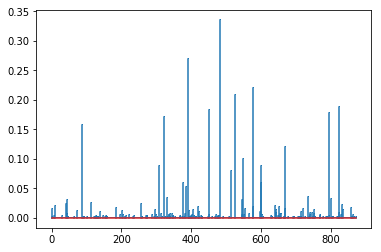

In [69]:
fitted = lm.fit()
influence = fitted.get_influence()
#c is the distance and p is p-value
(c, p) = influence.cooks_distance
plt.stem(np.arange(len(c)), c, markerfmt=",")

In [70]:
len(c)

874

In [71]:
buildings_model['cooks_distance']=c

In [72]:
4/874

0.004576659038901602

In [73]:
buildings_model=(buildings_model[buildings_model.cooks_distance<4/874])

                                 OLS Regression Results                                
Dep. Variable:             shape_area   R-squared (uncentered):                   0.867
Model:                            OLS   Adj. R-squared (uncentered):              0.867
Method:                 Least Squares   F-statistic:                              5220.
Date:                Tue, 01 Oct 2019   Prob (F-statistic):                        0.00
Time:                        21:39:12   Log-Likelihood:                         -7178.9
No. Observations:                 800   AIC:                                  1.436e+04
Df Residuals:                     799   BIC:                                  1.436e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

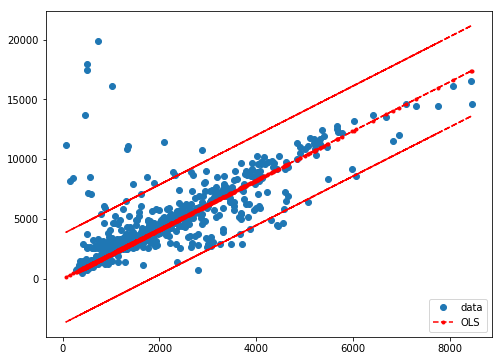

In [74]:
X = (buildings_model['pixel_area'])
y=buildings_model['shape_area']
lm=sm.OLS(y,X)
res = sm.OLS(y, X).fit()
print(res.summary())
prstd, iv_l, iv_u = wls_prediction_std(res)

fig, ax = plt.subplots(figsize=(8,6))
x=X
y_true=y
ax.plot(x, y, 'o', label="data")

ax.plot(x, res.fittedvalues, 'r--.', label="OLS")
ax.plot(x, iv_u, 'r--')
ax.plot(x, iv_l, 'r--')
ax.legend(loc='best');

In [78]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(buildings_model['pixel_area'], buildings_model['shape_area'], test_size=0.3)


                                 OLS Regression Results                                
Dep. Variable:             shape_area   R-squared (uncentered):                   0.856
Model:                            OLS   Adj. R-squared (uncentered):              0.856
Method:                 Least Squares   F-statistic:                              3327.
Date:                Wed, 02 Oct 2019   Prob (F-statistic):                   1.57e-237
Time:                        19:26:34   Log-Likelihood:                         -5059.7
No. Observations:                 560   AIC:                                  1.012e+04
Df Residuals:                     559   BIC:                                  1.013e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

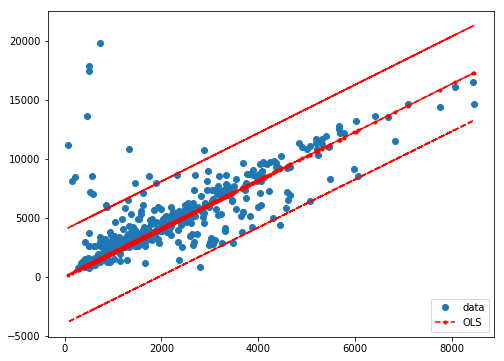

In [79]:
X = x_train
y=y_train
lm=sm.OLS(y,X)
res = sm.OLS(y, X).fit()
print(res.summary())
prstd, iv_l, iv_u = wls_prediction_std(res)

fig, ax = plt.subplots(figsize=(8,6))
x=X
y_true=y
ax.plot(x, y, 'o', label="data")

ax.plot(x, res.fittedvalues, 'r--.', label="OLS")
ax.plot(x, iv_u, 'r--')
ax.plot(x, iv_l, 'r--')
ax.legend(loc='best');

In [107]:
from sklearn.metrics import mean_squared_error,r2_score

In [123]:
x=x_train
y=y_train

# predict for a new observation
fcst=(x)*2.0476

coefficient_of_dermination = r2_score(y, fcst, multioutput='variance_weighted')
coefficient_of_dermination

0.569191260449782

In [124]:
SSres = sum(map(lambda x: (x[0]-x[1])**2, zip(y, fcst)))
SStot = sum([(x)**2 for x in y])
r2=1-(SSres/SStot)
r2

0.8561518207110673

In [125]:
mean_squared_error(y, fcst)

4125312.337301881

In [126]:
x=x_test
y=y_test
from sklearn.metrics import r2_score
# predict for a new observation
fcst=(x)*2.0476

coefficient_of_dermination = r2_score(y, fcst, multioutput='variance_weighted')
coefficient_of_dermination

0.6508127467269865

In [127]:
SSres = sum(map(lambda x: (x[0]-x[1])**2, zip(y, fcst)))
SStot = sum([(x)**2 for x in y])
r2=1-(SSres/SStot)
r2

0.8972748668508688